# Web-scraping & EDA

## The notebook about web-scraping, EDA and feature engineering of Russian day-ahead electricity market prices dataset is located [here.](https://github.com/Backgammonian/Machine-Learning-Tasks/blob/main/Time%20series/Russian%20Day-Ahead%20Electricity%20Market%20Price%20Web-Scraping%20%26%20EDA%20v1.1.ipynb)

# Prepared dataset lookup

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
import numpy as np

#df_sup = pd.read_csv(f'{drive_path}/electricity_price_hourly_2_zone_supplier_price_2021-06-24__2024-06-24.csv', index_col = 'date')
df_sup = pd.read_csv('electricity_price_hourly_2_zone_supplier_price_2021-06-24__2024-06-24.csv', index_col = 'date')
df_sup.index = pd.to_datetime(df_sup.index)
df_sup

,year,quarter,month,week_of_year,day_of_year,day_of_week,day,hour,supplier_price
date,,,,,,,,,
2021-06-24 00:00:00+00:00,2021,2,6,25,175,3,24,0,669.88
2021-06-24 01:00:00+00:00,2021,2,6,25,175,3,24,1,671.66
2021-06-24 02:00:00+00:00,2021,2,6,25,175,3,24,2,674.60
2021-06-24 03:00:00+00:00,2021,2,6,25,175,3,24,3,661.88
2021-06-24 04:00:00+00:00,2021,2,6,25,175,3,24,4,708.72
...,...,...,...,...,...,...,...,...,...
2024-06-24 19:00:00+00:00,2024,2,6,26,176,0,24,19,1193.24
2024-06-24 20:00:00+00:00,2024,2,6,26,176,0,24,20,1062.33
2024-06-24 21:00:00+00:00,2024,2,6,26,176,0,24,21,950.58


In [5]:
print(f'We will use {round(len(df_sup) / 24 / 365, 4)} years of observations of Russian day-ahead electricity market supplier prices')

We will use 3.0055 years of observations of Russian day-ahead electricity market supplier prices


## Price plot

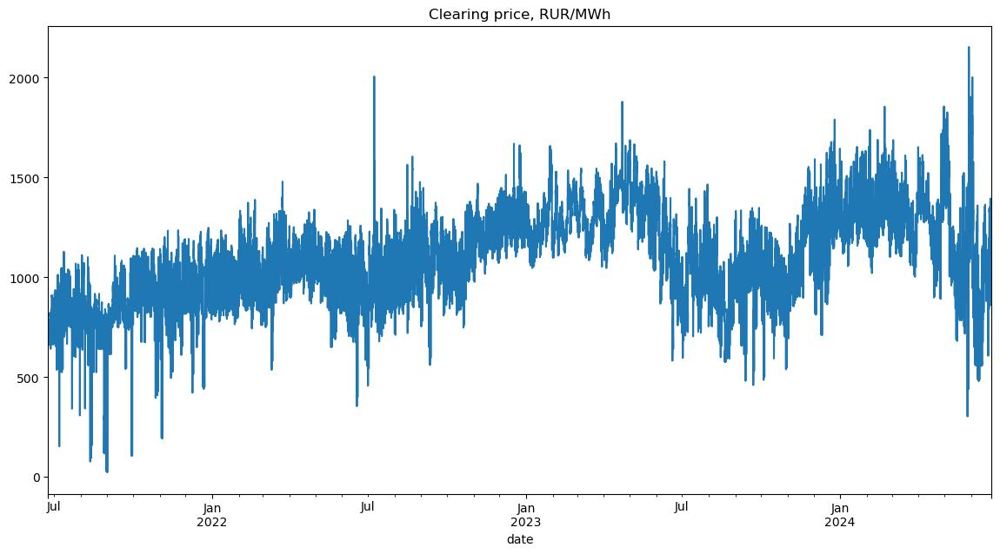

In [7]:
plt.figure(figsize = (14, 7))
df_sup['supplier_price'].plot()
plt.title('Clearing price, RUR/MWh')
plt.show()

## Price distribution

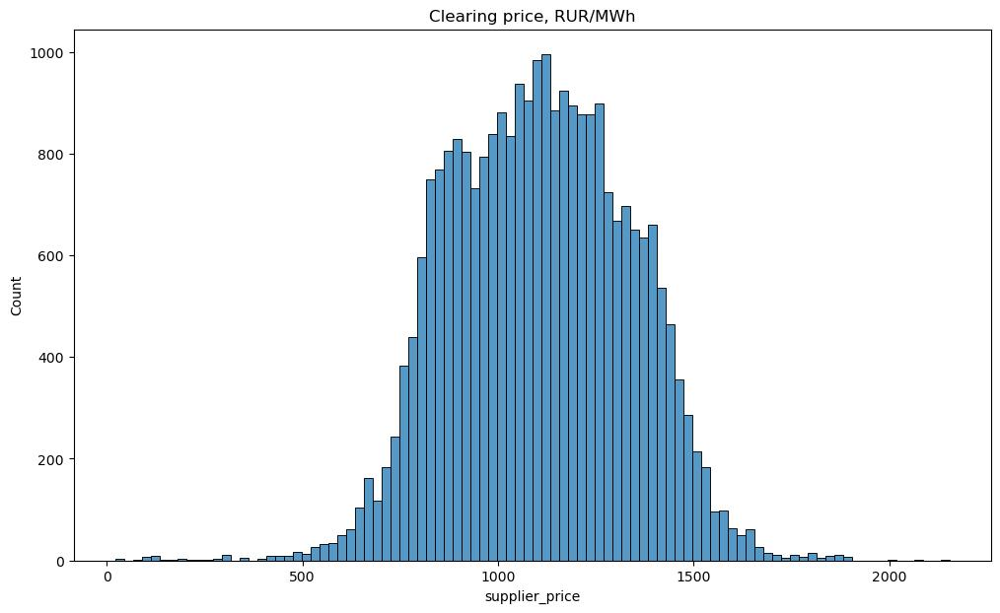

In [8]:
plt.figure(figsize = (12, 7))
plt.title('Clearing price, RUR/MWh')
sb.histplot(df_sup['supplier_price'])
plt.show()

# Prediction using cross-validation

## Train & test split

In [1]:
from google.colab import drive

drive.mount('/content/drive')
drive_path = 'drive/MyDrive'

Mounted at /content/drive


In [2]:
!pip install catboost --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.2/98.2 MB 9.1 MB/s eta 0:00:00


In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
import numpy as np

#df_sup = pd.read_csv(f'{drive_path}/electricity_price_hourly_2_zone_supplier_price_2021-06-24__2024-06-24.csv', index_col = 'date')
df_sup = pd.read_csv('electricity_price_hourly_2_zone_supplier_price_2021-06-24__2024-06-24.csv', index_col = 'date')
df_sup.index = pd.to_datetime(df_sup.index)
df_sup

,year,quarter,month,week_of_year,day_of_year,day_of_week,day,hour,supplier_price
date,,,,,,,,,
2021-06-24 00:00:00+00:00,2021,2,6,25,175,3,24,0,669.88
2021-06-24 01:00:00+00:00,2021,2,6,25,175,3,24,1,671.66
2021-06-24 02:00:00+00:00,2021,2,6,25,175,3,24,2,674.60
2021-06-24 03:00:00+00:00,2021,2,6,25,175,3,24,3,661.88
2021-06-24 04:00:00+00:00,2021,2,6,25,175,3,24,4,708.72
...,...,...,...,...,...,...,...,...,...
2024-06-24 19:00:00+00:00,2024,2,6,26,176,0,24,19,1193.24
2024-06-24 20:00:00+00:00,2024,2,6,26,176,0,24,20,1062.33
2024-06-24 21:00:00+00:00,2024,2,6,26,176,0,24,21,950.58


In [2]:
print(f'We will use {round(len(df_sup) / 24 / 365, 4)} years of observations')

We will use 3.0055 years of observations


In [3]:
rows_count = len(df_sup)
proportion = 0.90
train_count = int(rows_count * proportion)
test_count = rows_count - train_count
df_train = df_sup[:train_count].copy()
df_test = df_sup[train_count:train_count + test_count].copy()
print(f'Train: {len(df_train)}')
print(f'Test: {len(df_test)}')

Train: 23695
Test: 2633


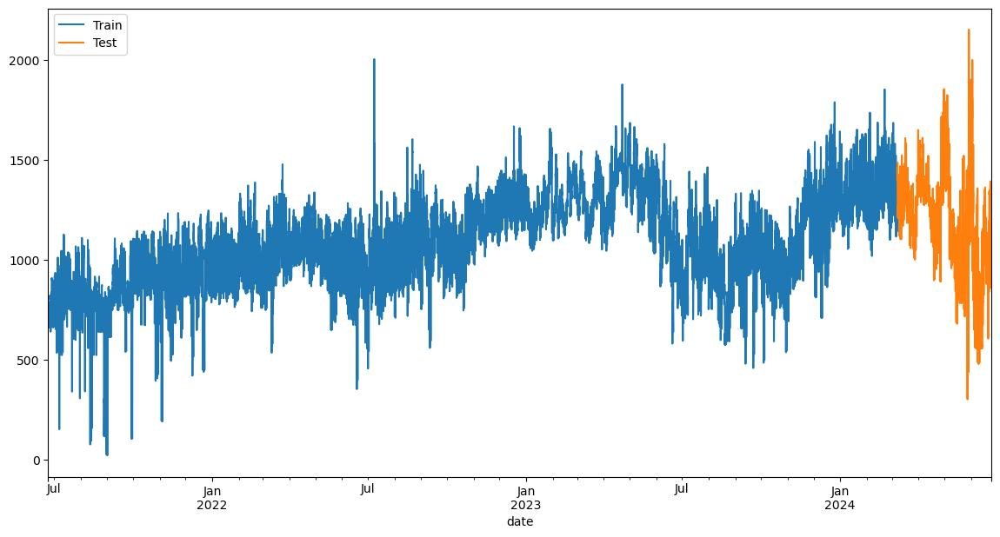

In [12]:
plt.figure(figsize = (14, 7))
df_train['supplier_price'].plot()
df_test['supplier_price'].plot()
plt.legend(['Train', 'Test'])
plt.show()

## Functions, variables & constants

In [3]:
from scipy import stats as st
import statsmodels.api as sm

def run_tests_for_normality(data, alpha = 0.05):
    statistic, p_value = st.normaltest(data)
    if p_value > alpha:
        result = 'Normal'
    else:
        result = 'NOT Normal'
    print(f"D'Agostino & Pearson: {result:>11s}")
    print(statistic)
    print()
    statistic, pvalue = st.jarque_bera(data)
    if pvalue > alpha:
        result = 'Normal'
    else:
        result = 'NOT Normal'
    print(f'Jarque-Bera: {result:>20s}')
    print(statistic)
    print()
    ksstat, pvalue = sm.stats.diagnostic.kstest_normal(data)
    if pvalue > alpha:
        result = 'Normal'
    else:
        result = 'NOT Normal'
    print(f'Kolmogorov-Smirnov: {result:>13s}')
    print(ksstat)
    print()
    ksstat, pvalue = sm.stats.diagnostic.lilliefors(data)
    if pvalue > alpha:
        result = 'Normal'
    else:
        result = 'NOT Normal'
    print(f'Lilliefors: {result:>21s}')
    print(ksstat)
    print()
    statistic, pvalue = st.shapiro(data)
    if pvalue > alpha:
        result = 'Normal'
    else:
        result = 'NOT Normal'
    print(f'Shapiro-Wilk: {result:>19s}')
    print(statistic)
    print()
    result = st.anderson(data)
    idx = np.where(result.significance_level == alpha * 100)
    if result.statistic < result.critical_values[idx]:
        verdict = 'Normal'
    else:
        verdict = 'NOT Normal'
    print(f'Anderson–Darling: {verdict:>15s}')
    print(result.statistic)
    print()

def show_probability_plot(data):
    st.probplot(data, dist = 'norm', plot = plt)
    plt.show()

def show_quantile_quantile_plot(data):
    sm.qqplot(data, line = '45')
    plt.show()

In [4]:
import numpy as np
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import r2_score as r2, mean_squared_error as mse
from sklearn.metrics import mean_absolute_error as mae
from sklearn.metrics import mean_absolute_percentage_error

def rmse(y_test, y_pred):
    return np.sqrt(mse(y_test, y_pred))

def mape(y_test, y_pred):
    return mean_absolute_percentage_error(y_test, y_pred) * 100.0

def smape(y_test, y_pred):
    absolute_diff = np.abs(y_test - y_pred)
    sum_absolute = np.abs(y_test) + np.abs(y_pred)
    mask = sum_absolute != 0
    return np.mean(200 * (absolute_diff[mask] / sum_absolute[mask]))

# from SKTime
# https://github.com/sktime/sktime/blob/ee7a06843a44f4aaec7582d847e36073a9ab0566/sktime/performance_metrics/forecasting/_functions.py#L16
# https://github.com/sktime/sktime/blob/87aad6e0b9c5ff68f3c7777fdb3d27906ba72009/sktime/performance_metrics/forecasting/_functions.py#L579

EPS = np.finfo(np.float64).eps

# Mean absolute scaled error
def mase(y_test, y_pred, y_train, sp = 1):
    y_test_np = np.asarray(y_test)
    y_pred_np = np.asarray(y_pred)
    y_train_np = np.asarray(y_train)
    y_pred_naive = y_train_np[:-sp]
    mae_naive = np.mean(np.abs(y_train_np[sp:] - y_pred_naive))
    mae_pred = np.mean(np.abs(y_test_np - y_pred_np))
    return mae_pred / np.maximum(mae_naive, EPS)

# Mean squared scaled error
def msse(y_test, y_pred, y_train,  sp = 1):
    y_test_np = np.asarray(y_test)
    y_pred_np = np.asarray(y_pred)
    y_train_np = np.asarray(y_train)
    y_pred_naive = y_train_np[:-sp]
    mse_naive = np.mean(np.square(y_train_np[sp:] - y_pred_naive))
    mse_pred = np.mean(np.square(y_test_np - y_pred_np))
    return mse_pred / np.maximum(mse_naive, EPS)

# Root mean squared scaled error
def rmsse(y_test, y_pred, y_train,  sp = 1):
    y_test_np = np.asarray(y_test)
    y_pred_np = np.asarray(y_pred)
    y_train_np = np.asarray(y_train)
    y_pred_naive = y_train_np[:-sp]
    mse_naive = np.mean(np.square(y_train_np[sp:] - y_pred_naive))
    mse_pred = np.mean(np.square(y_test_np - y_pred_np))
    return np.sqrt(mse_pred / np.maximum(mse_naive, EPS))

In [5]:
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sb
from pandas.plotting import autocorrelation_plot

def show_regression_chart(y, prediction, title, sort = True):
    t = pd.DataFrame({'prediction': prediction, 'y': y})
    if sort:
        t.sort_values(by = ['y'], inplace = True)
    plt.figure(figsize = (10, 6))
    plt.plot(t['y'].tolist(), label = 'Expected')
    plt.plot(t['prediction'].tolist(), label = 'Prediction')
    plt.ylabel('Output')
    plt.legend()
    plt.xticks(rotation = 45)
    plt.title(title)
    plt.show()

def show_line_plot(data, title):
    plt.figure(figsize = (10, 6))
    plt.plot(data)
    plt.xticks(rotation = 45)
    plt.title(title)
    plt.show()
    
def show_histogram(data, title):
    plt.title(title)
    sb.histplot(data)
    plt.show()
    
def show_acf_plot(data, title):
    autocorrelation_plot(data)
    plt.title(title)
    plt.show()

In [6]:
import random
import numpy as np

RANDOM_STATE = 42
N_JOBS = 6
NUM_OF_SPLITS = 10
TARGET_COLUMN = 'supplier_price'

# show 3 weeks of measurments and predictions
# make sure this number is smaller than the smallest CV fold (len(df) / NUM_OF_SPLITS)
LATEST_PRED_AMOUNT = 24 * 7 * 3 

# seasonality period in the time series data
SEASONALITY = 24

np.random.seed(RANDOM_STATE)
random.seed(RANDOM_STATE)

# effectively ignoring train & test split
# so we can use thew whole dataset for CV
df_train = df_sup.copy() 

names = []
results = {
    'r2' : [],
    'mse' : [],
    'rmse' : [],
    'mae' : [],
    'mape' : [],
    'smape' : [],
    'mase' : [],
    'msse' : [],
    'rmsse' : []
}

## Prediction

### ARIMA (StatsForecast)

#### Running AutoARIMA on the whole dataset to find out ARIMA parameters

In [9]:
df_statsforecast = df_train.copy()
df_statsforecast.drop(
    columns = [
        'year',
        'quarter',
        'month',
        'week_of_year',
        'day_of_year',
        'day_of_week',
        'day',
        'hour'
    ], 
    inplace = True
)
df_statsforecast.rename(columns = {'supplier_price': 'y'}, inplace = True)
df_statsforecast['unique_id'] = 'supplier_price' # Arbitrary ID for the time series
df_statsforecast['ds'] = df_statsforecast.index
df_statsforecast.reset_index(inplace = True)
df_statsforecast.drop(columns = 'date', inplace = True)
df_statsforecast

,y,unique_id,ds
0,669.88,supplier_price,2021-06-24 00:00:00+00:00
1,671.66,supplier_price,2021-06-24 01:00:00+00:00
2,674.60,supplier_price,2021-06-24 02:00:00+00:00
3,661.88,supplier_price,2021-06-24 03:00:00+00:00
4,708.72,supplier_price,2021-06-24 04:00:00+00:00
...,...,...,...
26323,1193.24,supplier_price,2024-06-24 19:00:00+00:00
26324,1062.33,supplier_price,2024-06-24 20:00:00+00:00
26325,950.58,supplier_price,2024-06-24 21:00:00+00:00
26326,917.14,supplier_price,2024-06-24 22:00:00+00:00


In [10]:
from statsforecast import StatsForecast
from statsforecast.models import AutoARIMA

sf_arima = StatsForecast(
    models = [
        AutoARIMA(
            max_p = 30,
            max_q = 30,
            max_P = 30,
            max_Q = 30,
            max_order = 30,
            max_d = 30,
            max_D = 30,
            season_length = SEASONALITY
        ),
    ],
    freq = 'H',
    n_jobs = 6
)

C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\statsforecast\core.py:27: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from tqdm.autonotebook import tqdm


In [12]:
from statsforecast.arima import arima_string

sf_arima.fit(df_statsforecast)
print(arima_string(sf_arima.fitted_[0][0].model_))

# (p, d, q, P, D, Q, constant)
# ARIMA(1,0,0)(2,1,0)[24]  

ARIMA(1,0,0)(2,1,0)[24]                   


#### CV for ARIMA model

In [13]:
from statsforecast.models import ARIMA
from statsforecast.arima import arima_string

arima = StatsForecast(
    models = [
        ARIMA(
            order = (1, 0, 0),
            seasonal_order = (2, 1, 0),
            season_length = SEASONALITY
        ),
    ],
    freq = 'H',
    n_jobs = 6
)

----------------
ARIMA model...
Fold #1...
Fitted model: ARIMA(1,0,0)(2,1,0)[24]                   


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\statsforecast\arima.py:1163: RuntimeWarning: invalid value encountered in sqrt
  se = np.sqrt(se * model["sigma2"])
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\statsforecast\core.py:485: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


Fold #2...
Fitted model: ARIMA(1,0,0)(2,1,0)[24]                   


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\statsforecast\core.py:485: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


Fold #3...
Fitted model: ARIMA(1,0,0)(2,1,0)[24]                   


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\statsforecast\core.py:485: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


Fold #4...
Fitted model: ARIMA(1,0,0)(2,1,0)[24]                   


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\statsforecast\core.py:485: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


Fold #5...
Fitted model: ARIMA(1,0,0)(2,1,0)[24]                   


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\statsforecast\core.py:485: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


Fold #6...
Fitted model: ARIMA(1,0,0)(2,1,0)[24]                   


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\statsforecast\core.py:485: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


Fold #7...
Fitted model: ARIMA(1,0,0)(2,1,0)[24]                   


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\statsforecast\core.py:485: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


Fold #8...
Fitted model: ARIMA(1,0,0)(2,1,0)[24]                   


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\statsforecast\core.py:485: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


Fold #9...
Fitted model: ARIMA(1,0,0)(2,1,0)[24]                   


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\statsforecast\core.py:485: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


Fold #10...
Fitted model: ARIMA(1,0,0)(2,1,0)[24]                   


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\statsforecast\core.py:485: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


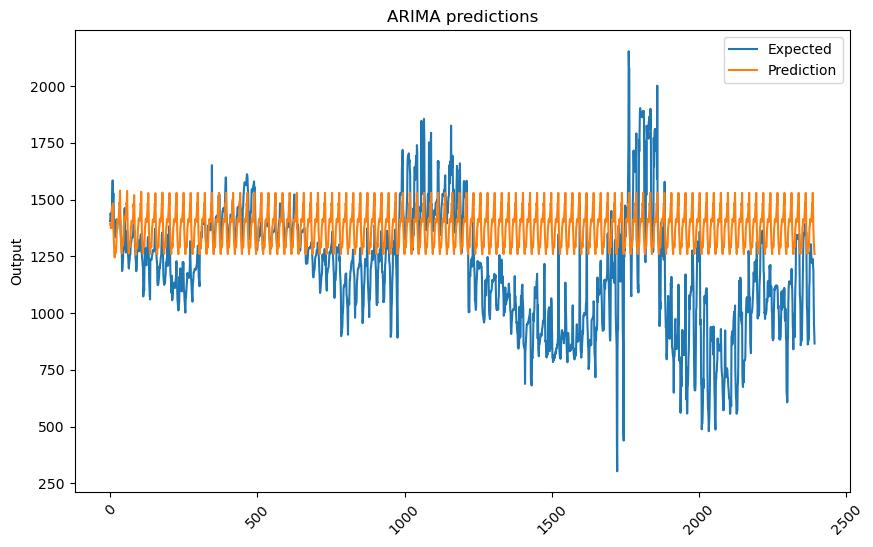

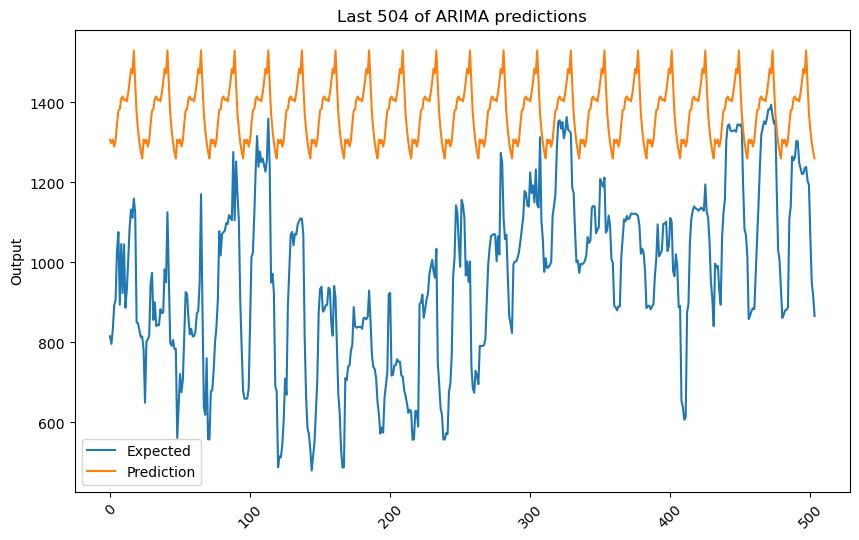

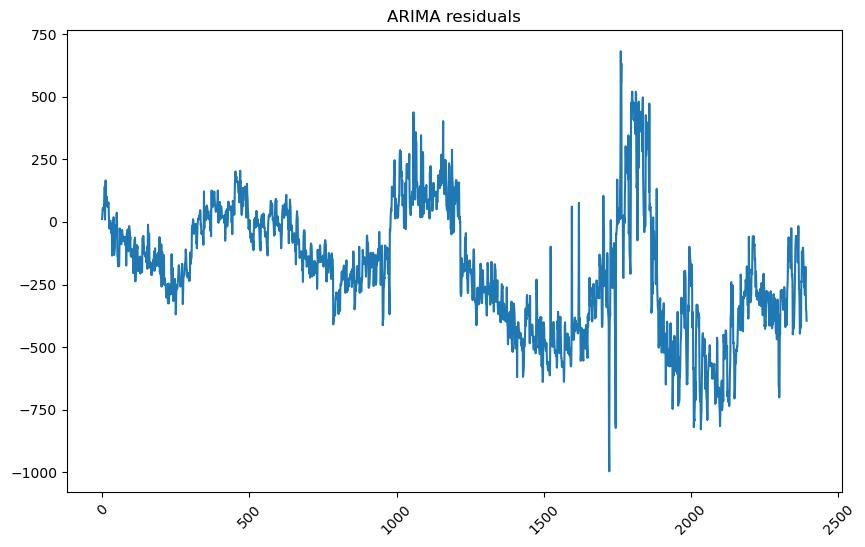

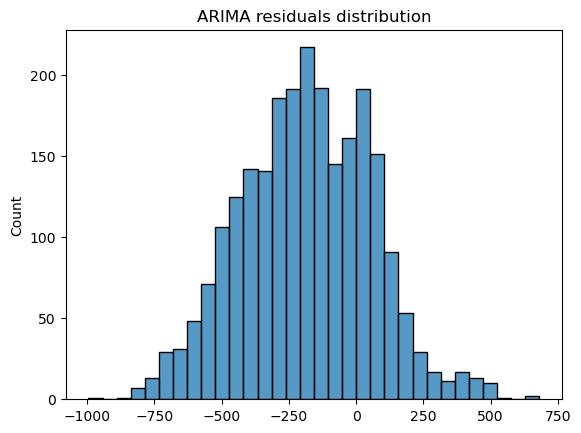

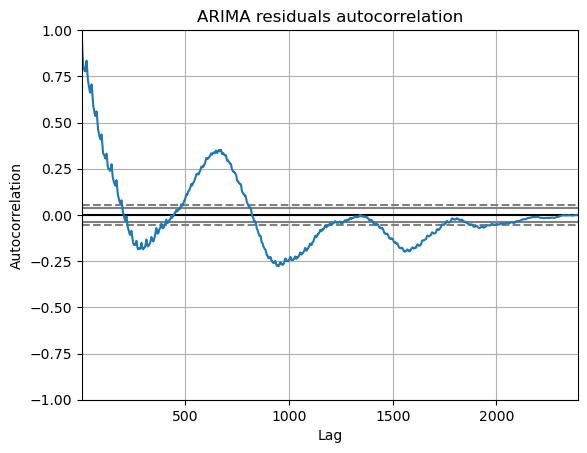

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:      Normal
1.1444720354651052

Jarque-Bera:               Normal
1.1985711202999572

Kolmogorov-Smirnov:    NOT Normal
0.024988289553069087

Lilliefors:            NOT Normal
0.024988289553069087

Shapiro-Wilk:          NOT Normal
0.9967377185821533

Anderson–Darling:      NOT Normal
2.0628563001728253

Done!



In [23]:
name = 'ARIMA'
print('----------------')
print(f'{name} model...')
model_results = {
        'r2' : [],
        'mse' : [],
        'rmse' : [],
        'mae' : [],
        'mape' : [],
        'smape' : [],
        'mase' : [],
        'msse' : [],
        'rmsse' : []
    }
fold_num = 1
timeFold = TimeSeriesSplit(n_splits = NUM_OF_SPLITS)
for train_range, test_range in timeFold.split(df_statsforecast):
    print(f'Fold #{fold_num}...')
    train = df_statsforecast.iloc[train_range]
    test = df_statsforecast.iloc[test_range]
    arima.fit(train)
    print(f'Fitted model: {arima_string(arima.fitted_[0][0].model_)}')
    y_test = test['y'].to_numpy()
    pred = arima.predict(h = len(y_test))
    y_pred = pred['ARIMA'].to_numpy()
    model_results['r2'].append(r2(y_test, y_pred))
    model_results['mse'].append(mse(y_test, y_pred))
    model_results['rmse'].append(rmse(y_test, y_pred))
    model_results['mae'].append(mae(y_test, y_pred))
    model_results['mape'].append(mape(y_test, y_pred))
    model_results['smape'].append(smape(y_test, y_pred))
    y_train = train['y'].to_numpy()
    model_results['mase'].append(mase(y_test, y_pred, y_train, sp = SEASONALITY))
    model_results['msse'].append(msse(y_test, y_pred, y_train, sp = SEASONALITY))
    model_results['rmsse'].append(rmsse(y_test, y_pred, y_train, sp = SEASONALITY))
    if fold_num == NUM_OF_SPLITS:
        show_regression_chart(y_test, y_pred, f'{name} predictions', sort = False)
        show_regression_chart(
            y_test[-LATEST_PRED_AMOUNT:],
            y_pred[-LATEST_PRED_AMOUNT:],
            f'Last {LATEST_PRED_AMOUNT} of {name} predictions',
            sort = False
        )
        # Unexplained variation
        residuals = y_test - y_pred
        show_line_plot(residuals, f'{name} residuals')
        show_histogram(residuals, f'{name} residuals distribution')
        show_acf_plot(residuals, f'{name} residuals autocorrelation')
        print('-' * 10)
        print('Statistical test for normality of residuals:')
        print('-' * 10)
        print()
        run_tests_for_normality(residuals)
    fold_num += 1
names.append(name)
for model_result_key, model_result_value in model_results.items():
    results[model_result_key].append(model_result_value)
print('Done!')
print()

### ML models

In [8]:
from sklearn.dummy import DummyRegressor
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import BayesianRidge
from sklearn.linear_model import PassiveAggressiveRegressor
from sklearn.linear_model import SGDRegressor
from sklearn.svm import SVR
from sklearn.svm import LinearSVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import HistGradientBoostingRegressor
from xgboost import XGBRegressor
from catboost import CatBoostRegressor

In [9]:
class ConstantRegressor:
    def __init__(self):
        self.constant = 0
        self.is_fit = False

    def fit(self, x_train, y_train):
        if len(x_train) != len(y_train):
            raise Exception('Train and test sequences have different lengths!')
        self.constant = y_train.iloc[0][0]
        self.is_fit = True

    def predict(self, x_test):
        if self.is_fit == False:
            raise Exception('Predictor was not trained!')
        return np.array([self.constant] * len(x_test))


class DriftRegressor:
    def __init__(self):
        self.y_0 = 0
        self.y_1 = 0
        self.is_fit = False

    def fit(self, x_train, y_train):
        if len(x_train) != len(y_train):
            raise Exception('Train and test sequences have different lengths!')
        self.y_0 = y_train.iloc[0][0]
        self.y_1 = y_train.iloc[-1][0]
        self.is_fit = True

    def predict(self, x_test):
        if self.is_fit == False:
            raise Exception('Predictor was not trained!')
        output = []
        if len(x_test) <= 1:
            output.append(self.y_0)
            return output
        x_0 = 0
        x_1 = len(x_test)
        l = abs(x_1 - x_0)
        dy = (self.y_1 - self.y_0) / l
        y = self.y_0
        i = 1
        while i <= l:
            output.append(y)
            y += dy
            i += 1
        return np.array(output)

In [10]:
models = []
models.append(('Naive', ConstantRegressor()))
models.append(('Drift', DriftRegressor()))
models.append(('Average', DummyRegressor(strategy = 'mean')))
models.append(('LR', LinearRegression(fit_intercept = False)))
models.append(('Bayesian R.', BayesianRidge(fit_intercept = False)))
models.append(('PAR', PassiveAggressiveRegressor(
    max_iter = 100,
    random_state = RANDOM_STATE,
    tol = 1e-3,
    fit_intercept = False)))
models.append(('SGD', SGDRegressor(random_state = RANDOM_STATE, shuffle = False, fit_intercept = False)))
models.append(('SVR', SVR(max_iter = 100)))
models.append(('Lin. SVR', LinearSVR(max_iter = 100, random_state = RANDOM_STATE, fit_intercept = False)))
models.append(('KNN', KNeighborsRegressor(n_neighbors = 20, n_jobs = N_JOBS)))
models.append(('CART', DecisionTreeRegressor(random_state = RANDOM_STATE)))
models.append(('RF', RandomForestRegressor(n_jobs = N_JOBS, random_state = RANDOM_STATE, bootstrap = False)))
models.append(('RF w/B.', RandomForestRegressor(n_jobs = N_JOBS, random_state = RANDOM_STATE, bootstrap = True)))
models.append(('XT', ExtraTreesRegressor(n_jobs = N_JOBS, random_state = RANDOM_STATE, bootstrap = False)))
models.append(('XT w/B.', ExtraTreesRegressor(n_jobs = N_JOBS, random_state = RANDOM_STATE, bootstrap = True)))
models.append(('BAG', BaggingRegressor(n_jobs = N_JOBS, random_state = RANDOM_STATE, bootstrap = False)))
models.append(('BAG w/B.', BaggingRegressor(n_jobs = N_JOBS, random_state = RANDOM_STATE, bootstrap = True)))
models.append(('ADA', AdaBoostRegressor(random_state = RANDOM_STATE)))
models.append(('HGBoost', HistGradientBoostingRegressor(random_state = RANDOM_STATE)))
models.append(('XGBoost', XGBRegressor(tree_method = 'gpu_hist', verbosity = 0, random_state = RANDOM_STATE)))
models.append(('CatBoost', CatBoostRegressor(
    random_seed = RANDOM_STATE,
    loss_function = 'RMSE',
    eval_metric = 'MAE',
    od_type = 'Iter',
    od_wait = 20,
    task_type = 'GPU',
    logging_level = 'Silent')))

----------------
Naive model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


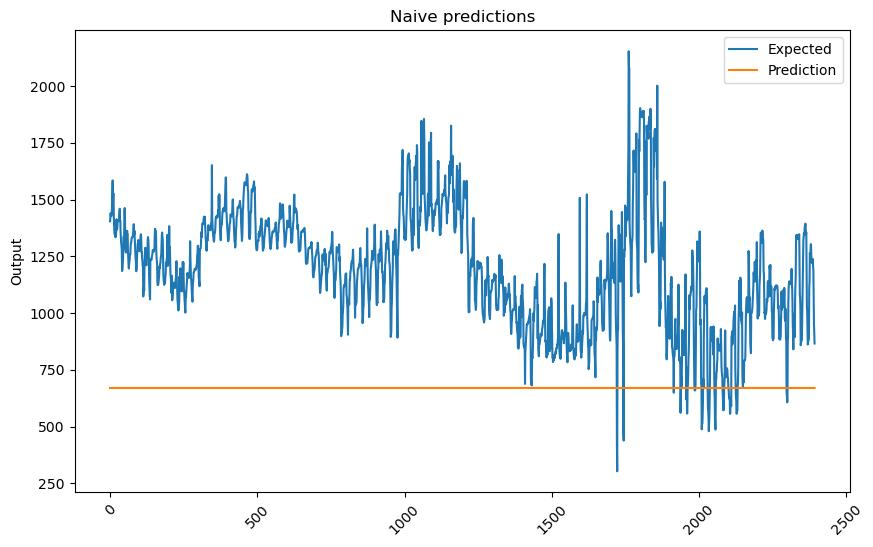

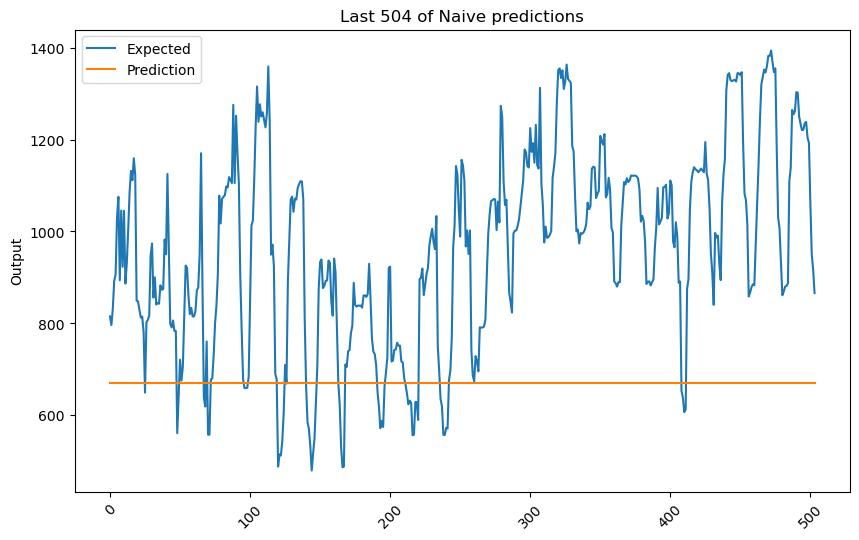

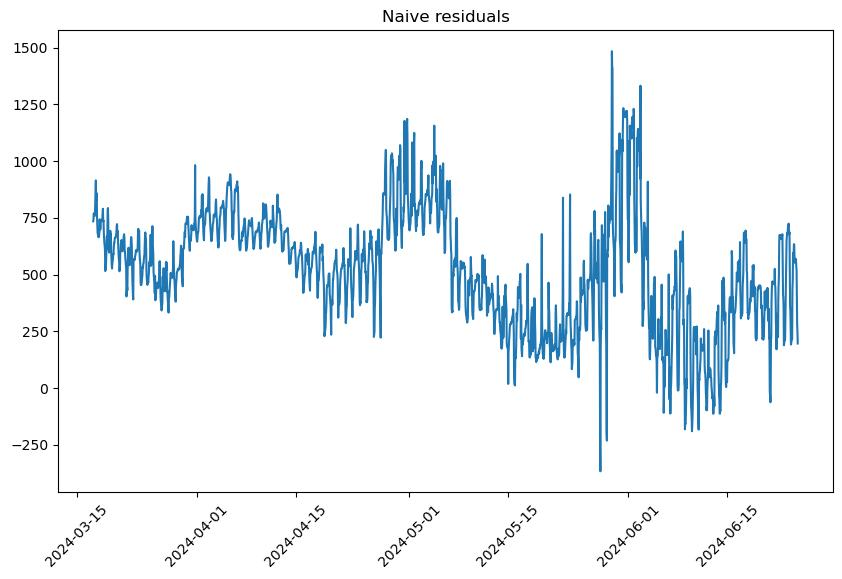

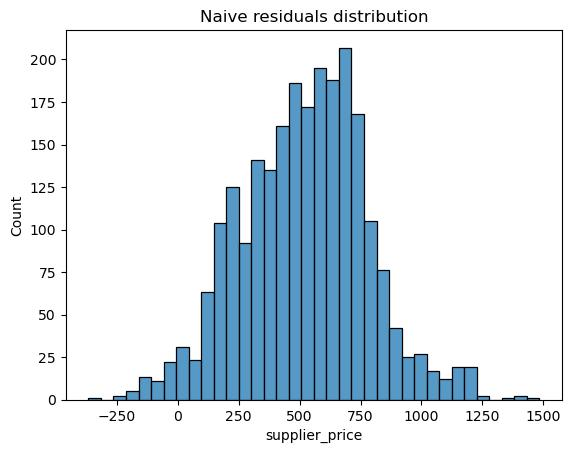

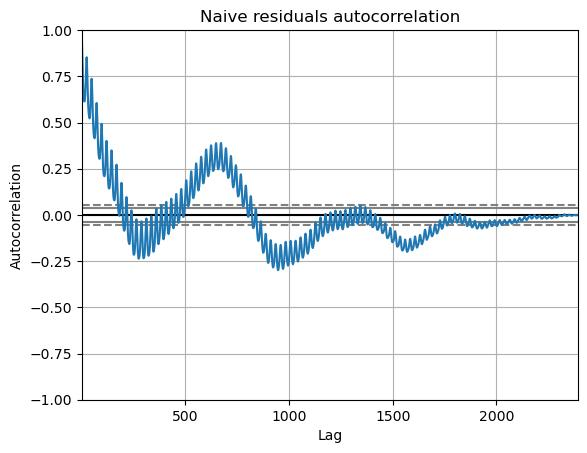

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:      Normal
2.7096090979416143

Jarque-Bera:               Normal
2.857859871067579

Kolmogorov-Smirnov:    NOT Normal
0.028861374211257007

Lilliefors:            NOT Normal
0.028861374211257007

Shapiro-Wilk:          NOT Normal
0.9954019784927368

Anderson–Darling:      NOT Normal
3.808361211531519

Done!

----------------
Drift model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


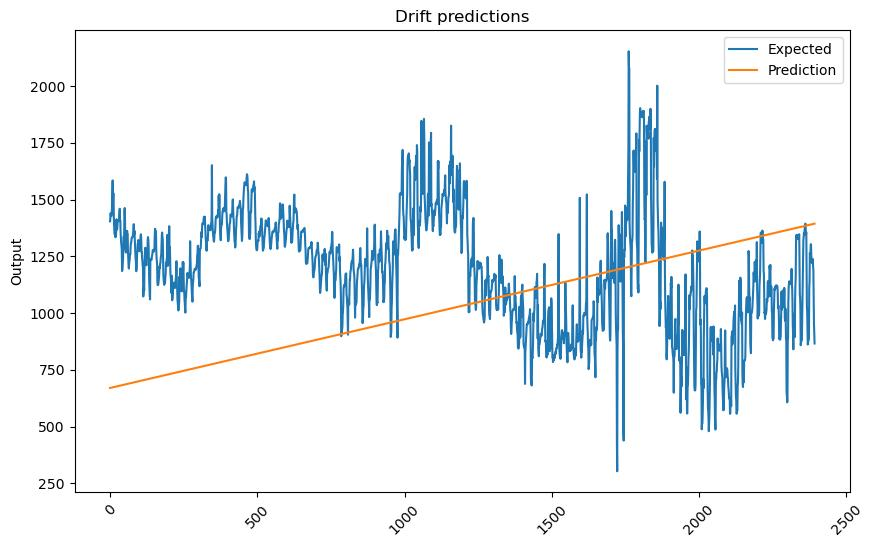

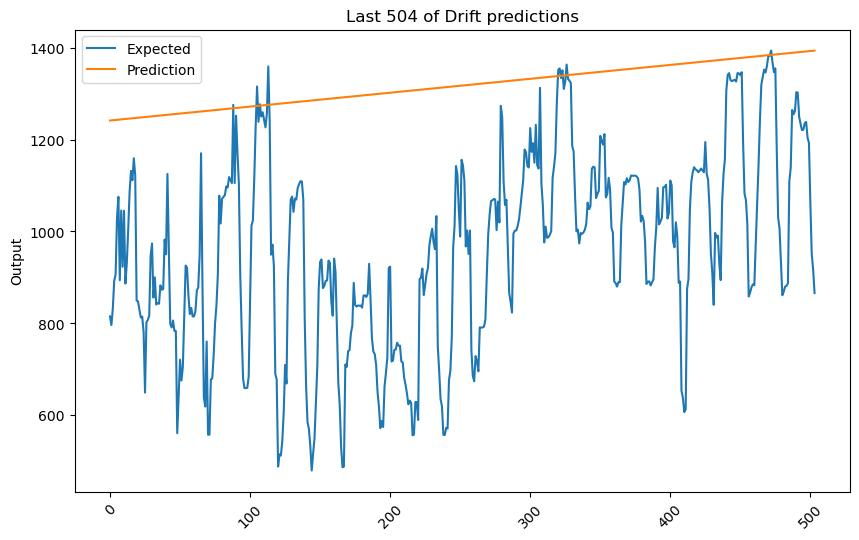

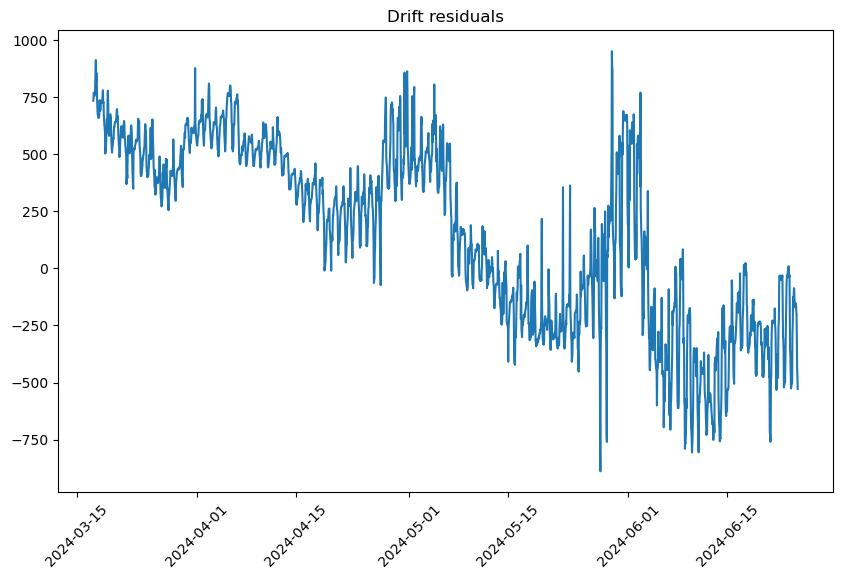

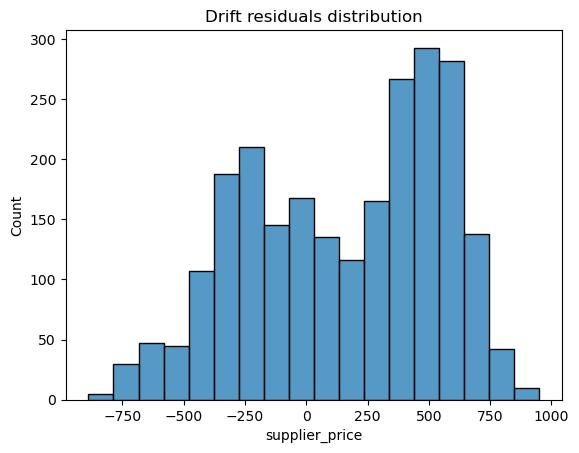

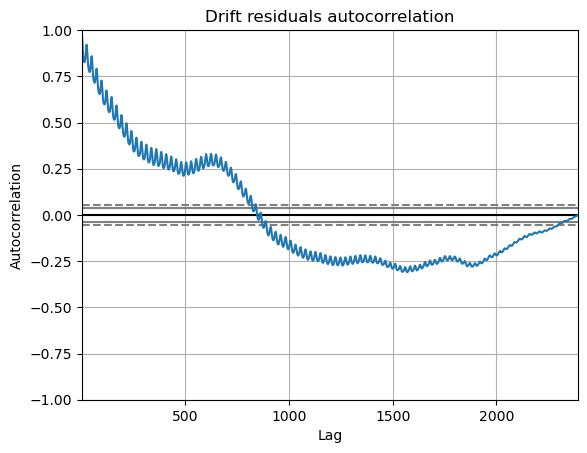

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
625.7013506251225

Jarque-Bera:           NOT Normal
148.28552962034678

Kolmogorov-Smirnov:    NOT Normal
0.1109844983967917

Lilliefors:            NOT Normal
0.1109844983967917

Shapiro-Wilk:          NOT Normal
0.9508650302886963

Anderson–Darling:      NOT Normal
43.39425087466225

Done!

----------------
Average model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


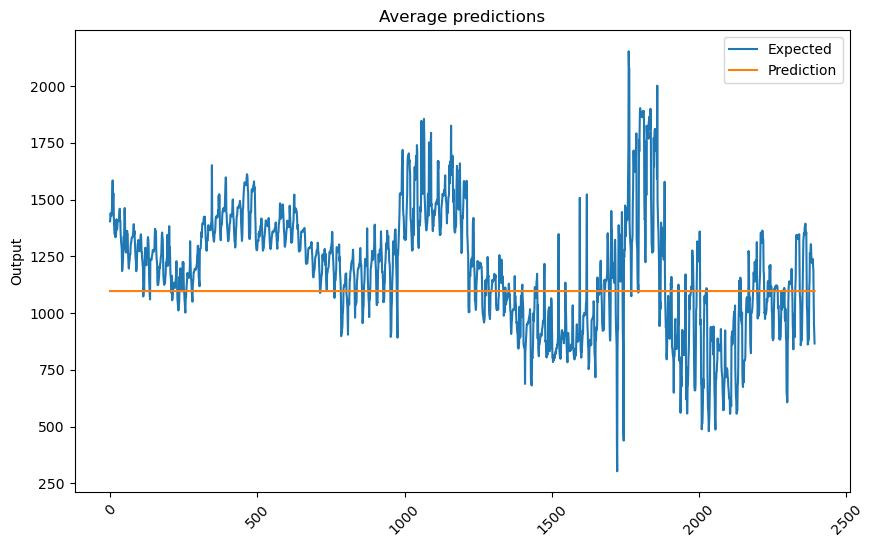

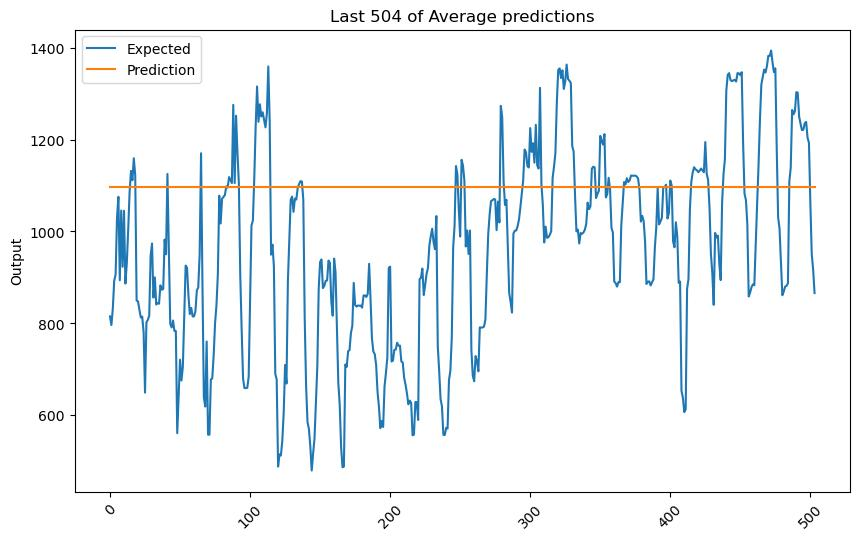

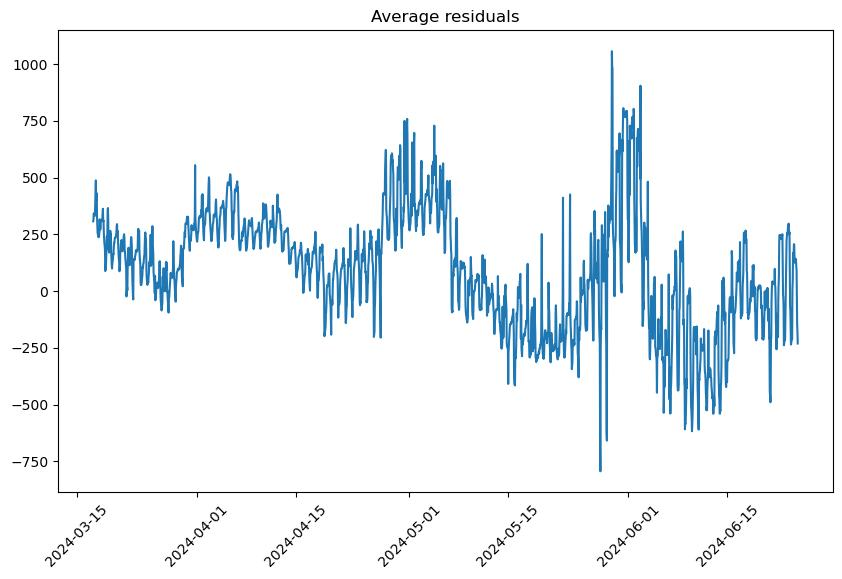

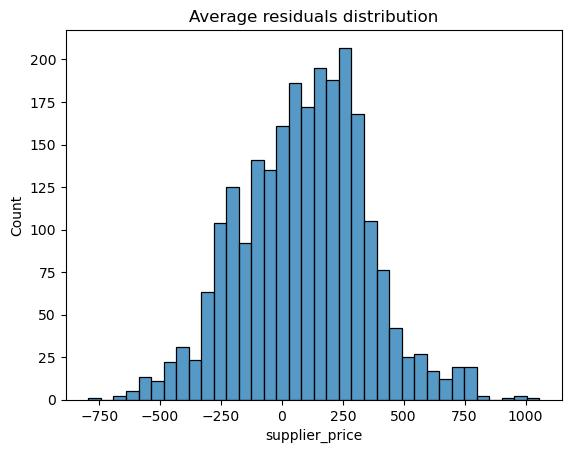

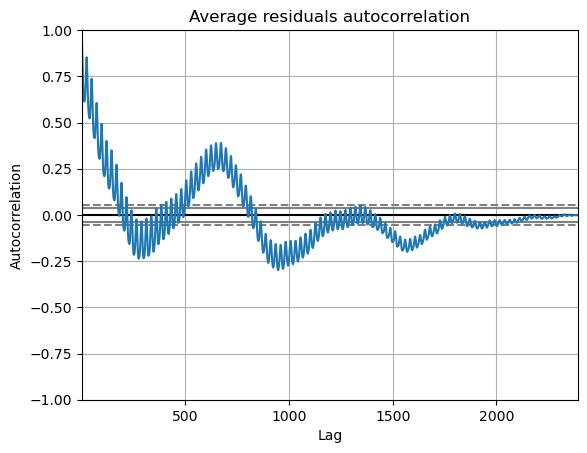

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:      Normal
2.709609097941616

Jarque-Bera:               Normal
2.857859871067579

Kolmogorov-Smirnov:    NOT Normal
0.028861374211257007

Lilliefors:            NOT Normal
0.028861374211257007

Shapiro-Wilk:          NOT Normal
0.9954019784927368

Anderson–Darling:      NOT Normal
3.808361211531519

Done!

----------------
LR model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


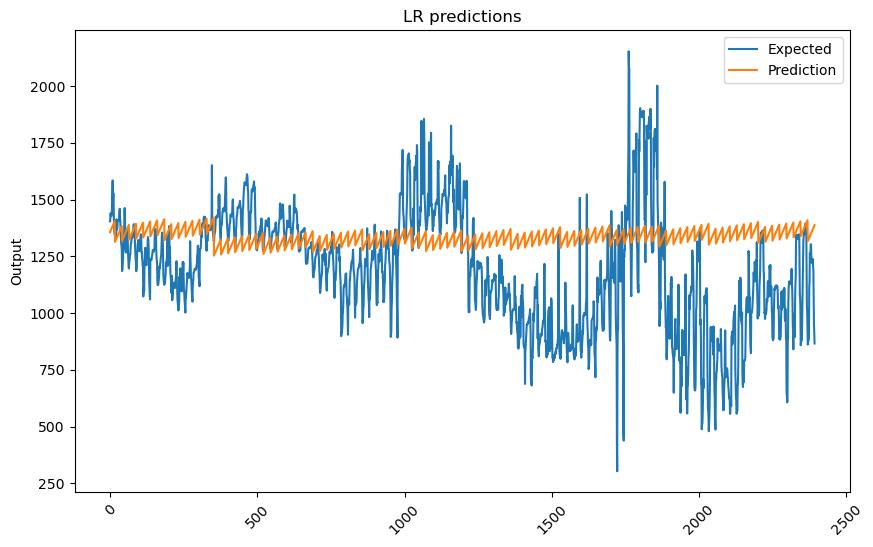

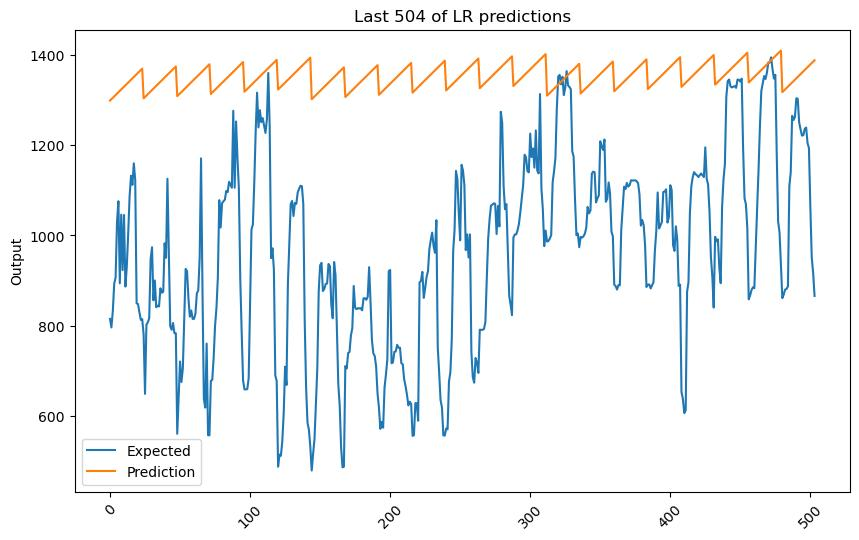

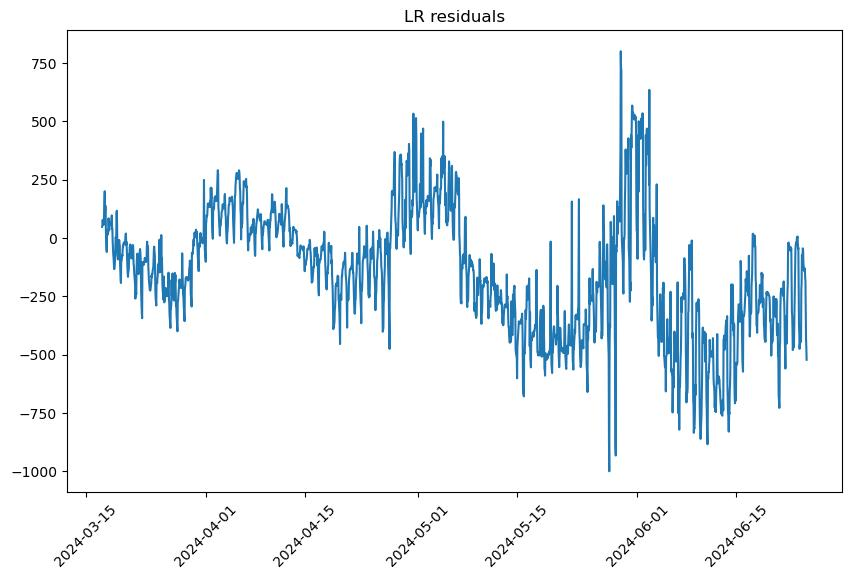

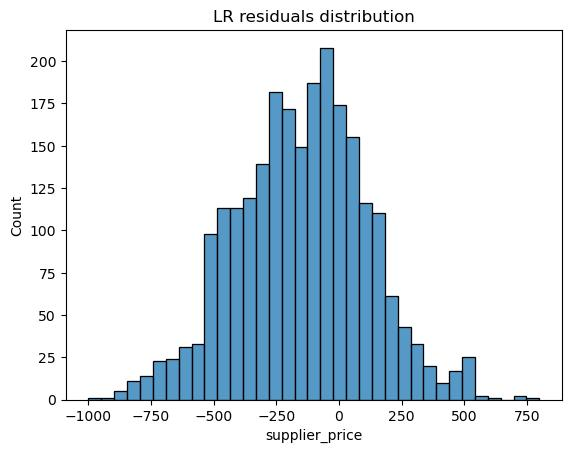

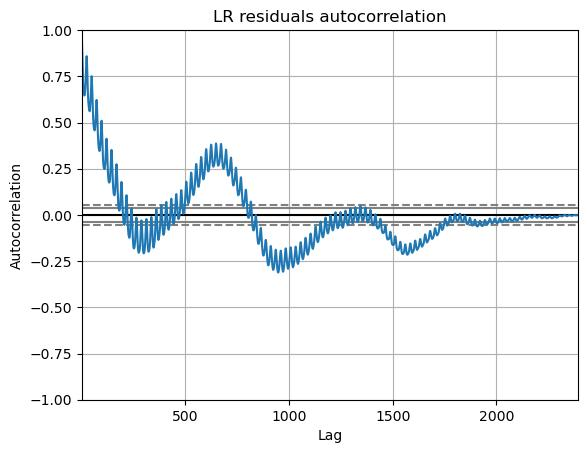

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:      Normal
0.259413672050433

Jarque-Bera:               Normal
0.19737927421609797

Kolmogorov-Smirnov:    NOT Normal
0.023520397253824488

Lilliefors:            NOT Normal
0.023520397253824488

Shapiro-Wilk:          NOT Normal
0.9980149865150452

Anderson–Darling:      NOT Normal
1.3578541466886236

Done!

----------------
Bayesian R. model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expec

Fold #8...
Fold #9...
Fold #10...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


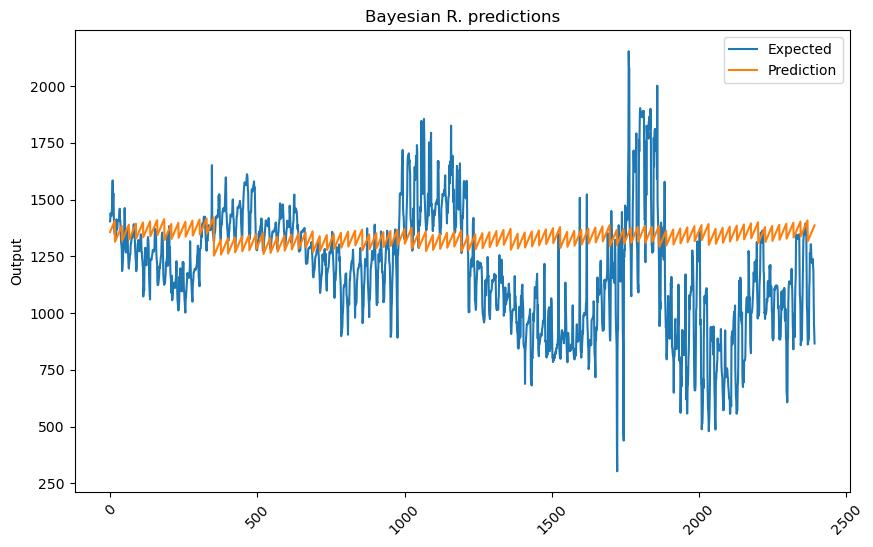

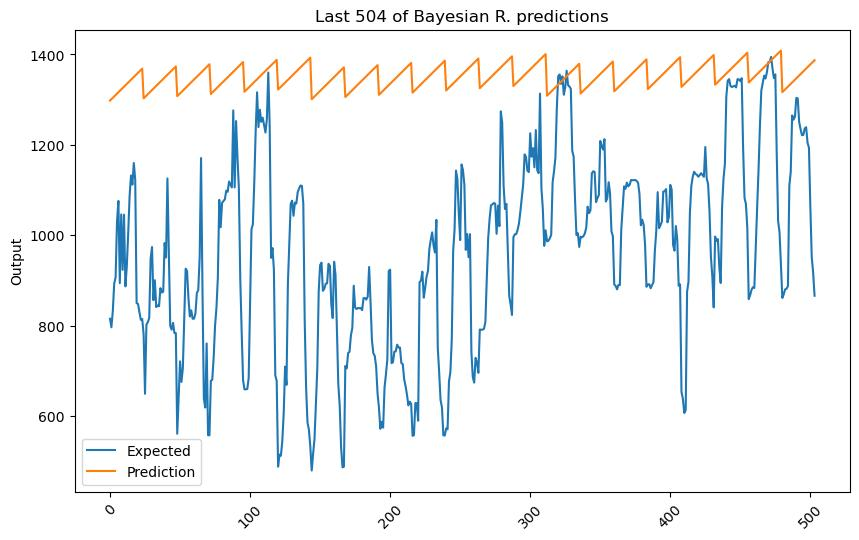

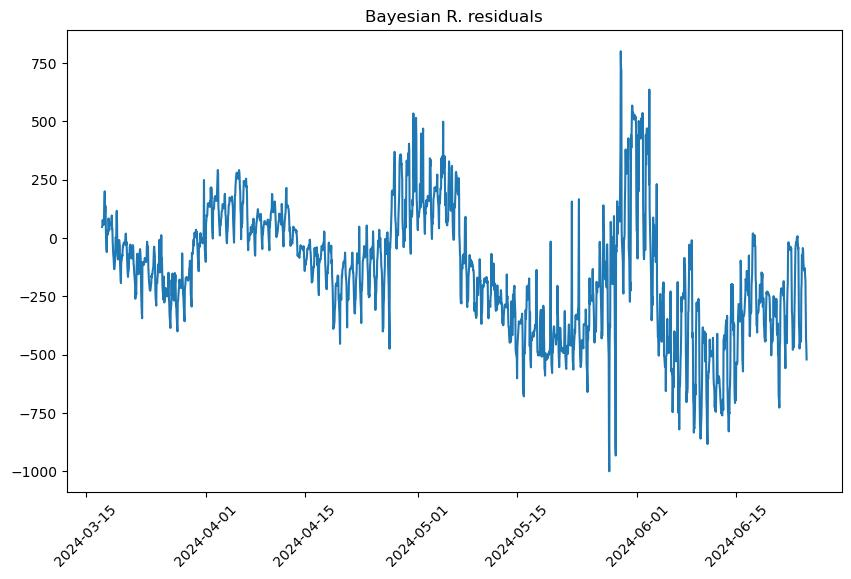

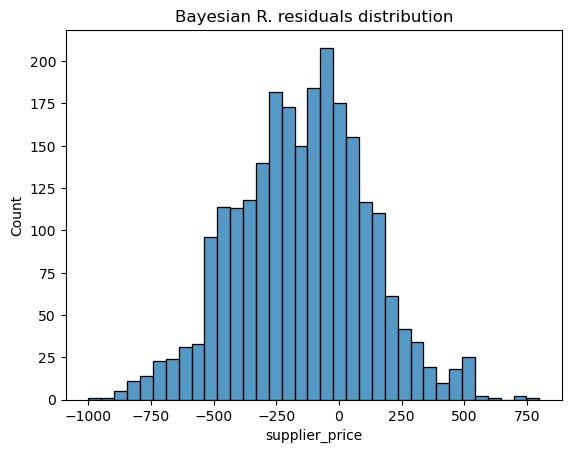

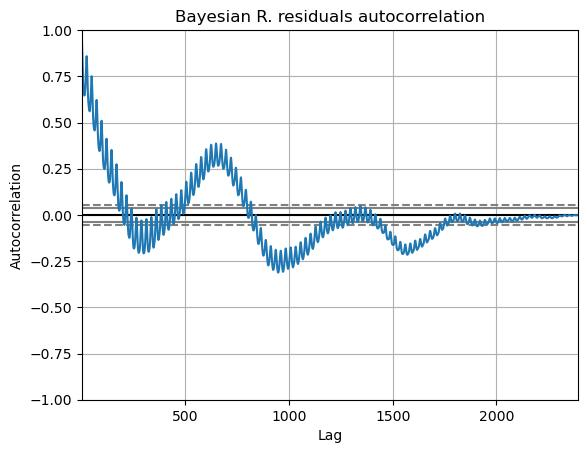

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:      Normal
0.2544738893816598

Jarque-Bera:               Normal
0.19391308580758035

Kolmogorov-Smirnov:    NOT Normal
0.023519965508988938

Lilliefors:            NOT Normal
0.023519965508988938

Shapiro-Wilk:          NOT Normal
0.9980210065841675

Anderson–Darling:      NOT Normal
1.3481681813800606

Done!

----------------
PAR model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expec

Fold #7...
Fold #8...
Fold #9...
Fold #10...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expec

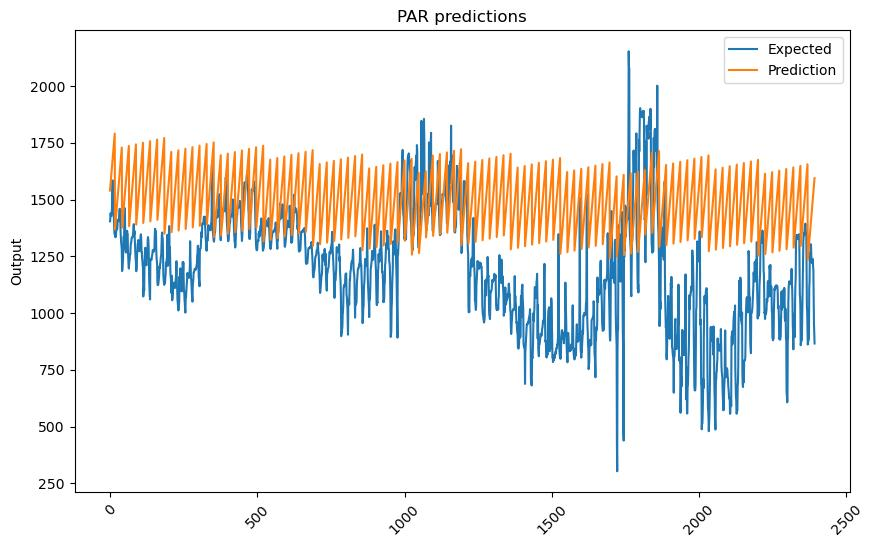

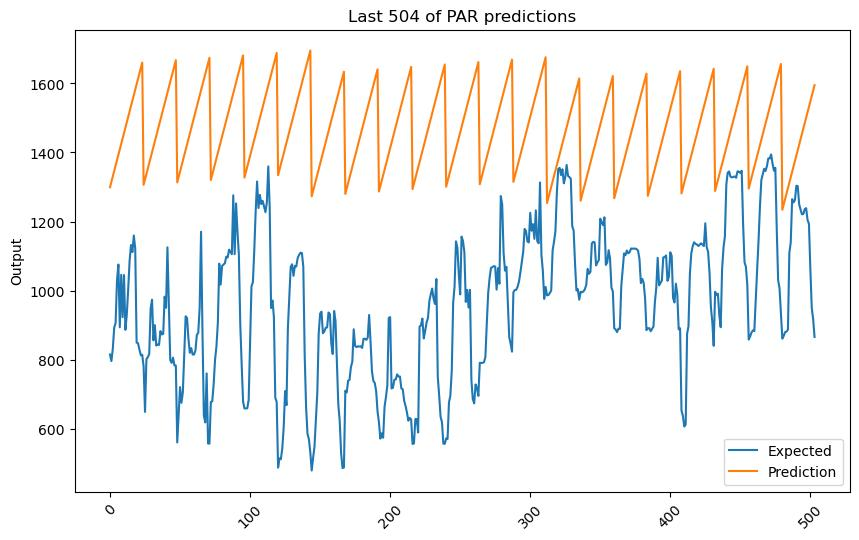

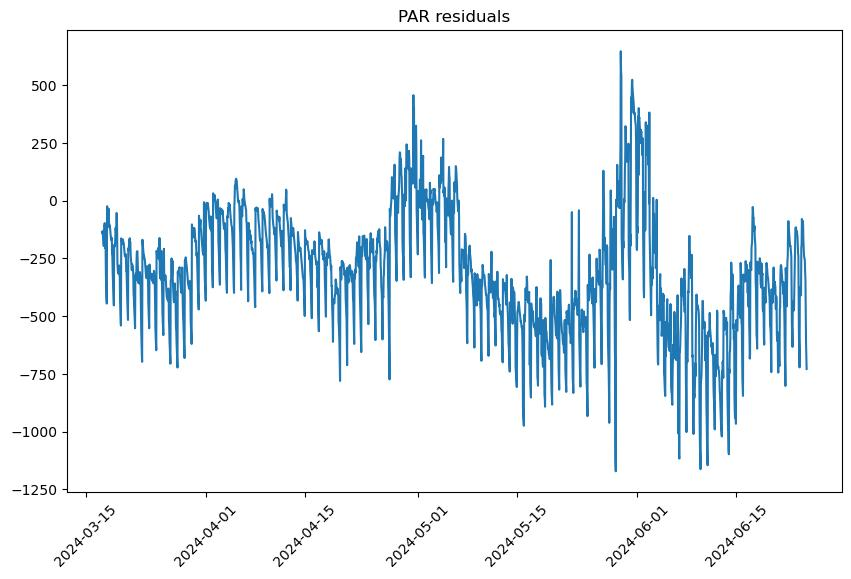

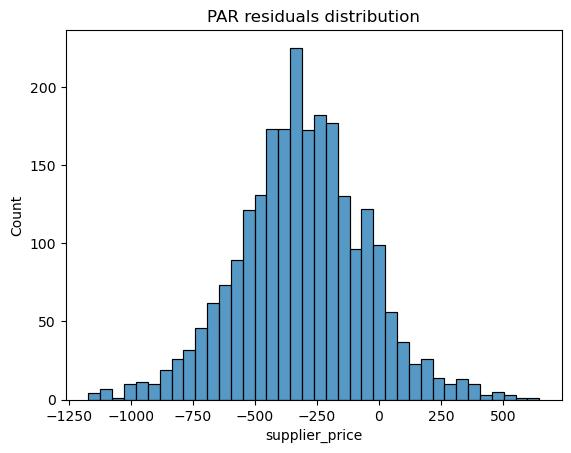

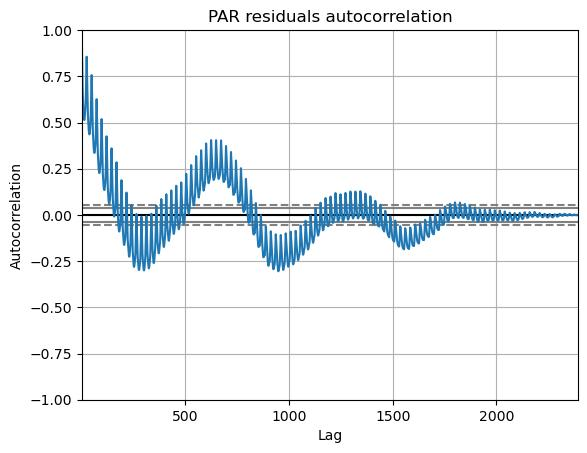

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
15.982541650712134

Jarque-Bera:           NOT Normal
23.055654116894505

Kolmogorov-Smirnov:    NOT Normal
0.02364407697550508

Lilliefors:            NOT Normal
0.02364407697550508

Shapiro-Wilk:          NOT Normal
0.9963470697402954

Anderson–Darling:      NOT Normal
2.1990372530344757

Done!

----------------
SGD model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expec

Fold #8...
Fold #9...
Fold #10...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


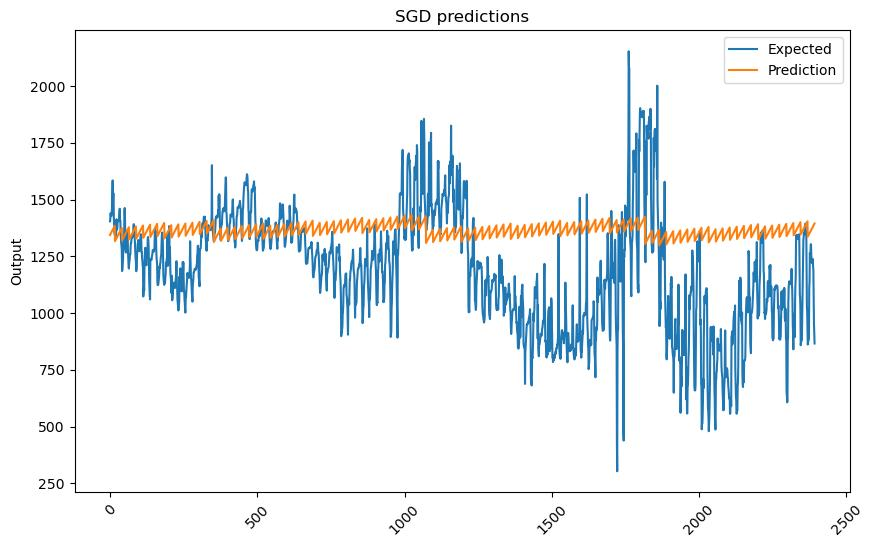

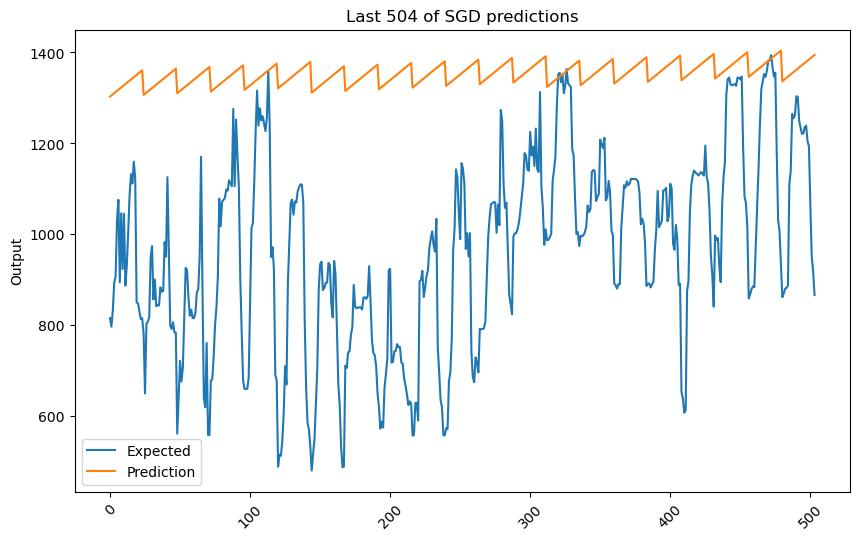

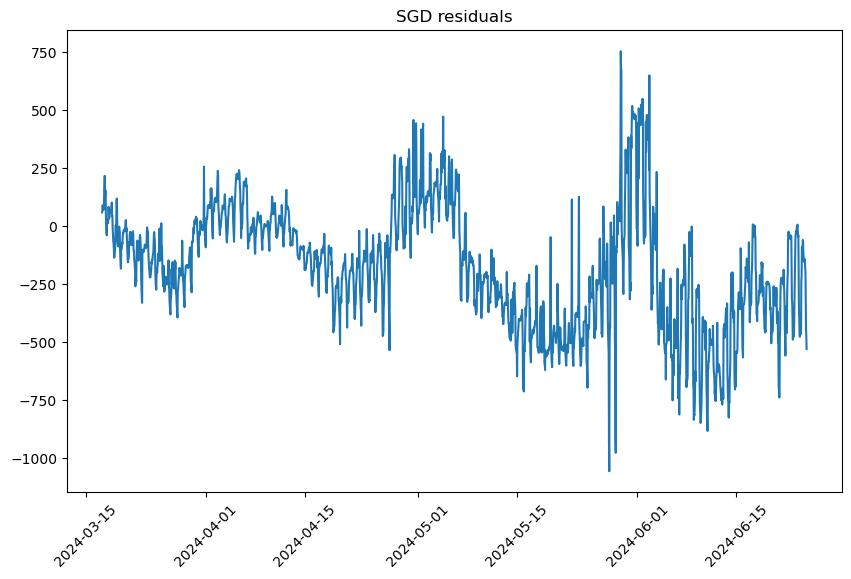

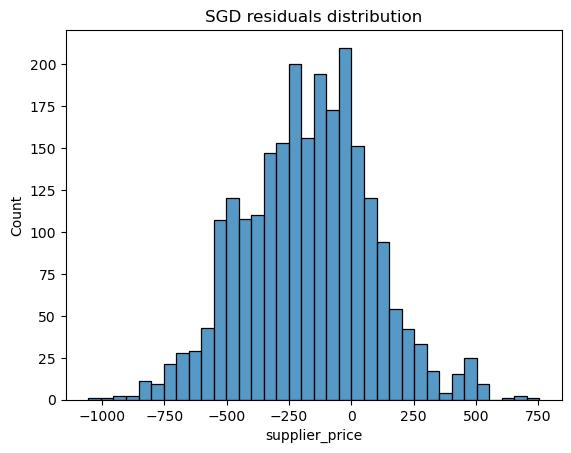

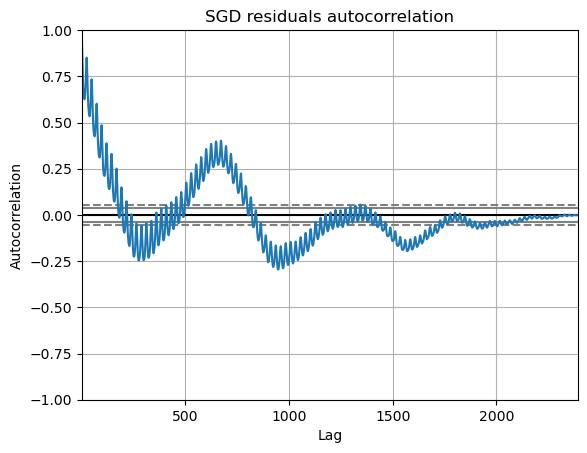

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:      Normal
2.2602052491859252

Jarque-Bera:               Normal
2.221232538397435

Kolmogorov-Smirnov:    NOT Normal
0.02216906978127542

Lilliefors:            NOT Normal
0.02216906978127542

Shapiro-Wilk:          NOT Normal
0.9968633055686951

Anderson–Darling:      NOT Normal
2.046138820667693

Done!

----------------
SVR model...
Fold #1...
Fold #2...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
 

Fold #3...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #4...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #5...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #6...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #7...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #8...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #9...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #10...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


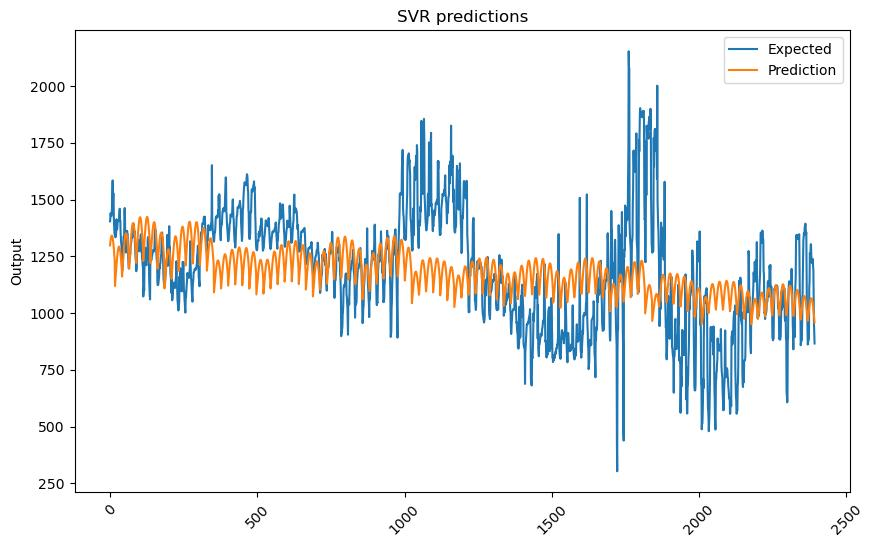

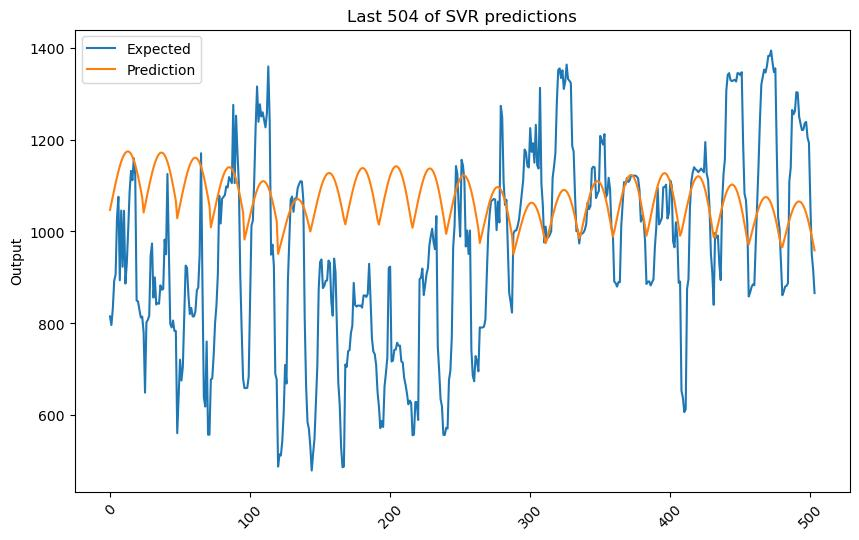

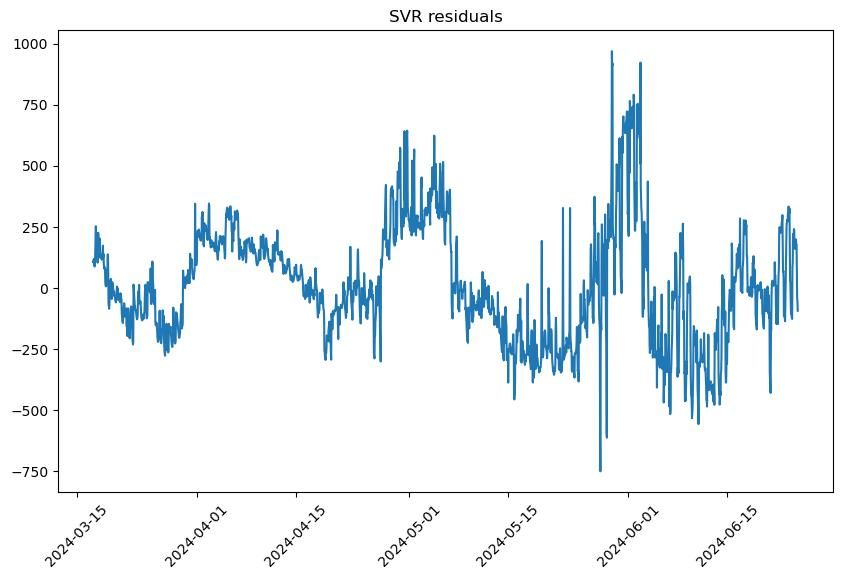

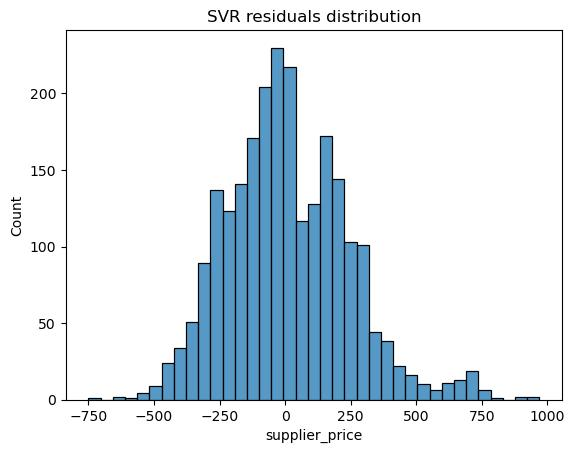

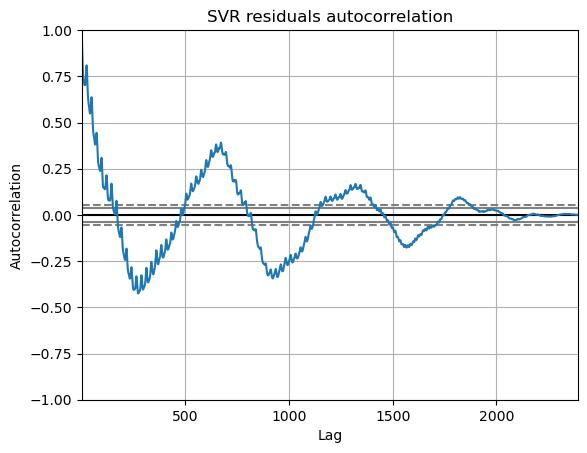

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
117.36702900361426

Jarque-Bera:           NOT Normal
142.54721492384675

Kolmogorov-Smirnov:    NOT Normal
0.04996970774802467

Lilliefors:            NOT Normal
0.04996970774802467

Shapiro-Wilk:          NOT Normal
0.983389675617218

Anderson–Darling:      NOT Normal
6.685562819484403

Done!

----------------
Lin. SVR model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validat

Fold #5...
Fold #6...
Fold #7...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #8...
Fold #9...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Fold #10...


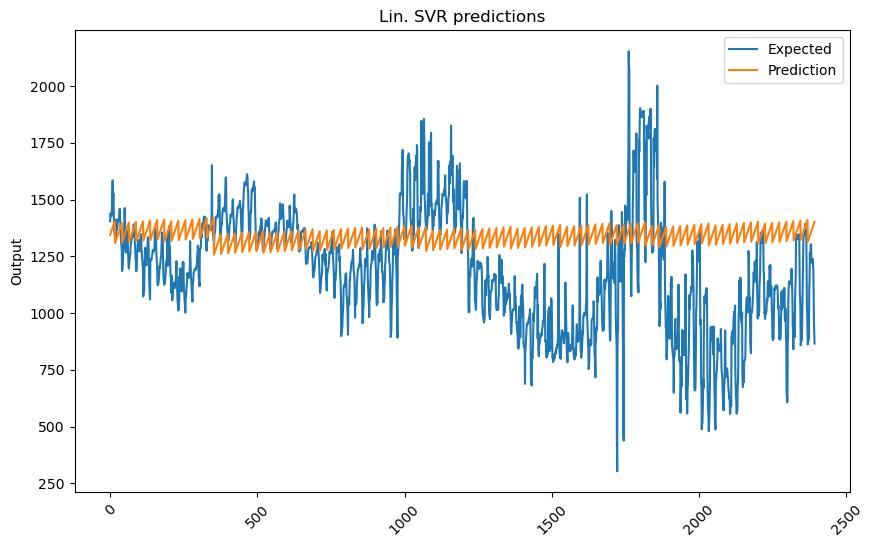

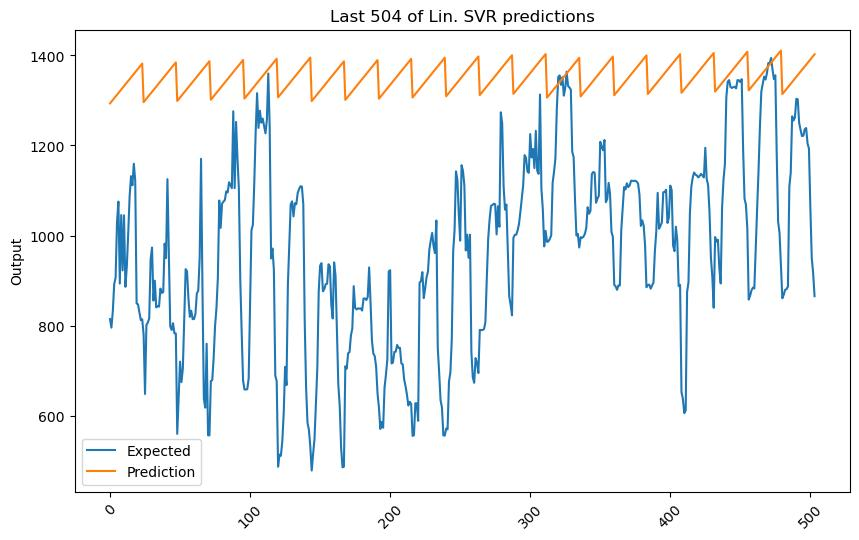

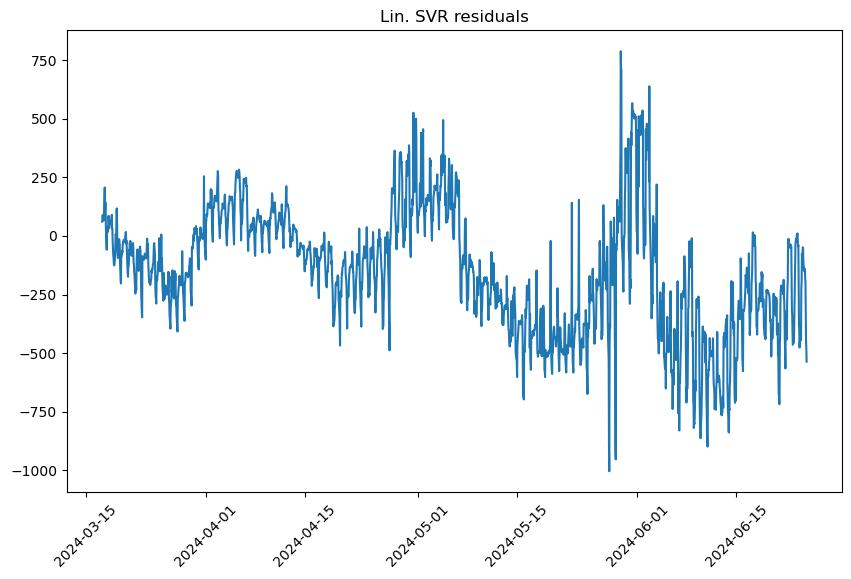

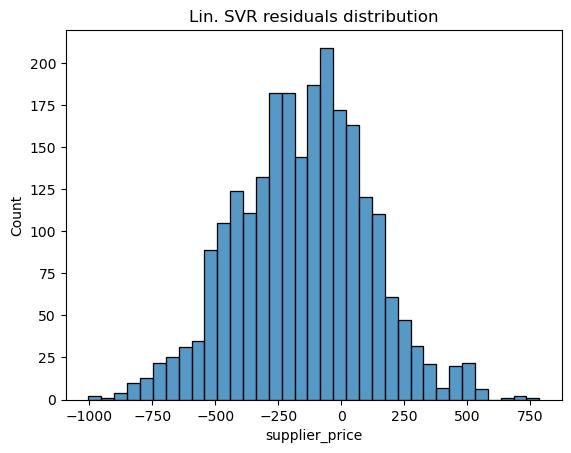

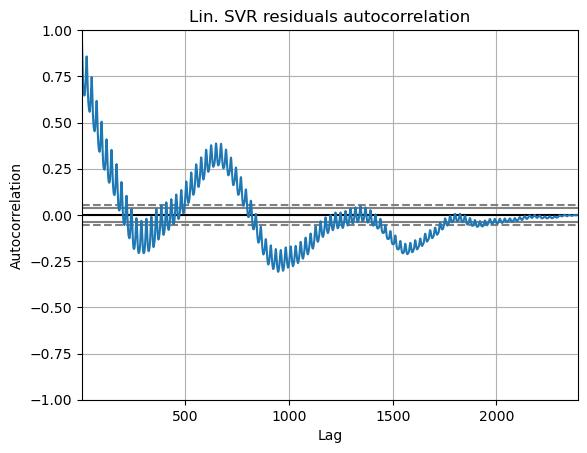

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:      Normal
0.33498019889773567

Jarque-Bera:               Normal
0.2654865357722211

Kolmogorov-Smirnov:    NOT Normal
0.02354661152137938

Lilliefors:            NOT Normal
0.02354661152137938

Shapiro-Wilk:          NOT Normal
0.9978411793708801

Anderson–Darling:      NOT Normal
1.5297742314060088

Done!

----------------
KNN model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


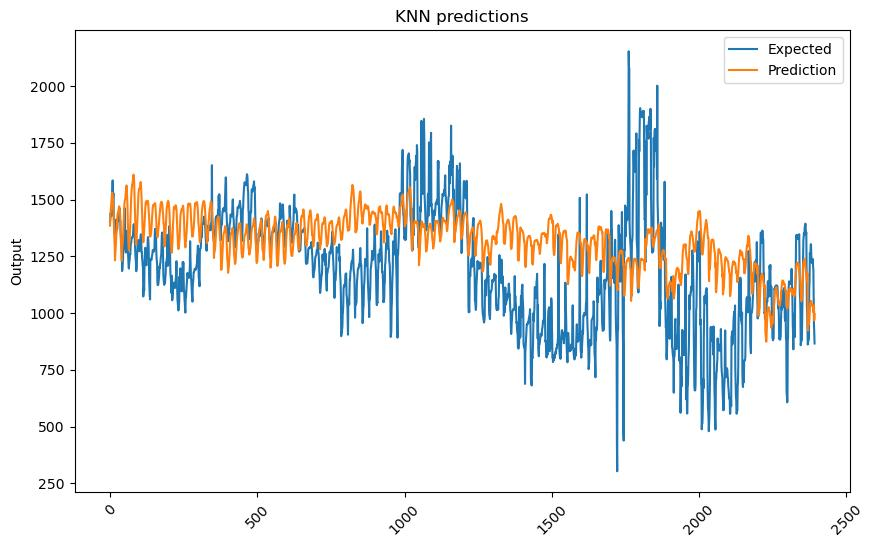

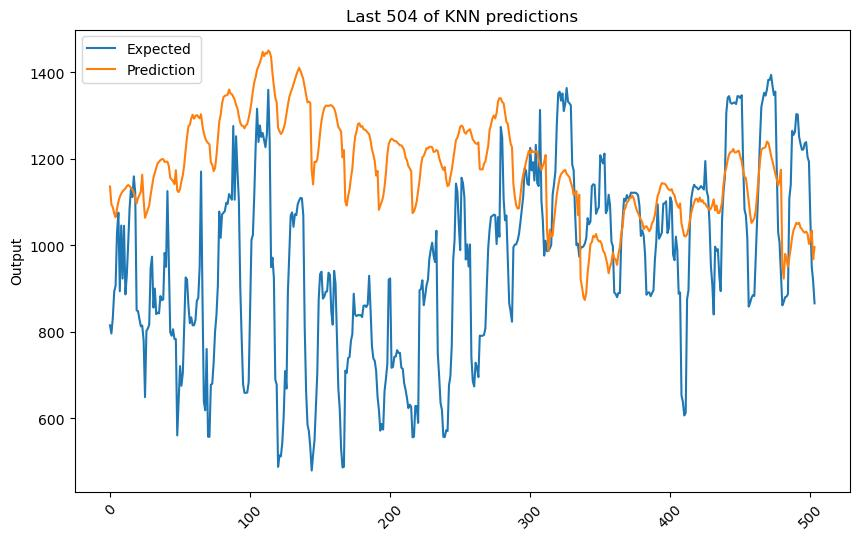

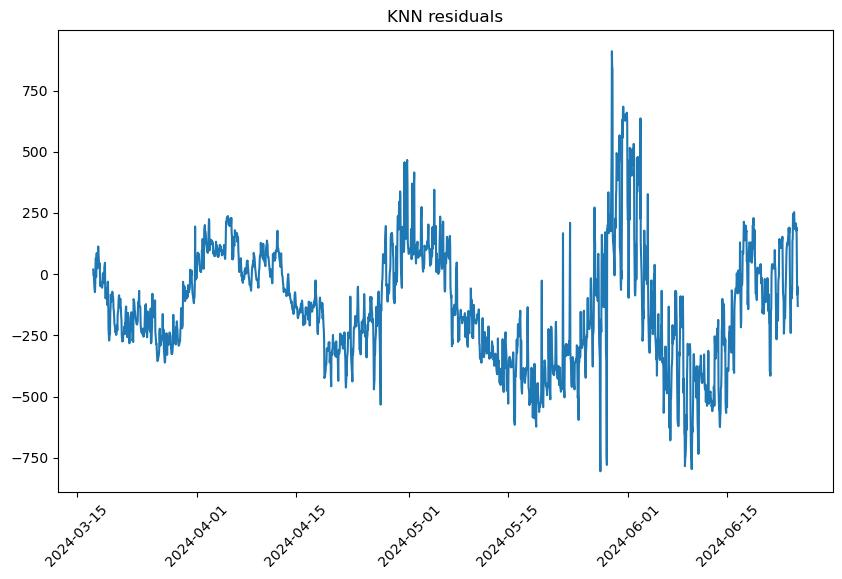

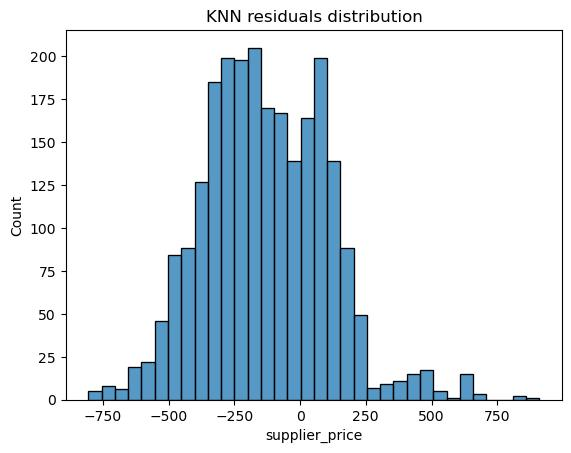

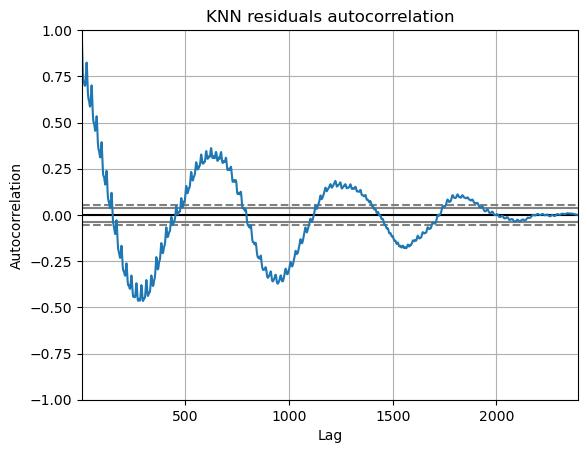

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
73.2376454842586

Jarque-Bera:           NOT Normal
88.43696183268602

Kolmogorov-Smirnov:    NOT Normal
0.03317942737367657

Lilliefors:            NOT Normal
0.03317942737367657

Shapiro-Wilk:          NOT Normal
0.9868924021720886

Anderson–Darling:      NOT Normal
5.46047737876097

Done!

----------------
CART model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


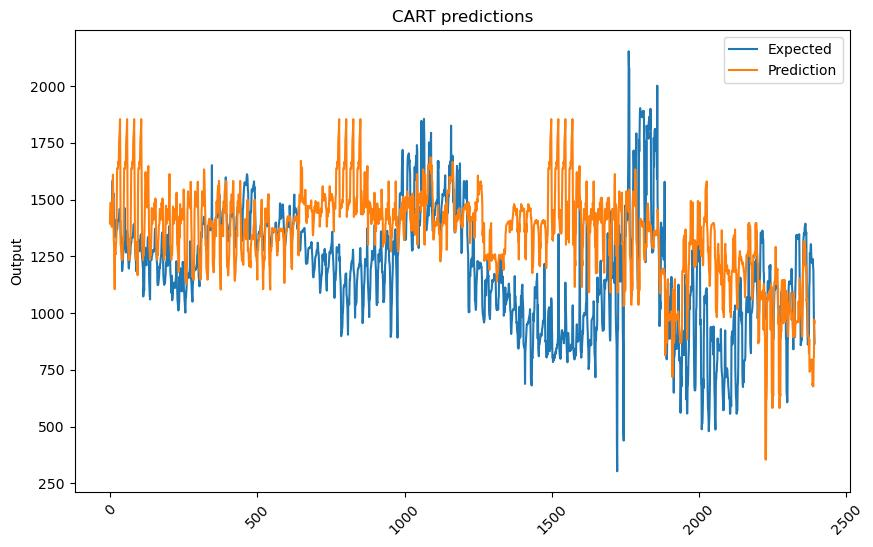

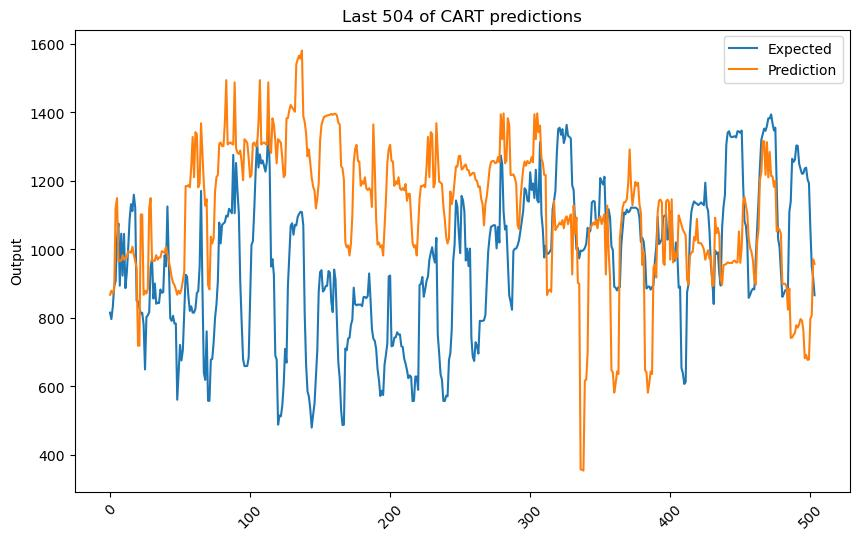

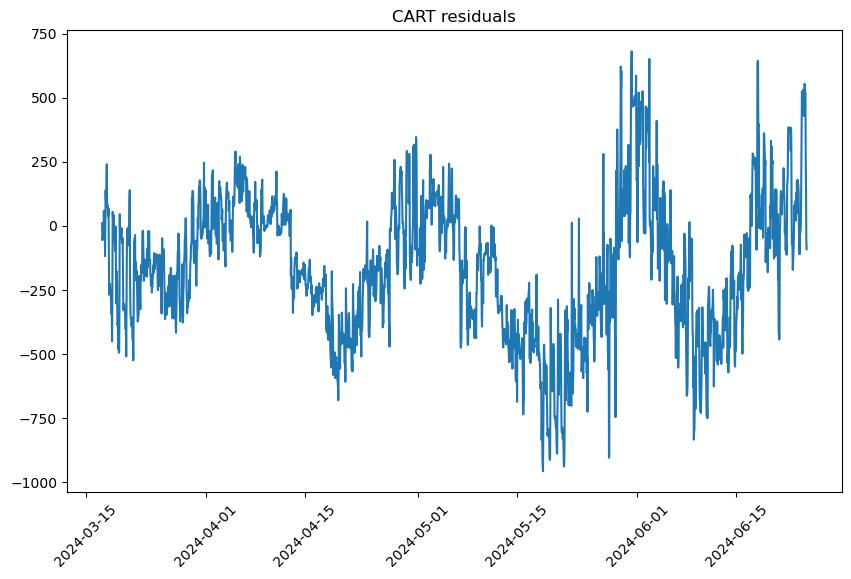

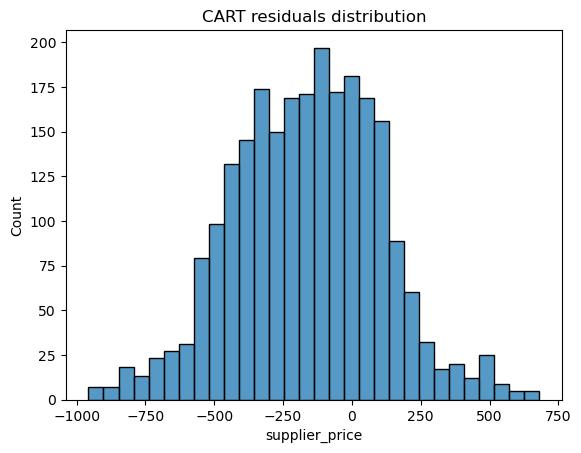

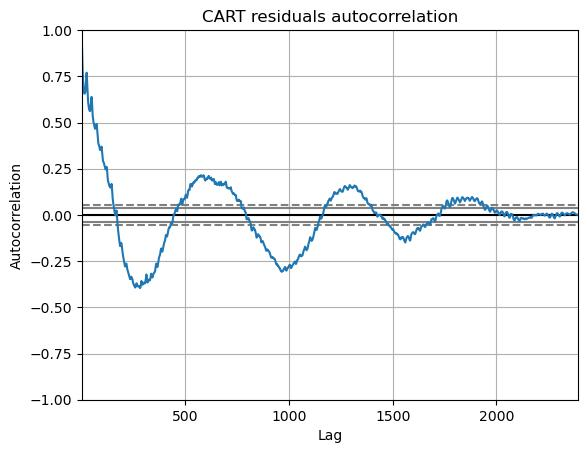

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:      Normal
0.34276922046443603

Jarque-Bera:               Normal
0.2733566278926596

Kolmogorov-Smirnov:    NOT Normal
0.024681688439278315

Lilliefors:            NOT Normal
0.024681688439278315

Shapiro-Wilk:          NOT Normal
0.996830940246582

Anderson–Darling:      NOT Normal
1.9394419511781962

Done!

----------------
RF model...
Fold #1...


C:\Users\dexp\AppData\Local\Temp\ipykernel_6264\1645443492.py:29: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #2...


C:\Users\dexp\AppData\Local\Temp\ipykernel_6264\1645443492.py:29: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #3...


C:\Users\dexp\AppData\Local\Temp\ipykernel_6264\1645443492.py:29: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #4...


C:\Users\dexp\AppData\Local\Temp\ipykernel_6264\1645443492.py:29: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #5...


C:\Users\dexp\AppData\Local\Temp\ipykernel_6264\1645443492.py:29: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #6...


C:\Users\dexp\AppData\Local\Temp\ipykernel_6264\1645443492.py:29: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #7...


C:\Users\dexp\AppData\Local\Temp\ipykernel_6264\1645443492.py:29: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #8...


C:\Users\dexp\AppData\Local\Temp\ipykernel_6264\1645443492.py:29: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #9...


C:\Users\dexp\AppData\Local\Temp\ipykernel_6264\1645443492.py:29: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #10...


C:\Users\dexp\AppData\Local\Temp\ipykernel_6264\1645443492.py:29: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


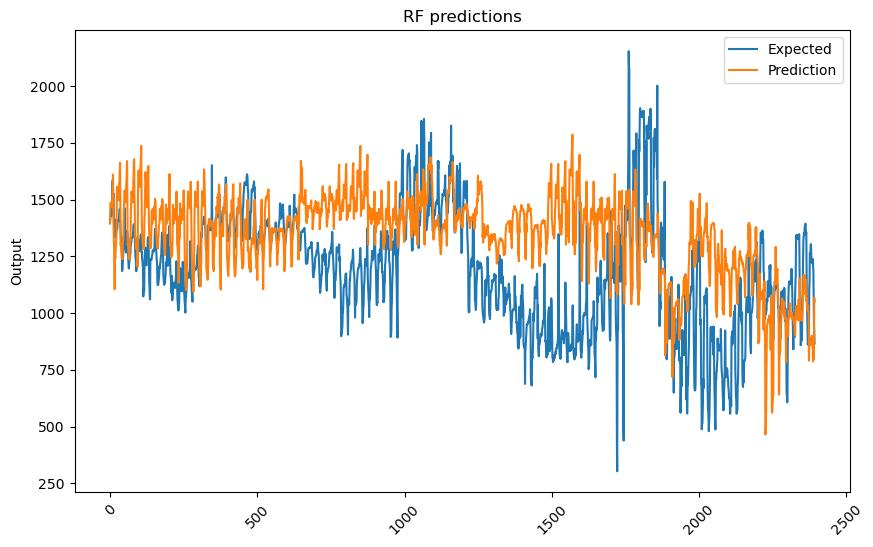

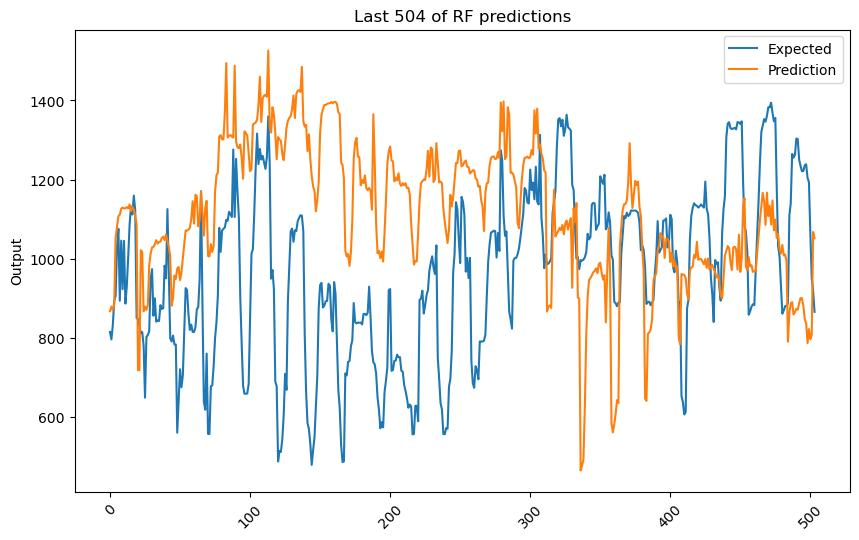

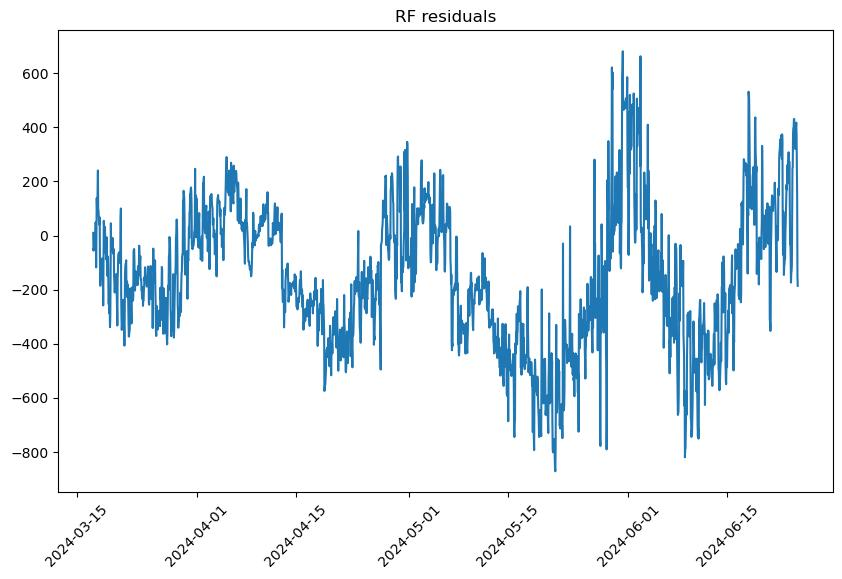

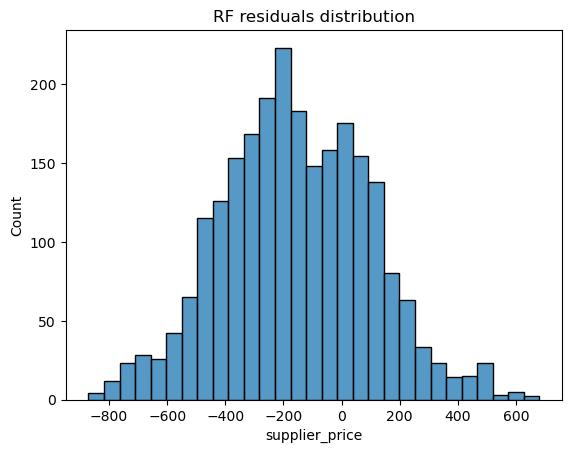

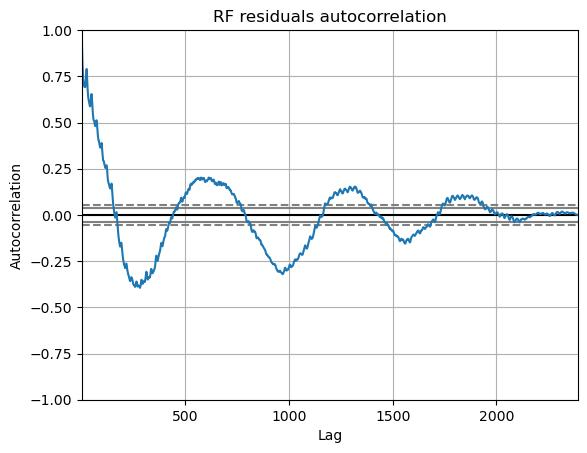

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:      Normal
4.1633058605729385

Jarque-Bera:               Normal
4.217696874925056

Kolmogorov-Smirnov:    NOT Normal
0.025357091433273582

Lilliefors:            NOT Normal
0.025357091433273582

Shapiro-Wilk:          NOT Normal
0.9974043965339661

Anderson–Darling:      NOT Normal
1.345717449008589

Done!

----------------
RF w/B. model...
Fold #1...


C:\Users\dexp\AppData\Local\Temp\ipykernel_6264\1645443492.py:29: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #2...


C:\Users\dexp\AppData\Local\Temp\ipykernel_6264\1645443492.py:29: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #3...


C:\Users\dexp\AppData\Local\Temp\ipykernel_6264\1645443492.py:29: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #4...


C:\Users\dexp\AppData\Local\Temp\ipykernel_6264\1645443492.py:29: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #5...


C:\Users\dexp\AppData\Local\Temp\ipykernel_6264\1645443492.py:29: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #6...


C:\Users\dexp\AppData\Local\Temp\ipykernel_6264\1645443492.py:29: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #7...


C:\Users\dexp\AppData\Local\Temp\ipykernel_6264\1645443492.py:29: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #8...


C:\Users\dexp\AppData\Local\Temp\ipykernel_6264\1645443492.py:29: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #9...


C:\Users\dexp\AppData\Local\Temp\ipykernel_6264\1645443492.py:29: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #10...


C:\Users\dexp\AppData\Local\Temp\ipykernel_6264\1645443492.py:29: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


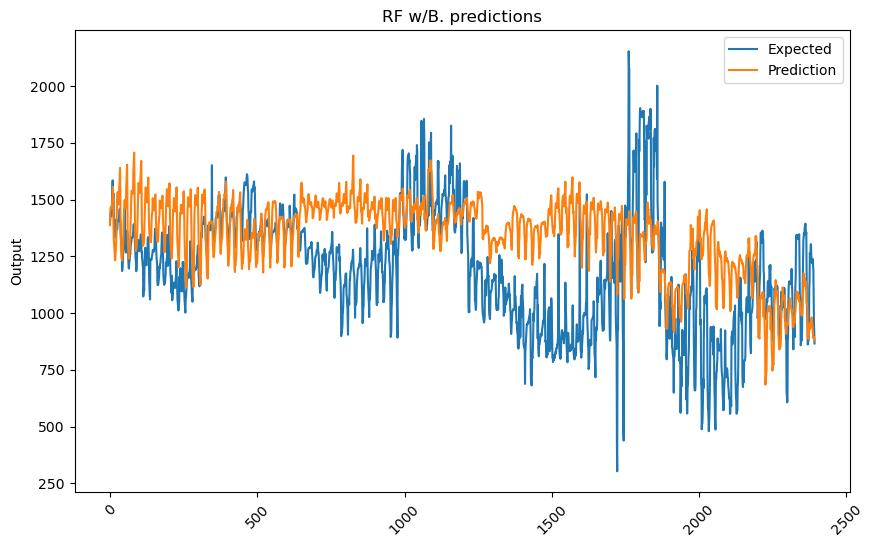

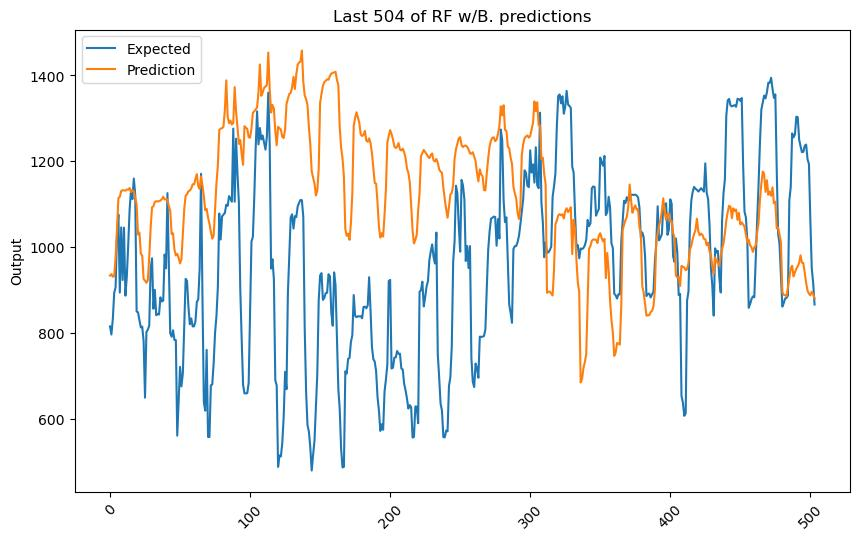

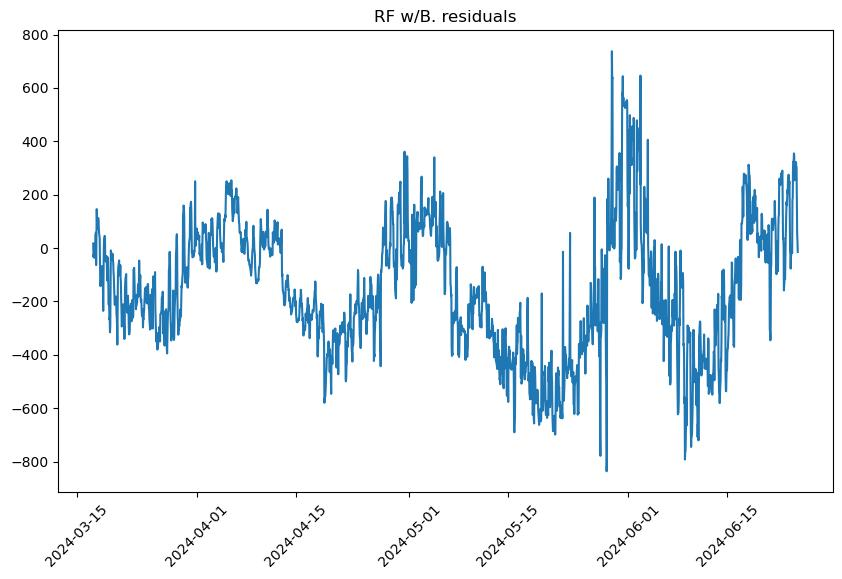

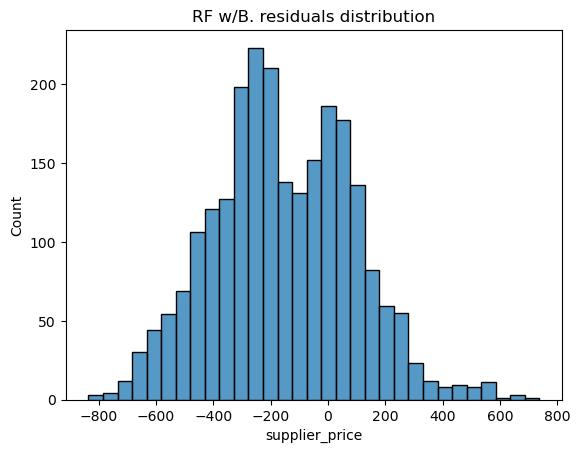

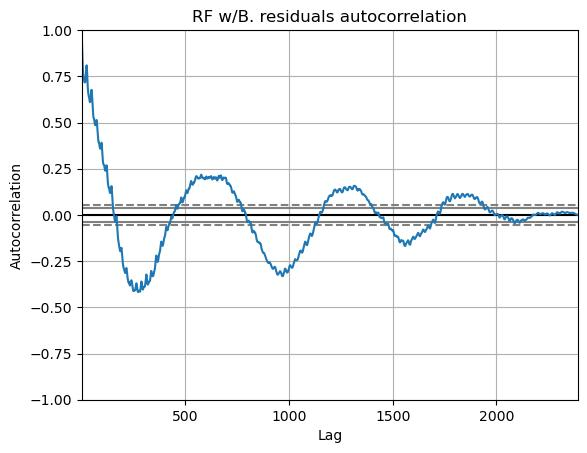

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
11.818769489054212

Jarque-Bera:           NOT Normal
11.94895208536291

Kolmogorov-Smirnov:    NOT Normal
0.03772708652146656

Lilliefors:            NOT Normal
0.03772708652146656

Shapiro-Wilk:          NOT Normal
0.9949361681938171

Anderson–Darling:      NOT Normal
3.0902966782182375

Done!

----------------
XT model...
Fold #1...


C:\Users\dexp\AppData\Local\Temp\ipykernel_6264\1645443492.py:29: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #2...


C:\Users\dexp\AppData\Local\Temp\ipykernel_6264\1645443492.py:29: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #3...


C:\Users\dexp\AppData\Local\Temp\ipykernel_6264\1645443492.py:29: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #4...


C:\Users\dexp\AppData\Local\Temp\ipykernel_6264\1645443492.py:29: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #5...


C:\Users\dexp\AppData\Local\Temp\ipykernel_6264\1645443492.py:29: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #6...


C:\Users\dexp\AppData\Local\Temp\ipykernel_6264\1645443492.py:29: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #7...


C:\Users\dexp\AppData\Local\Temp\ipykernel_6264\1645443492.py:29: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #8...


C:\Users\dexp\AppData\Local\Temp\ipykernel_6264\1645443492.py:29: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #9...


C:\Users\dexp\AppData\Local\Temp\ipykernel_6264\1645443492.py:29: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #10...


C:\Users\dexp\AppData\Local\Temp\ipykernel_6264\1645443492.py:29: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


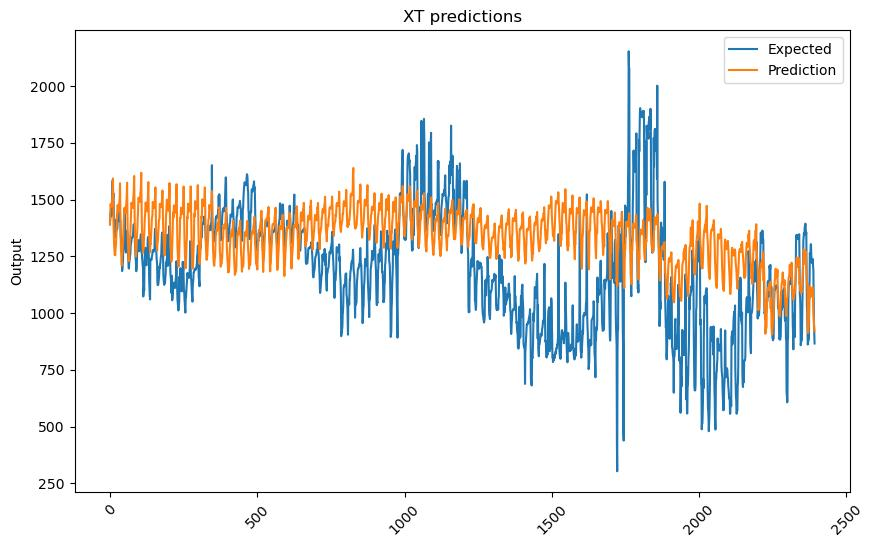

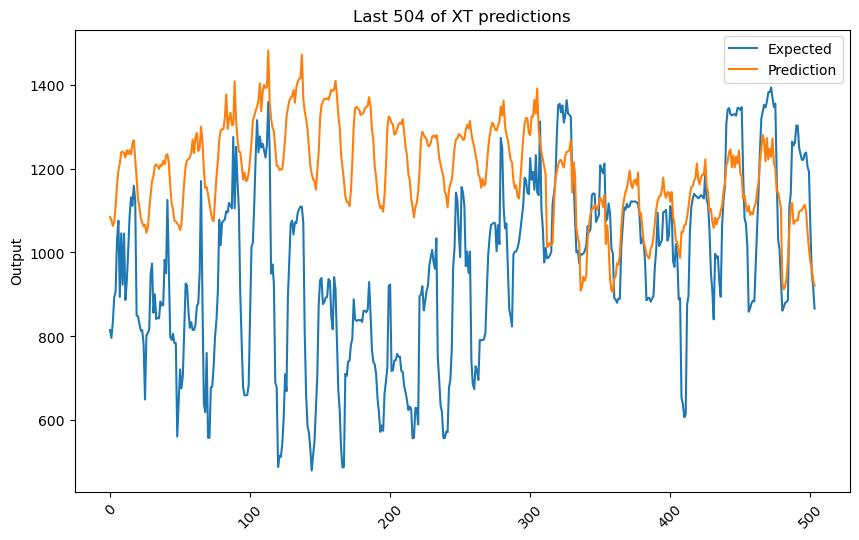

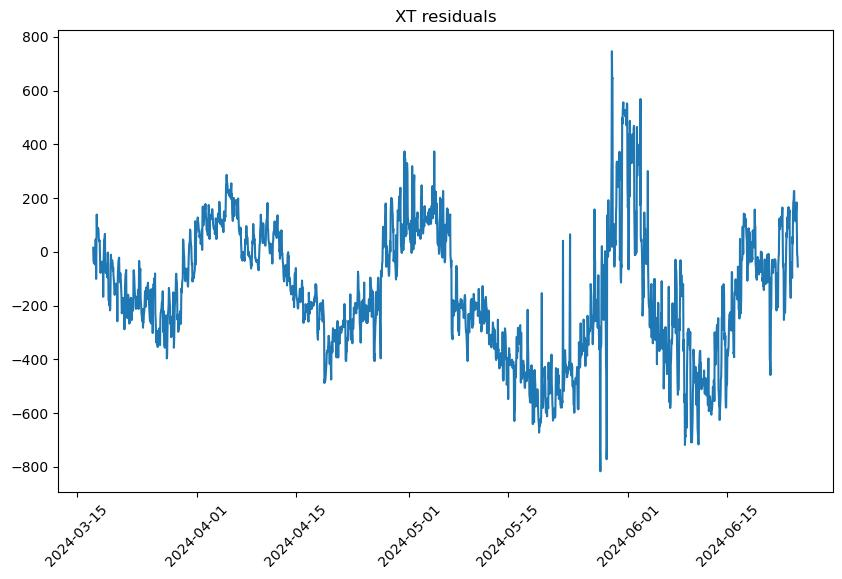

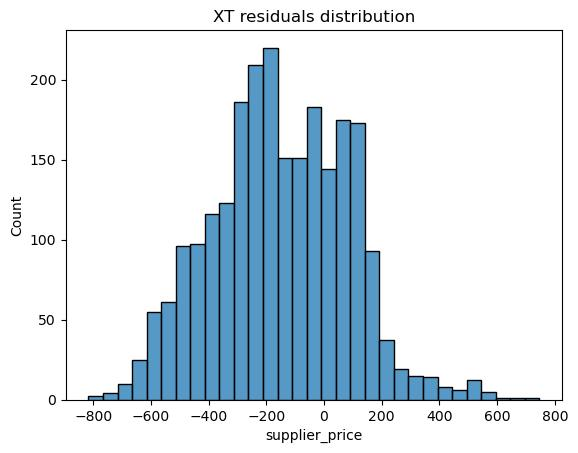

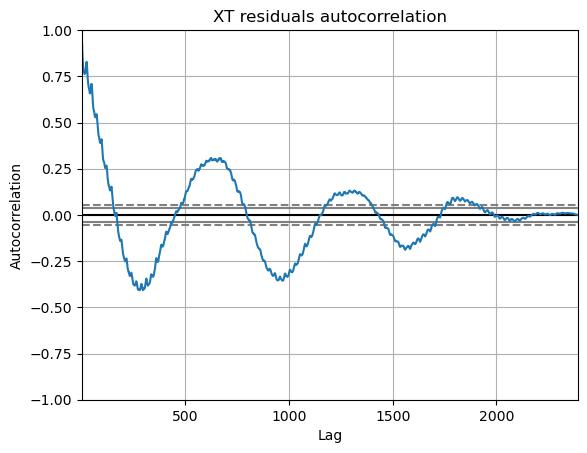

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
6.800623540454646

Jarque-Bera:           NOT Normal
6.655589230686751

Kolmogorov-Smirnov:    NOT Normal
0.03484034010823289

Lilliefors:            NOT Normal
0.03484034010823289

Shapiro-Wilk:          NOT Normal
0.9931653738021851

Anderson–Darling:      NOT Normal
3.987935175295661

Done!

----------------
XT w/B. model...
Fold #1...


C:\Users\dexp\AppData\Local\Temp\ipykernel_6264\1645443492.py:29: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #2...


C:\Users\dexp\AppData\Local\Temp\ipykernel_6264\1645443492.py:29: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #3...


C:\Users\dexp\AppData\Local\Temp\ipykernel_6264\1645443492.py:29: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #4...


C:\Users\dexp\AppData\Local\Temp\ipykernel_6264\1645443492.py:29: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #5...


C:\Users\dexp\AppData\Local\Temp\ipykernel_6264\1645443492.py:29: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #6...


C:\Users\dexp\AppData\Local\Temp\ipykernel_6264\1645443492.py:29: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #7...


C:\Users\dexp\AppData\Local\Temp\ipykernel_6264\1645443492.py:29: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #8...


C:\Users\dexp\AppData\Local\Temp\ipykernel_6264\1645443492.py:29: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #9...


C:\Users\dexp\AppData\Local\Temp\ipykernel_6264\1645443492.py:29: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #10...


C:\Users\dexp\AppData\Local\Temp\ipykernel_6264\1645443492.py:29: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


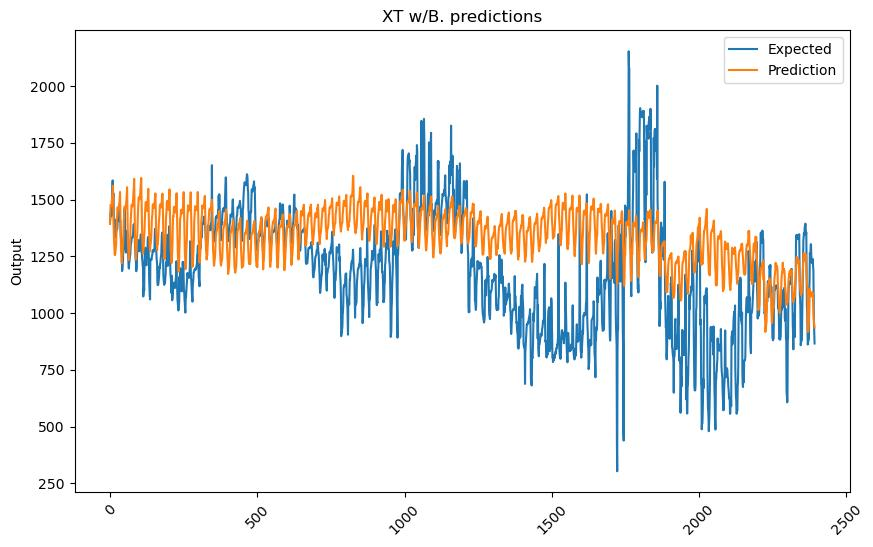

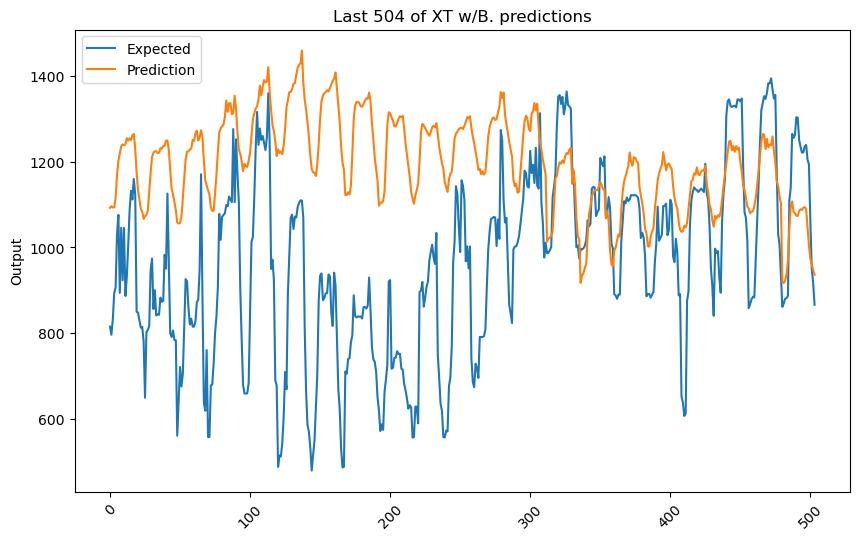

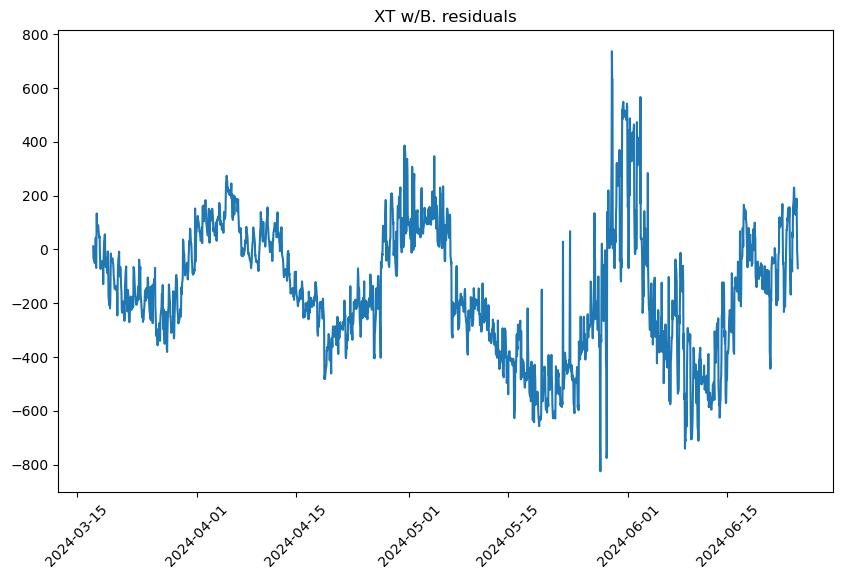

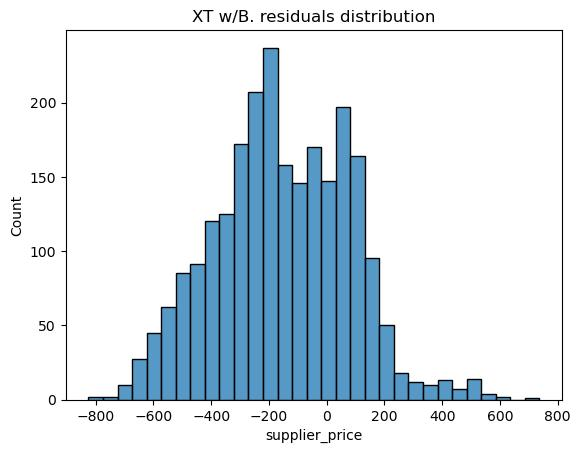

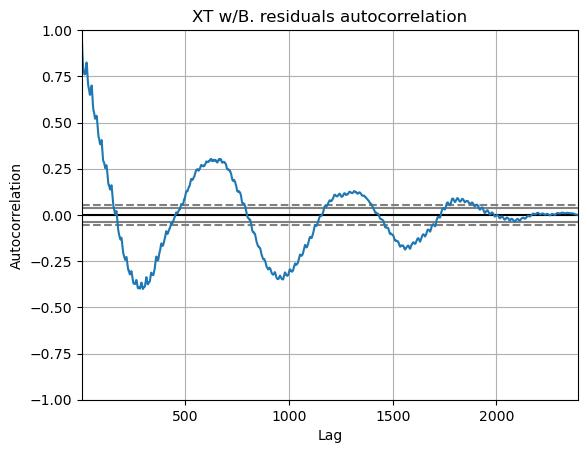

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:      Normal
5.4200015921638265

Jarque-Bera:               Normal
5.437281792208338

Kolmogorov-Smirnov:    NOT Normal
0.033925725679955665

Lilliefors:            NOT Normal
0.033925725679955665

Shapiro-Wilk:          NOT Normal
0.9934287667274475

Anderson–Darling:      NOT Normal
3.8093400871539416

Done!

----------------
BAG model...
Fold #1...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #2...
Fold #3...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #4...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #5...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #6...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #7...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #8...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #9...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #10...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


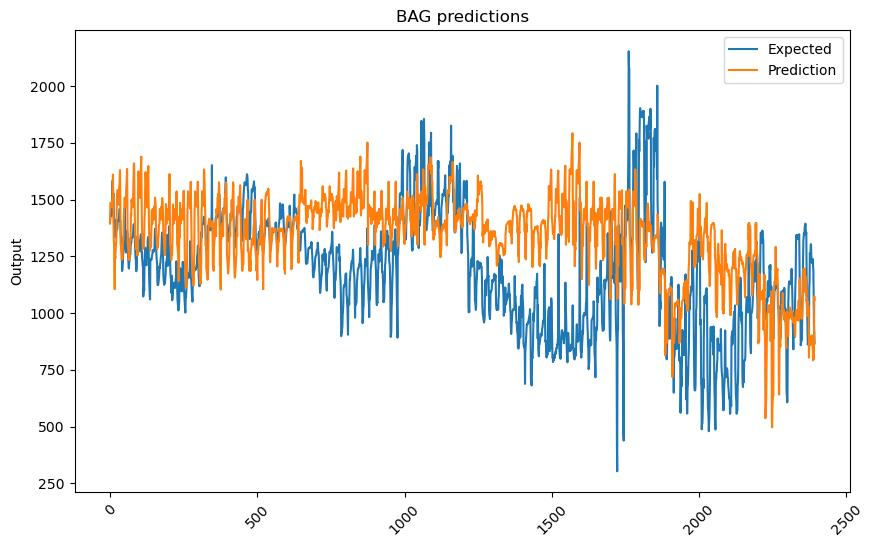

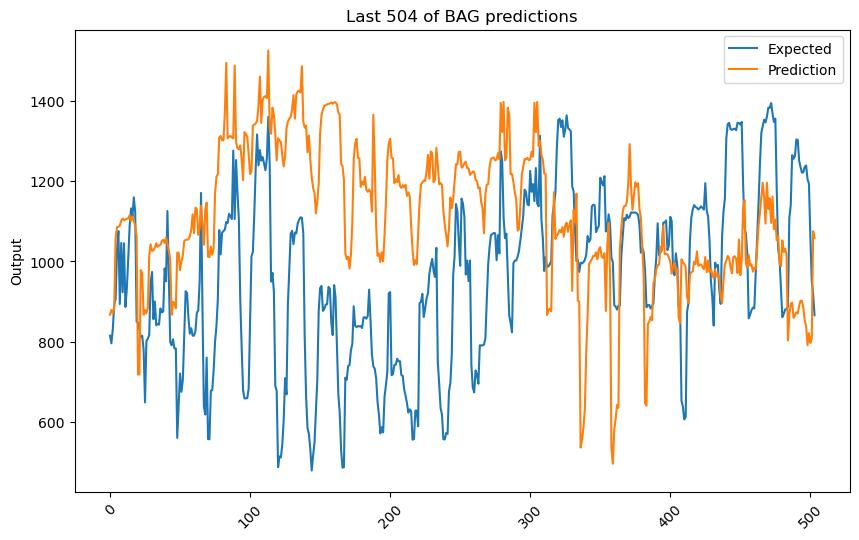

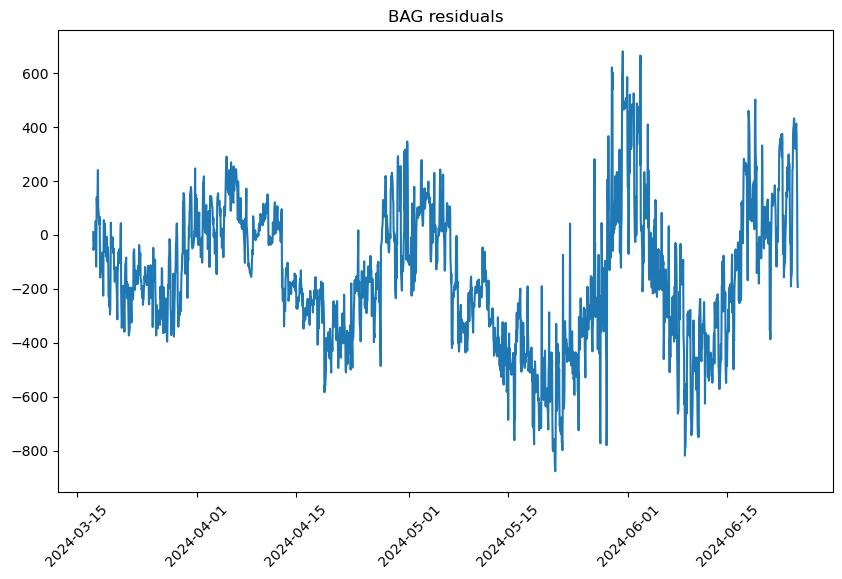

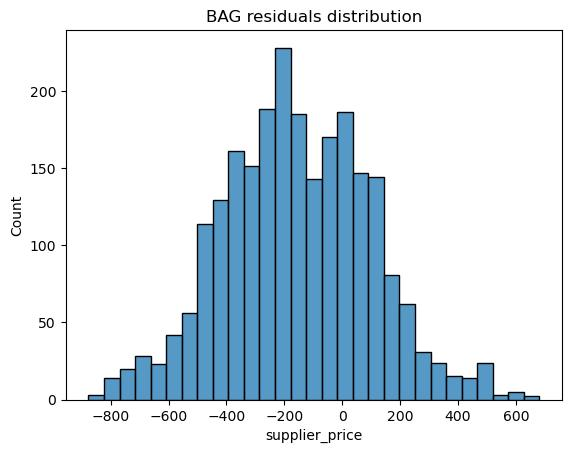

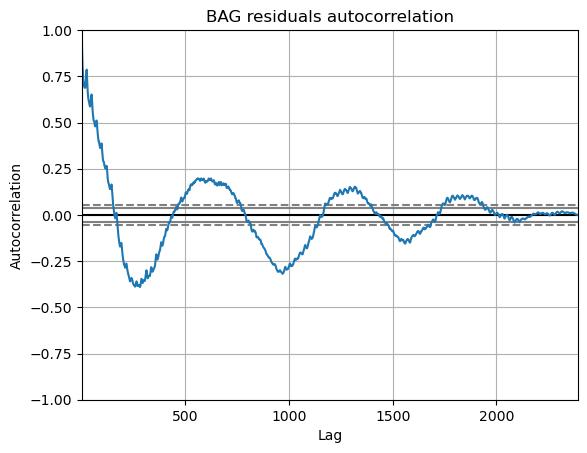

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:      Normal
3.3434352769053697

Jarque-Bera:               Normal
3.3963807055889172

Kolmogorov-Smirnov:    NOT Normal
0.022327249129913462

Lilliefors:            NOT Normal
0.022327249129913462

Shapiro-Wilk:          NOT Normal
0.997481107711792

Anderson–Darling:      NOT Normal
1.3234828814211141

Done!

----------------
BAG w/B. model...
Fold #1...
Fold #2...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #3...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #4...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #5...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #6...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #7...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #8...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #9...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #10...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


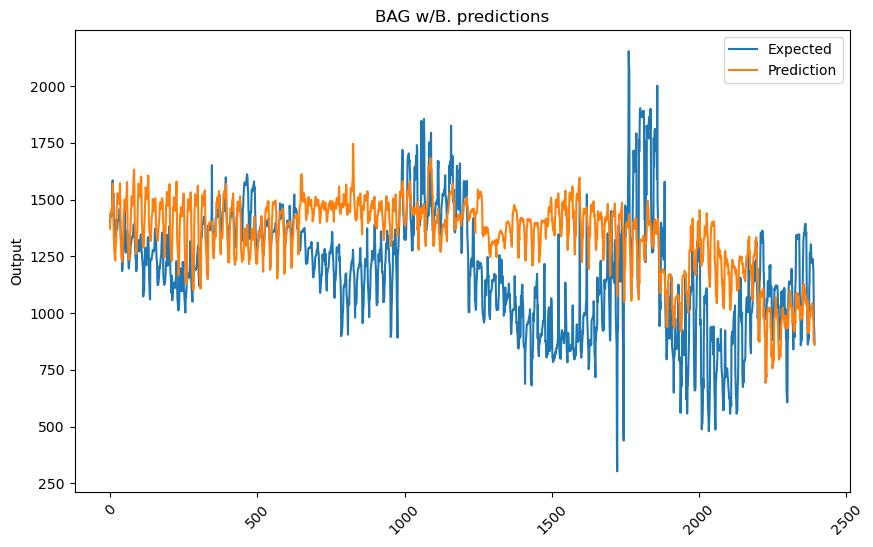

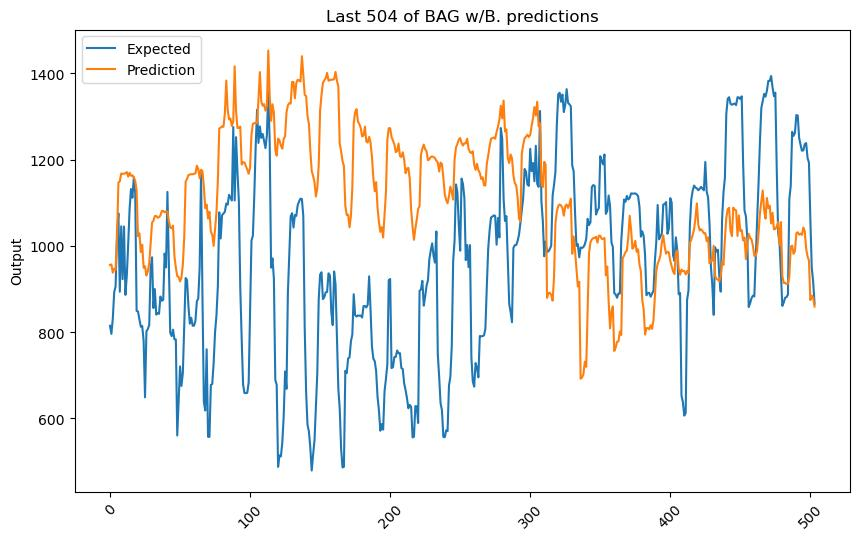

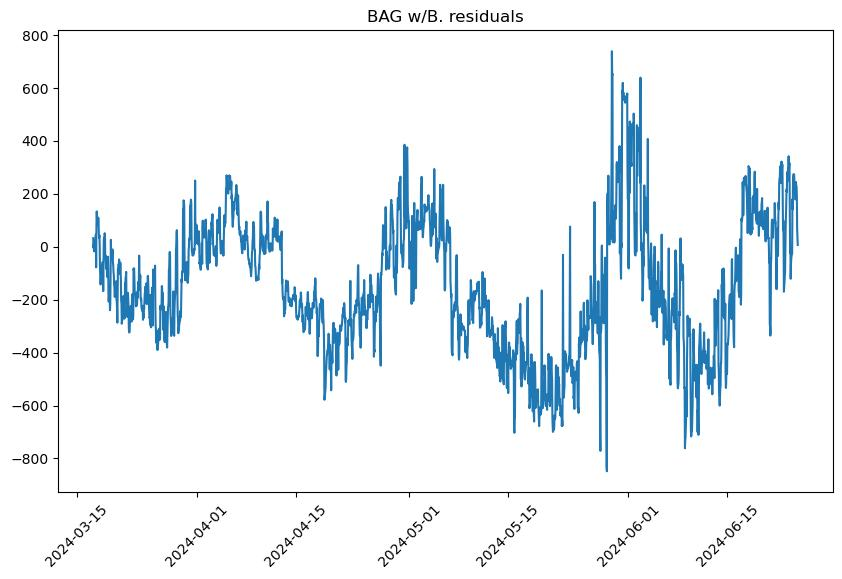

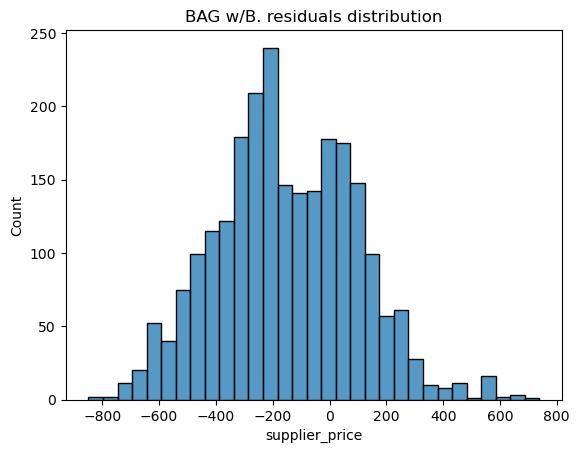

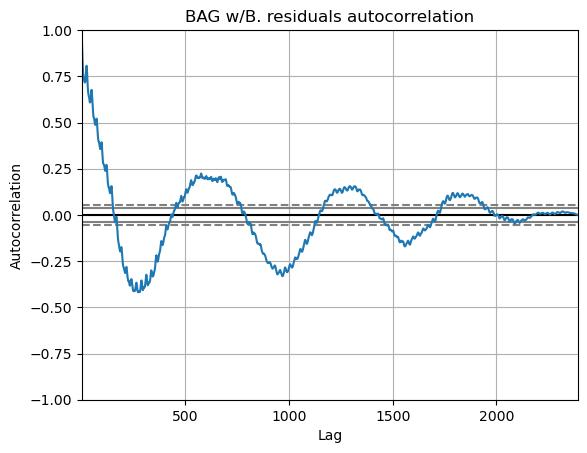

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
12.508356896197418

Jarque-Bera:           NOT Normal
12.663334833709863

Kolmogorov-Smirnov:    NOT Normal
0.03898734080138422

Lilliefors:            NOT Normal
0.03898734080138422

Shapiro-Wilk:          NOT Normal
0.9946026802062988

Anderson–Darling:      NOT Normal
3.222466190817613

Done!

----------------
ADA model...
Fold #1...
Fold #2...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #3...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #4...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #5...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #6...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #7...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #8...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #9...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #10...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


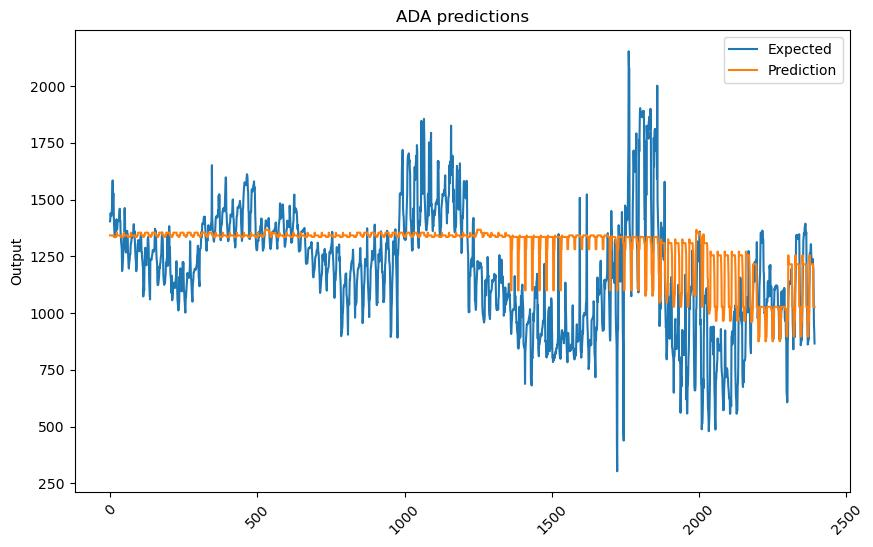

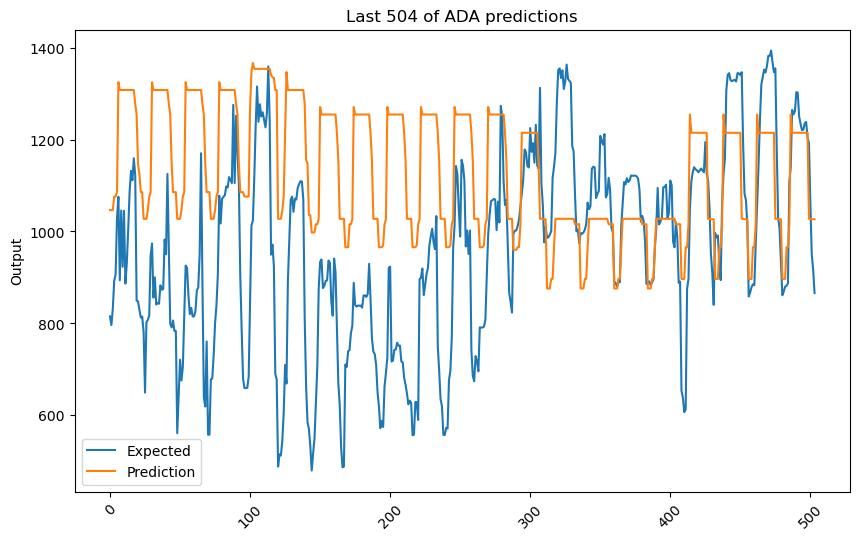

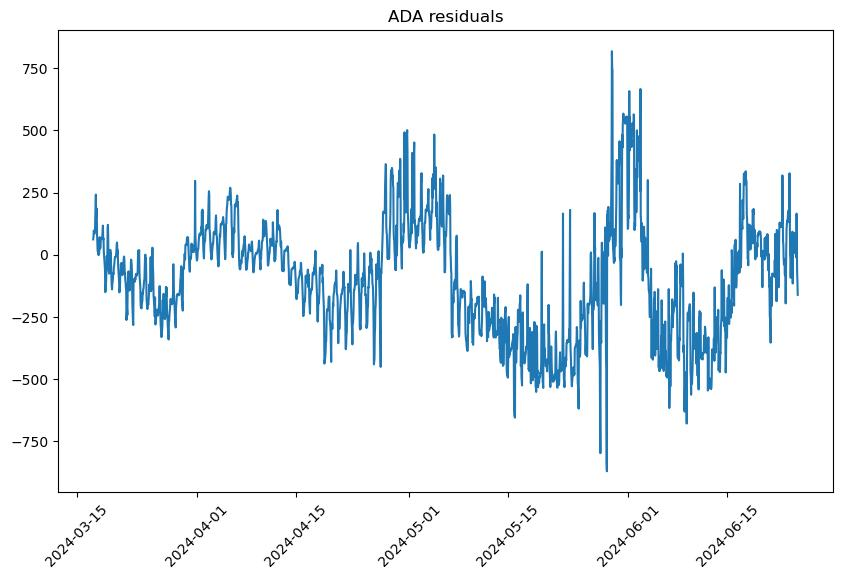

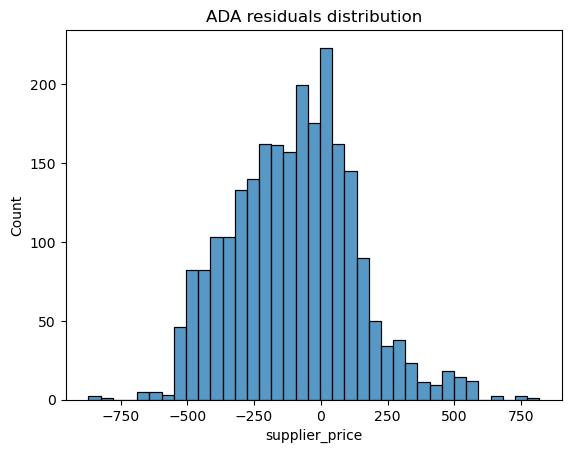

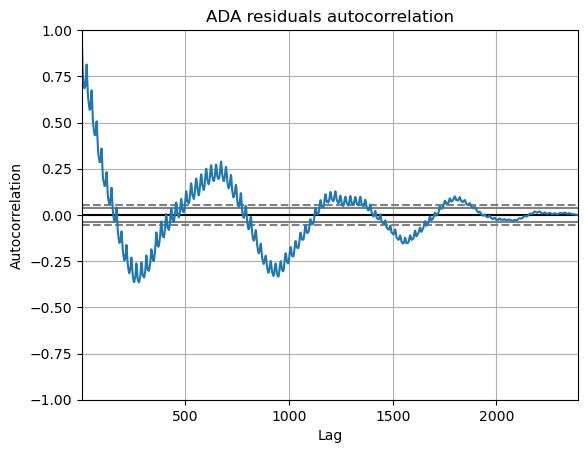

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
24.113064379115745

Jarque-Bera:           NOT Normal
24.818783740969042

Kolmogorov-Smirnov:    NOT Normal
0.027642359390035343

Lilliefors:            NOT Normal
0.027642359390035343

Shapiro-Wilk:          NOT Normal
0.9911236763000488

Anderson–Darling:      NOT Normal
3.9182775366557507

Done!

----------------
HGBoost model...
Fold #1...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #2...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #3...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #4...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #5...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #6...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #7...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #8...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #9...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #10...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


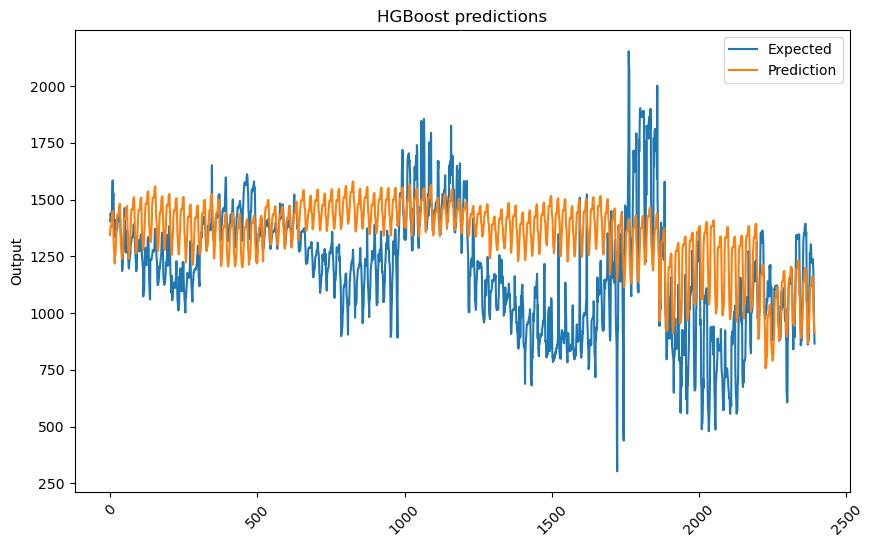

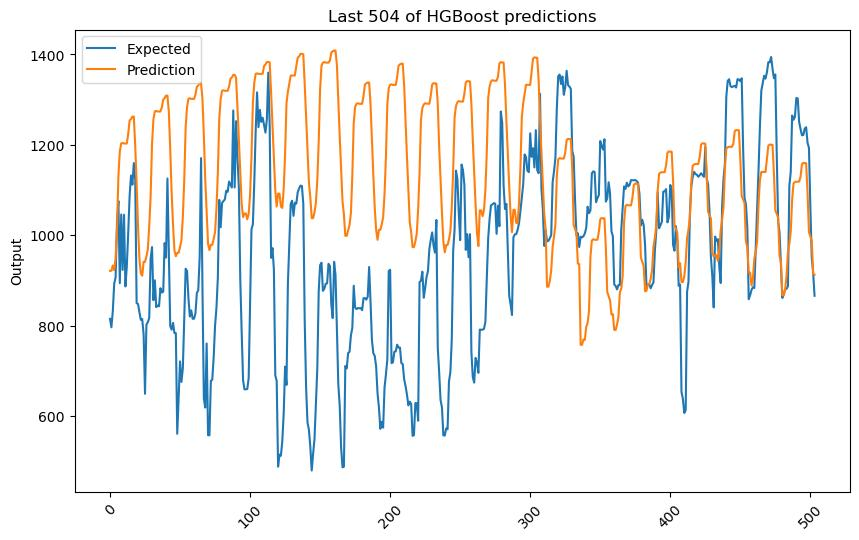

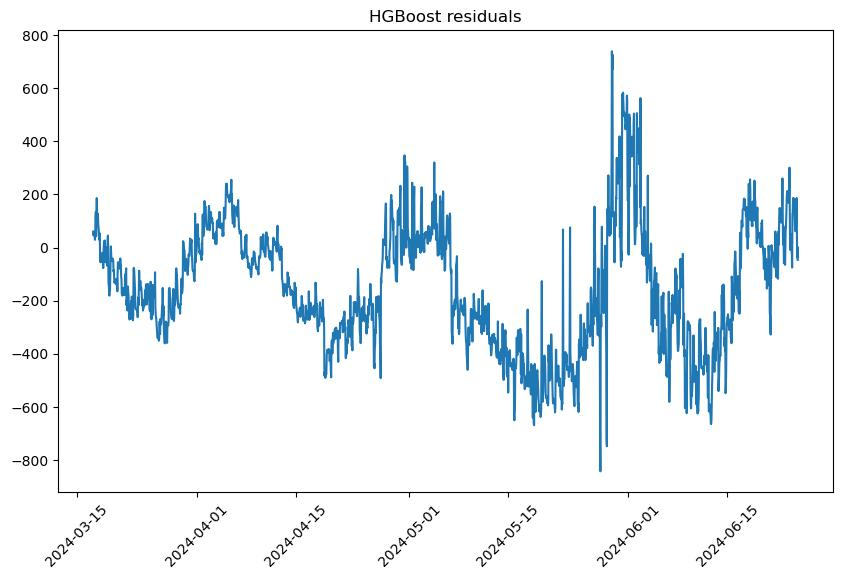

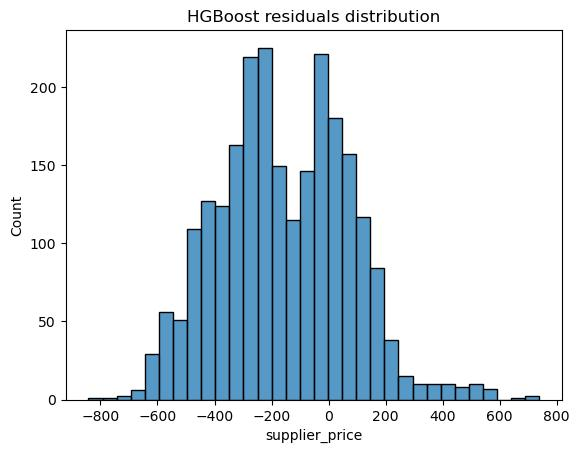

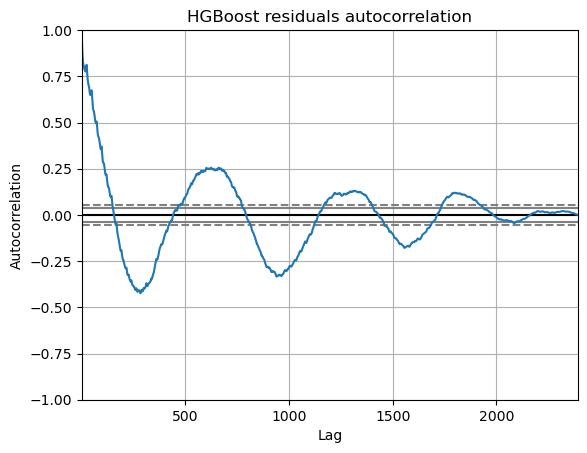

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
20.193671510847395

Jarque-Bera:           NOT Normal
20.62206644204791

Kolmogorov-Smirnov:    NOT Normal
0.045893530653261405

Lilliefors:            NOT Normal
0.045893530653261405

Shapiro-Wilk:          NOT Normal
0.9901862144470215

Anderson–Darling:      NOT Normal
6.081283220240948

Done!

----------------
XGBoost model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


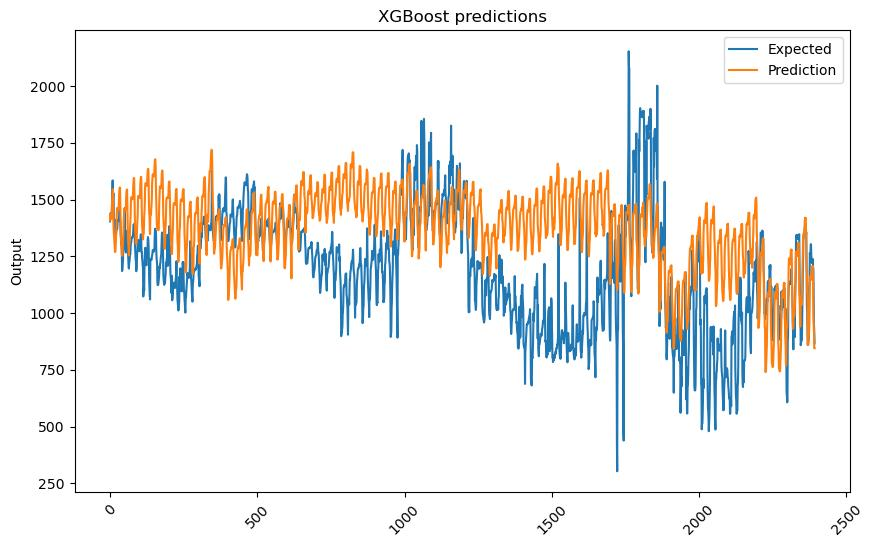

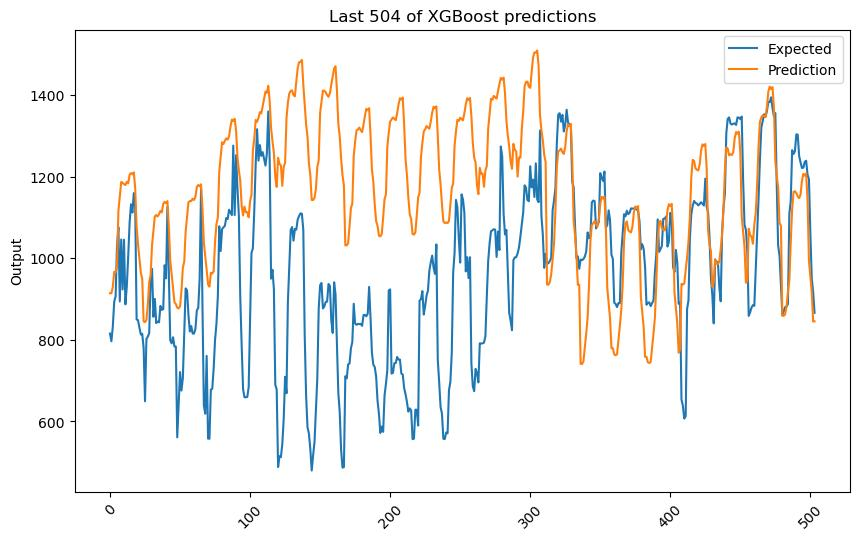

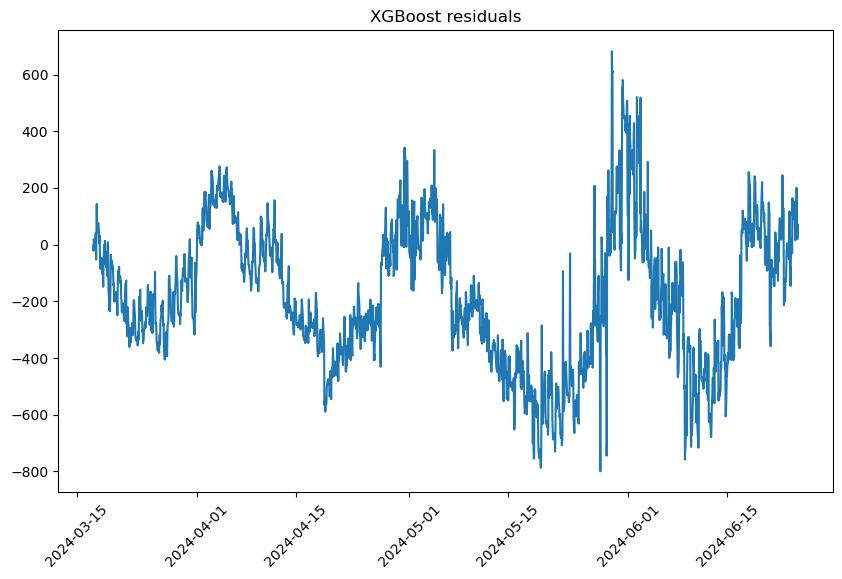

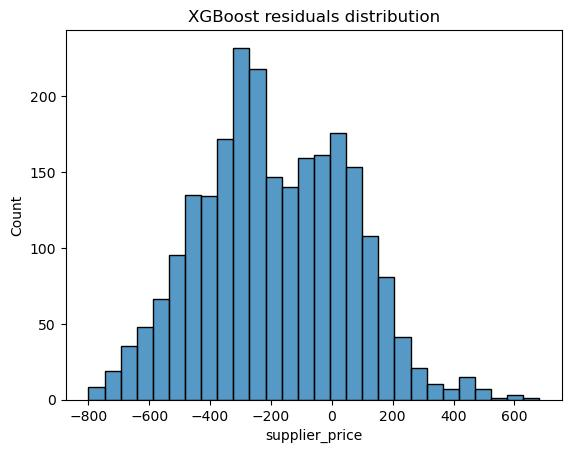

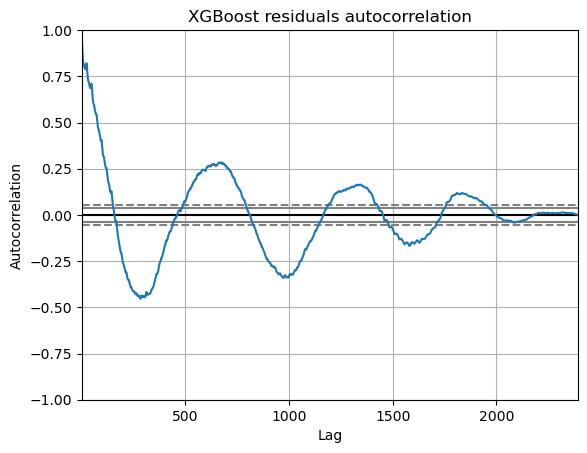

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
19.866109816697108

Jarque-Bera:           NOT Normal
16.42193526408775

Kolmogorov-Smirnov:    NOT Normal
0.042875591360774734

Lilliefors:            NOT Normal
0.042875591360774734

Shapiro-Wilk:          NOT Normal
0.9938627481460571

Anderson–Darling:      NOT Normal
4.584607469616003

Done!

----------------
CatBoost model...
Fold #1...


Default metric period is 5 because MAE is/are not implemented for GPU


Fold #2...


Default metric period is 5 because MAE is/are not implemented for GPU


Fold #3...


Default metric period is 5 because MAE is/are not implemented for GPU


Fold #4...


Default metric period is 5 because MAE is/are not implemented for GPU


Fold #5...


Default metric period is 5 because MAE is/are not implemented for GPU


Fold #6...


Default metric period is 5 because MAE is/are not implemented for GPU


Fold #7...


Default metric period is 5 because MAE is/are not implemented for GPU


Fold #8...


Default metric period is 5 because MAE is/are not implemented for GPU


Fold #9...


Default metric period is 5 because MAE is/are not implemented for GPU


Fold #10...


Default metric period is 5 because MAE is/are not implemented for GPU


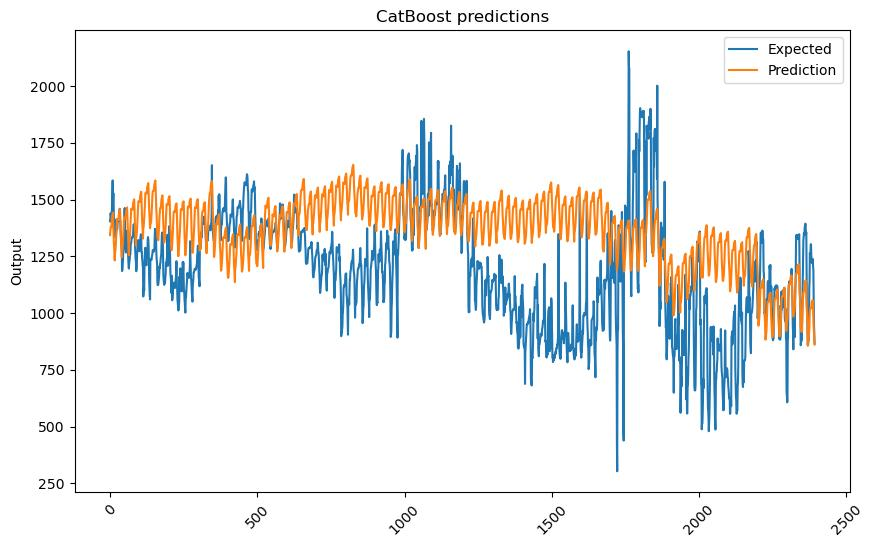

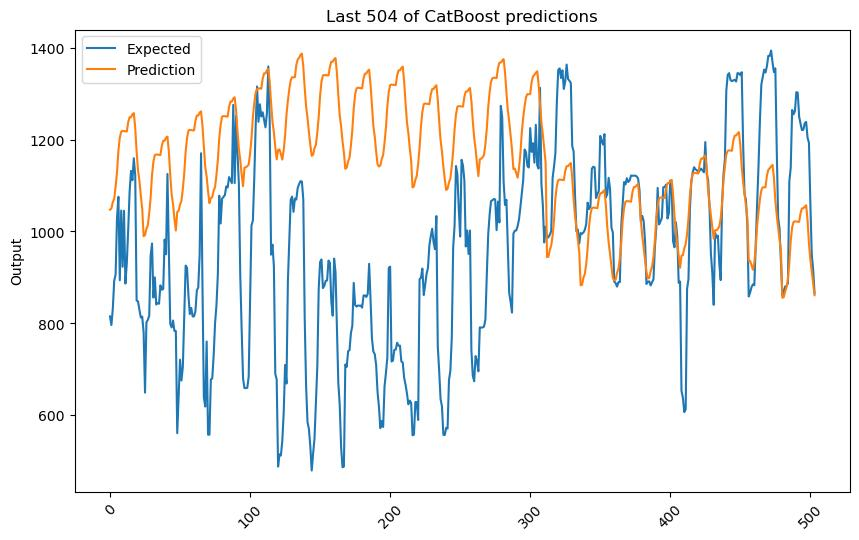

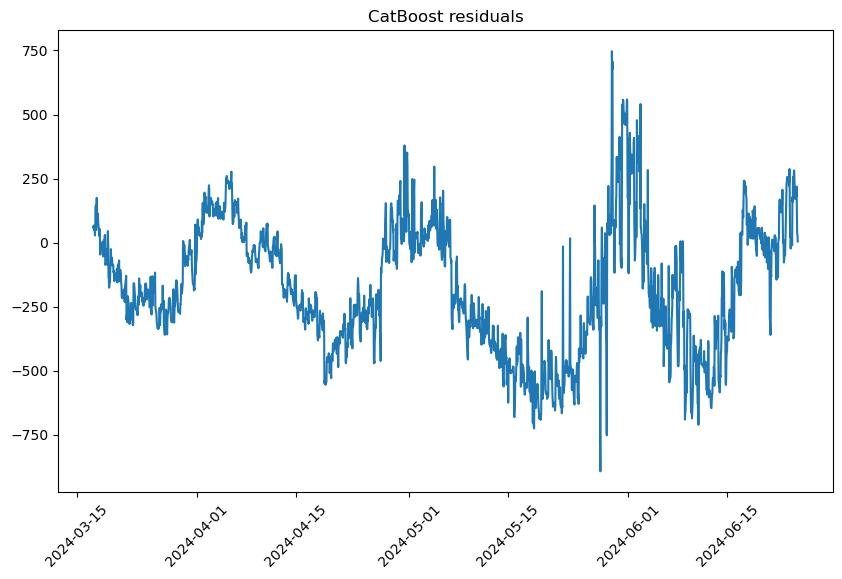

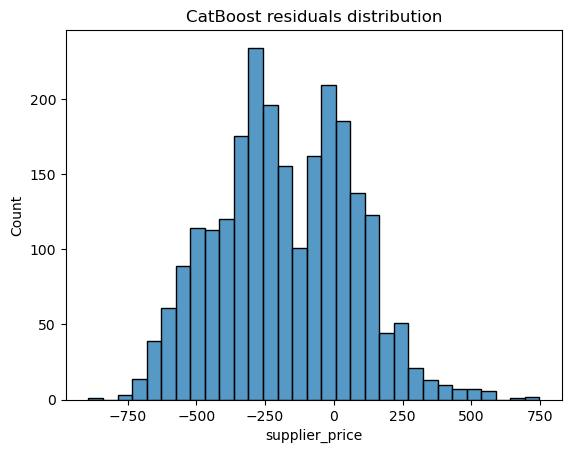

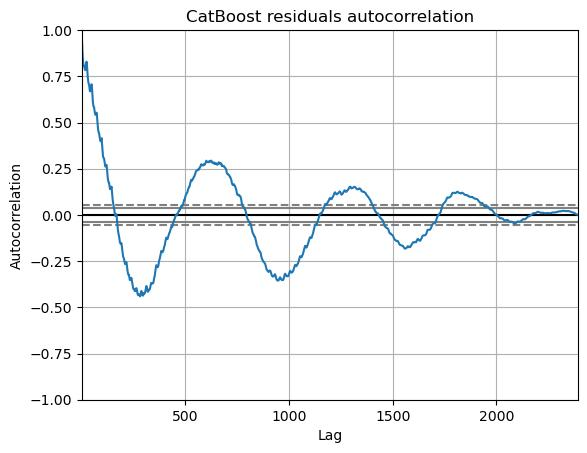

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
22.728358140042914

Jarque-Bera:           NOT Normal
18.508122100678193

Kolmogorov-Smirnov:    NOT Normal
0.046455670697003626

Lilliefors:            NOT Normal
0.046455670697003626

Shapiro-Wilk:          NOT Normal
0.9909583330154419

Anderson–Darling:      NOT Normal
6.600510257896076

Done!



In [11]:
names = []
for name, model in models:
    print('----------------')
    print(f'{name} model...')
    model_results = {
        'r2' : [],
        'mse' : [],
        'rmse' : [],
        'mae' : [],
        'mape' : [],
        'smape' : [],
        'mase' : [],
        'msse' : [],
        'rmsse' : []
    }
    fold_num = 1
    timeFold = TimeSeriesSplit(n_splits = NUM_OF_SPLITS)
    for train_range, test_range in timeFold.split(df_train):
        print(f'Fold #{fold_num}...')
        train = df_train.iloc[train_range]
        test = df_train.iloc[test_range]
        scaler = StandardScaler()
        train_scaled = scaler.fit_transform(train)
        train_scaled = pd.DataFrame(train_scaled, columns = train.columns, index = train.index)
        test_scaled = scaler.transform(test)
        test_scaled = pd.DataFrame(test_scaled, columns = test.columns, index = test.index)
        x_train, y_train = train_scaled.drop(columns = TARGET_COLUMN), train_scaled[[TARGET_COLUMN]]
        x_test, y_test = test_scaled.drop(columns = TARGET_COLUMN), test_scaled[[TARGET_COLUMN]]
        model.fit(x_train, y_train)
        y_pred = model.predict(x_test)
        pred = x_test.copy()
        pred[TARGET_COLUMN] = y_pred
        pred = scaler.inverse_transform(pred)
        pred = pd.DataFrame(pred, columns = test.columns, index = test.index)
        y_pred = pred[TARGET_COLUMN]
        y_test = test[TARGET_COLUMN]
        model_results['r2'].append(r2(y_test, y_pred))
        model_results['mse'].append(mse(y_test, y_pred))
        model_results['rmse'].append(rmse(y_test, y_pred))
        model_results['mae'].append(mae(y_test, y_pred))
        model_results['mape'].append(mape(y_test, y_pred))
        model_results['smape'].append(smape(y_test, y_pred))
        y_train = train[TARGET_COLUMN]
        model_results['mase'].append(mase(y_test, y_pred, y_train, sp = SEASONALITY))
        model_results['msse'].append(msse(y_test, y_pred, y_train, sp = SEASONALITY))
        model_results['rmsse'].append(rmsse(y_test, y_pred, y_train, sp = SEASONALITY))
        if fold_num == NUM_OF_SPLITS:
            show_regression_chart(y_test, y_pred, f'{name} predictions', sort = False)
            show_regression_chart(
                y_test[-LATEST_PRED_AMOUNT:],
                y_pred[-LATEST_PRED_AMOUNT:],
                f'Last {LATEST_PRED_AMOUNT} of {name} predictions',
                sort = False
            )
            # Unexplained variation
            residuals = y_test - y_pred
            show_line_plot(residuals, f'{name} residuals')
            show_histogram(residuals, f'{name} residuals distribution')
            show_acf_plot(residuals, f'{name} residuals autocorrelation')
            print('-' * 10)
            print('Statistical test for normality of residuals:')
            print('-' * 10)
            print()
            run_tests_for_normality(residuals)
        fold_num += 1
    names.append(name)
    for model_result_key, model_result_value in model_results.items():
        results[model_result_key].append(model_result_value)
    print('Done!')
    print()

### DL models

In [12]:
def show_training_history(history, metrics, metric_names, figure_size = (7, 6), last_epoch = None):
    if len(metrics) == 1 and len(metric_names) == 1:
        plt.figure(figsize = figure_size)
        fig, ax = plt.subplots()
        metric = metrics[0]
        metric_name = metric_names[0]
        ax.plot(history[metric], color = 'b', label = f'Training {metric_name}')
        if f'val_{metric}' in history:
            ax.plot(history[f'val_{metric}'], color = 'r', label = f'Validation {metric_name}')
        if last_epoch is not None:
            ax.axvline(x = last_epoch, color = 'g', label = 'Start of fine tuning')
        legend = ax.legend(loc = 'best', shadow = True)
        plt.show()
    elif len(metrics) > 1 and len(metrics) == len(metric_names):
        plt.figure(figsize = figure_size)
        fig, ax = plt.subplots(len(metrics), 1)
        for i in range(len(metrics)):
            metric = metrics[i]
            metric_name = metric_names[i]
            ax[i].plot(history[metric], color = 'b', label = f'Training {metric_name}')
            if f'val_{metric}' in history:
                ax[i].plot(history[f'val_{metric}'], color = 'r', label = f'Validation {metric_name}', axes = ax[i])
            if last_epoch is not None:
                ax[i].axvline(x = last_epoch, color = 'g', label = 'Start of fine tuning')
            legend = ax[i].legend(loc = 'best', shadow = True)
        plt.show()
    else:
        raise Exception('Invalid metrics/metric names amount')

In [13]:
import tensorflow as tf
from tensorflow import keras
from keras import Input
from keras.models import Sequential
from keras.layers import Dense

tf.random.set_seed(RANDOM_STATE)
tf.config.list_physical_devices()

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'),
 PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [14]:
def get_perceptron_1(input_shape):
    model = Sequential(
        [
            Input(shape = input_shape),
            Dense(10, activation = 'relu'),
            Dense(5, activation = 'relu'),
            Dense(2, activation = 'relu'),
            Dense(1)
        ])
    model.compile(loss = 'mean_squared_error', optimizer = 'adam')
    return model

def get_perceptron_2(input_shape):
    model = Sequential(
        [
            Input(shape = input_shape),
            Dense(20, activation = 'relu'),
            Dense(10, activation = 'relu'),
            Dense(5, activation = 'relu'),
            Dense(1)
        ])
    model.compile(loss = 'mean_squared_error', optimizer = 'adam')
    return model

def get_perceptron_3(input_shape):
    model = Sequential(
        [
            Input(shape = input_shape),
            Dense(20, activation = 'relu'),
            Dense(10, activation = 'relu'),
            Dense(5, activation = 'relu'),
            Dense(2, activation = 'relu'),
            Dense(1)
        ])
    model.compile(loss = 'mean_squared_error', optimizer = 'adam')
    return model

def get_perceptron_4(input_shape):
    model = Sequential(
        [
            Input(shape = input_shape),
            Dense(10, activation = 'relu'),
            Dense(1)
        ])
    model.compile(loss = 'mean_squared_error', optimizer = 'adam')
    return model

def get_perceptron_5(input_shape):
    model = Sequential(
        [
            Input(shape = input_shape),
            Dense(10, activation = 'relu'),
            Dense(5, activation = 'relu'),
            Dense(1)
        ])
    model.compile(loss = 'mean_squared_error', optimizer = 'adam')
    return model

In [15]:
df_train = df_sup.copy()

BATCH_SIZE = 32
EPOCHS = 10
NUM_OF_VARIABLES = df_train.shape[-1] - 1
INPUT_SHAPE_FF =  (NUM_OF_VARIABLES,)

In [16]:
dl_models = []
dl_models.append(('FFNN-10-1', get_perceptron_4))
dl_models.append(('FFNN-10-5-1', get_perceptron_5))
dl_models.append(('FFNN-10-5-2-1', get_perceptron_1))
dl_models.append(('FFNN-20-10-5-1', get_perceptron_2))
dl_models.append(('FFNN-20-10-5-2-1', get_perceptron_3))

----------------
FFNN-10-1 model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


<Figure size 700x600 with 0 Axes>

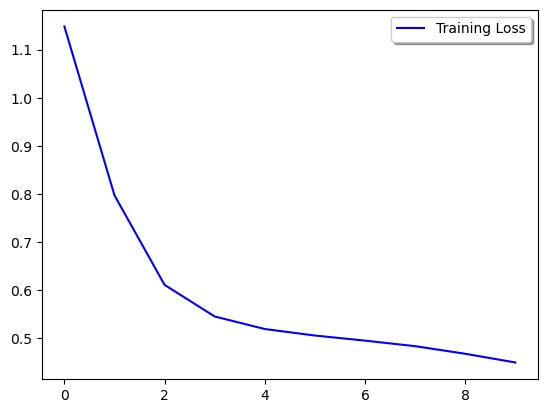

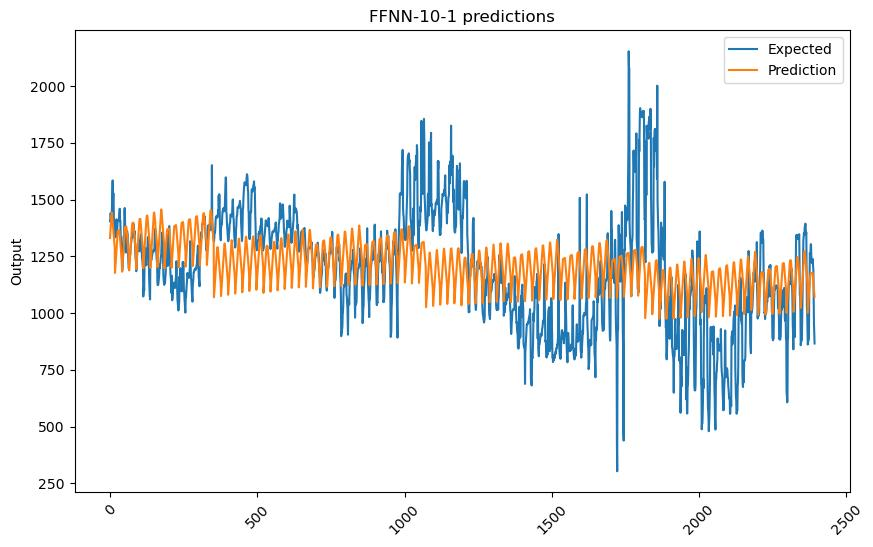

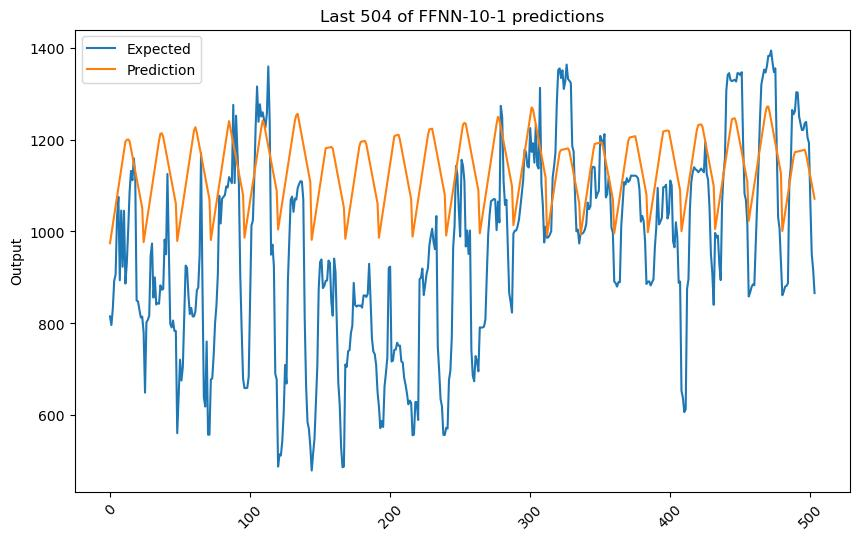

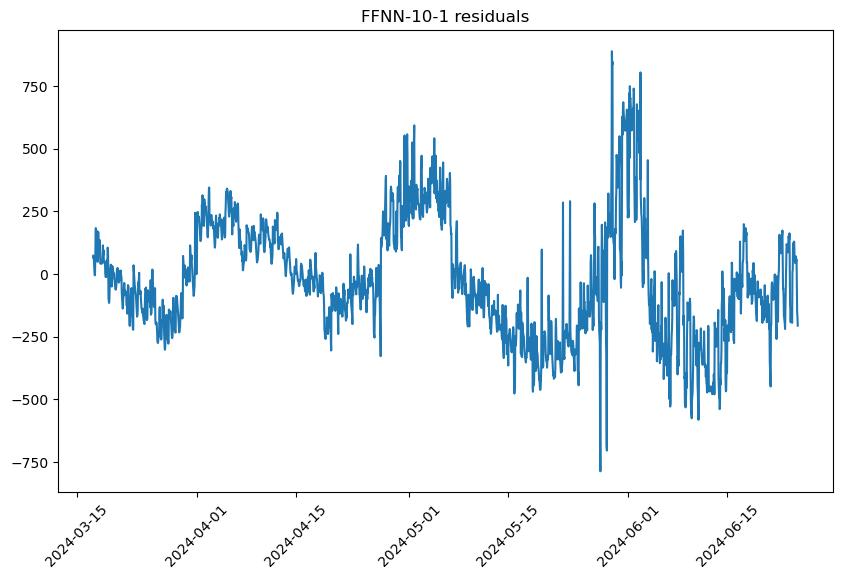

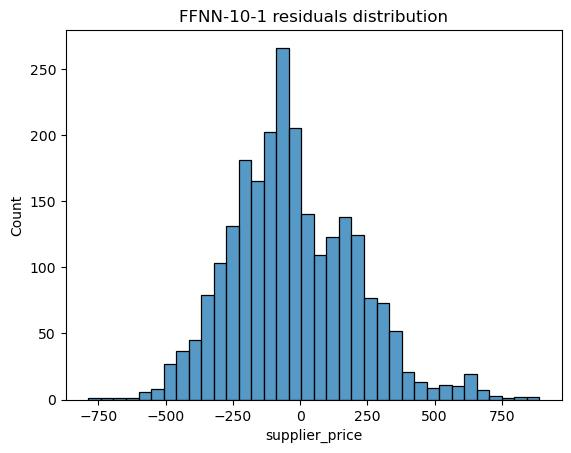

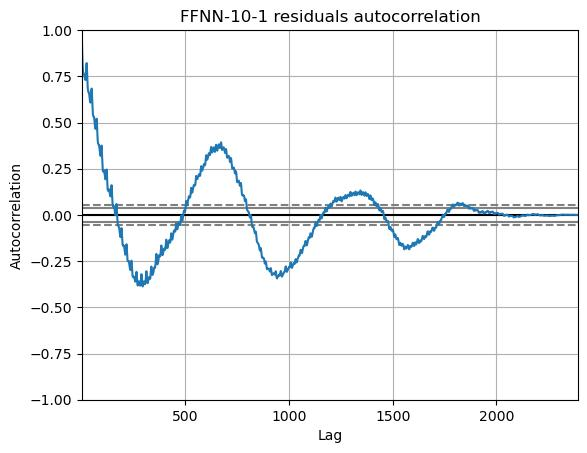

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
90.91466161387196

Jarque-Bera:           NOT Normal
103.66045559687295

Kolmogorov-Smirnov:    NOT Normal
0.05698443428045785

Lilliefors:            NOT Normal
0.05698443428045785

Shapiro-Wilk:          NOT Normal
0.9864444732666016

Anderson–Darling:      NOT Normal
7.826056117428379

Done!

----------------
FFNN-10-5-1 model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


<Figure size 700x600 with 0 Axes>

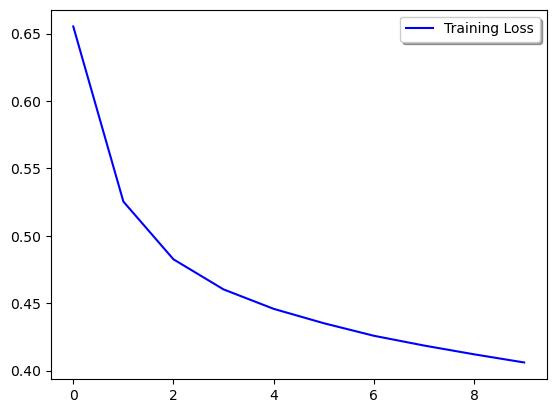

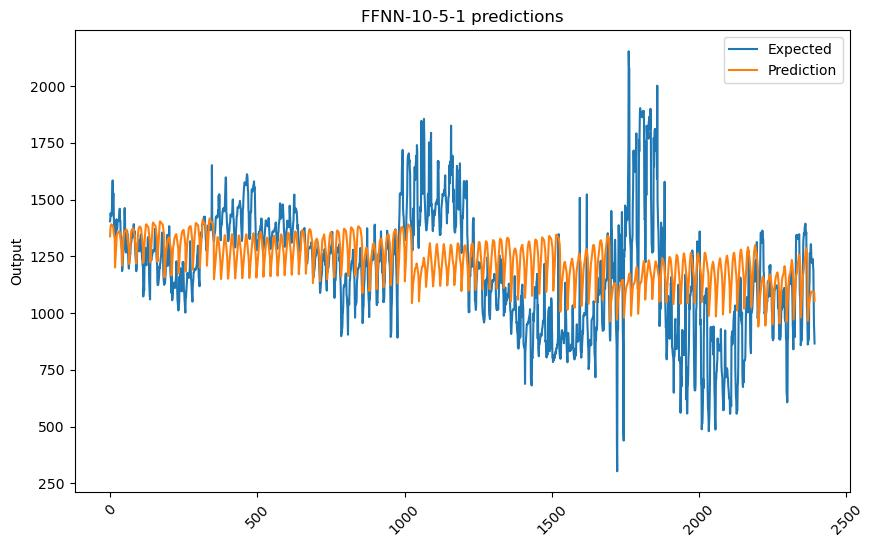

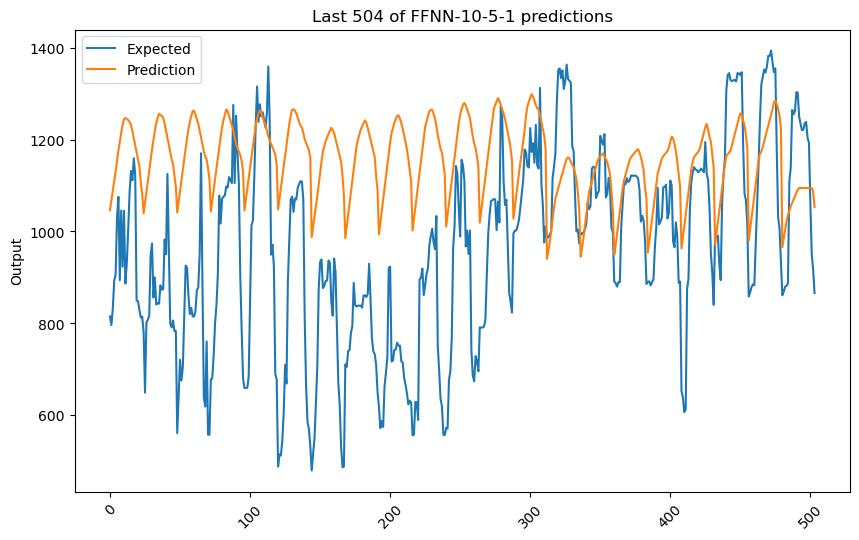

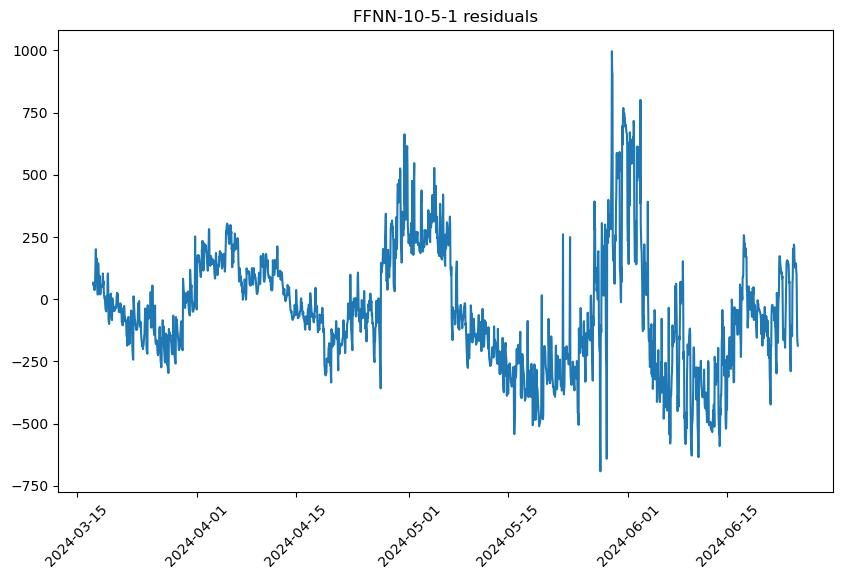

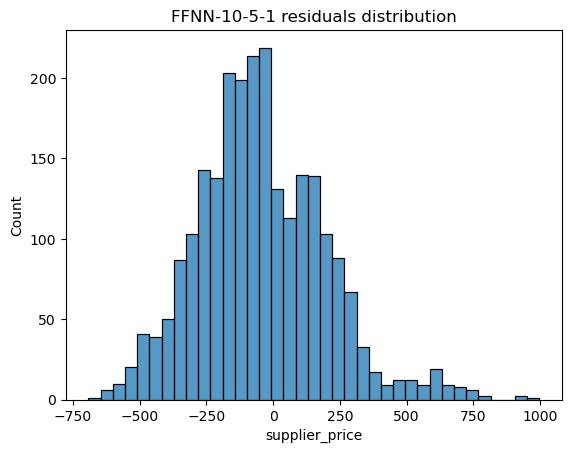

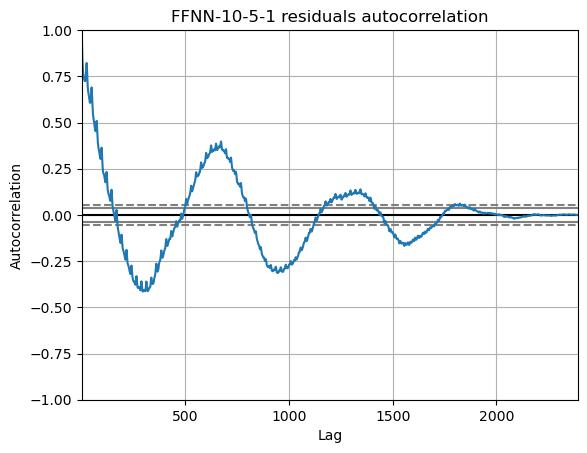

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
127.01768086854891

Jarque-Bera:           NOT Normal
162.38483229969498

Kolmogorov-Smirnov:    NOT Normal
0.053545902711352844

Lilliefors:            NOT Normal
0.053545902711352844

Shapiro-Wilk:          NOT Normal
0.9832664728164673

Anderson–Darling:      NOT Normal
7.158606784490075

Done!

----------------
FFNN-10-5-2-1 model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


<Figure size 700x600 with 0 Axes>

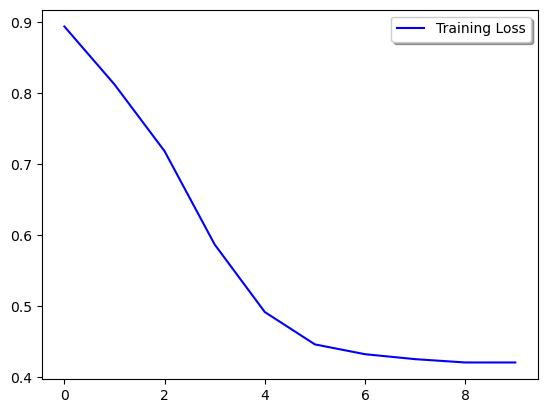

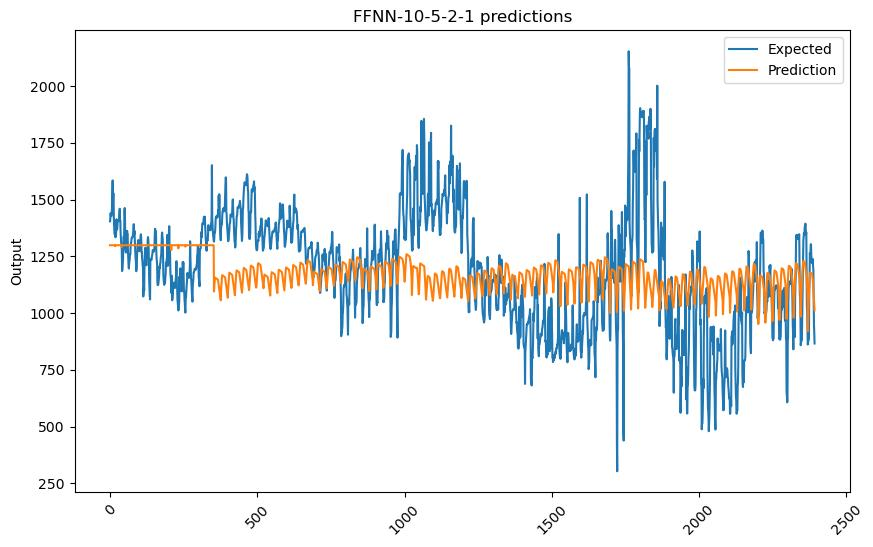

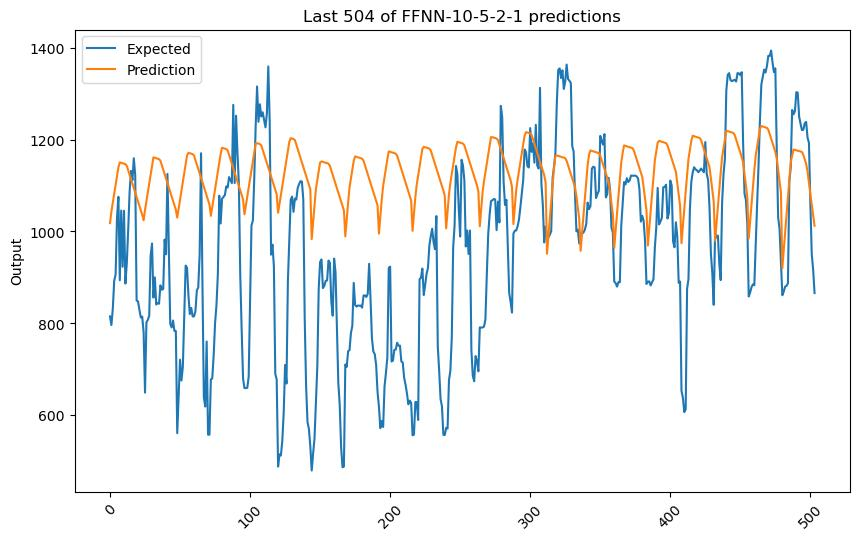

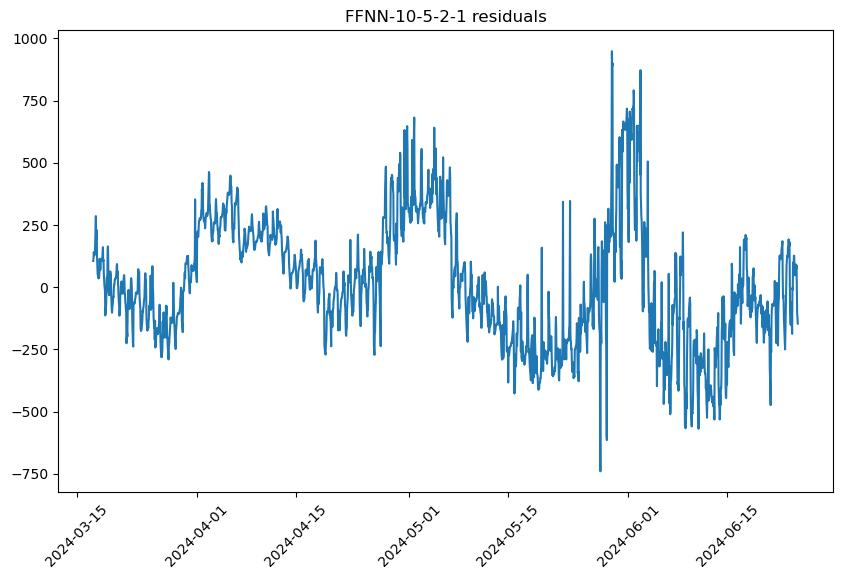

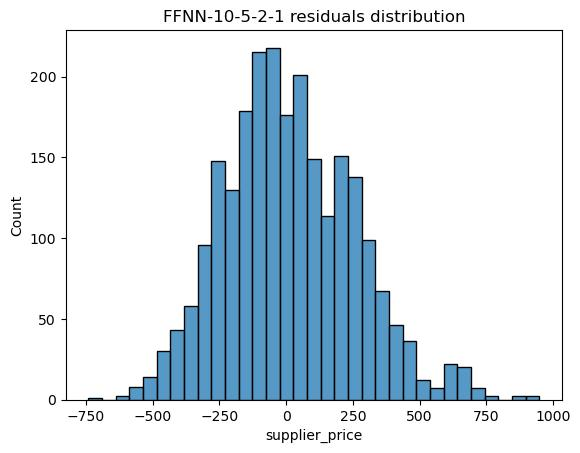

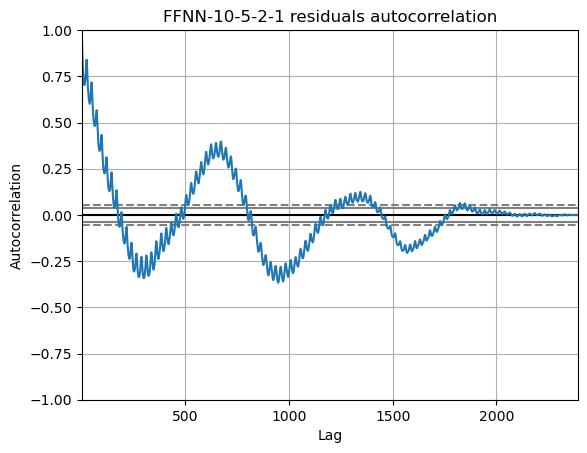

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
46.64376686528691

Jarque-Bera:           NOT Normal
48.910438594873966

Kolmogorov-Smirnov:    NOT Normal
0.03915376539367926

Lilliefors:            NOT Normal
0.03915376539367926

Shapiro-Wilk:          NOT Normal
0.9918445348739624

Anderson–Darling:      NOT Normal
4.445776173785362

Done!

----------------
FFNN-20-10-5-1 model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


<Figure size 700x600 with 0 Axes>

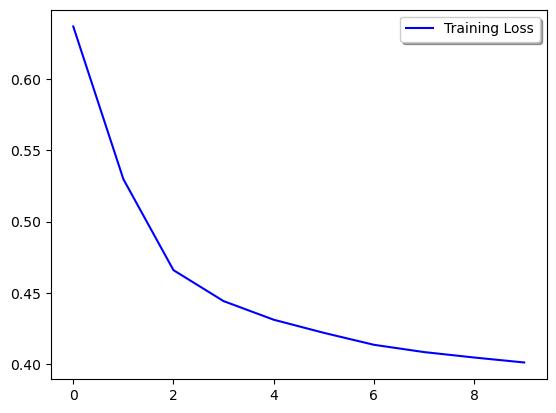

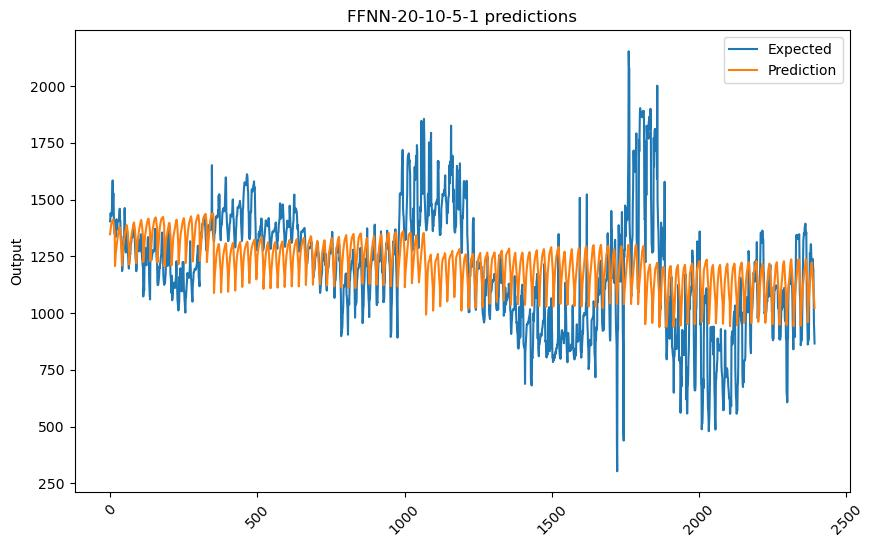

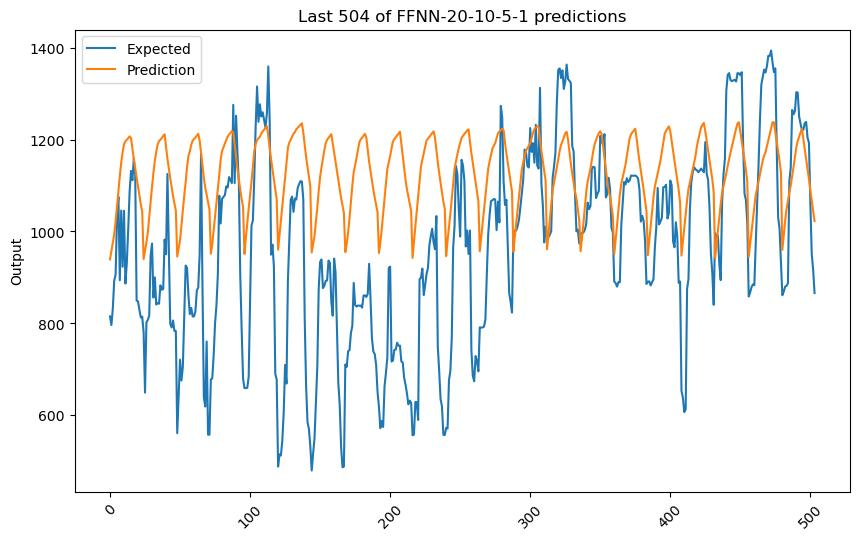

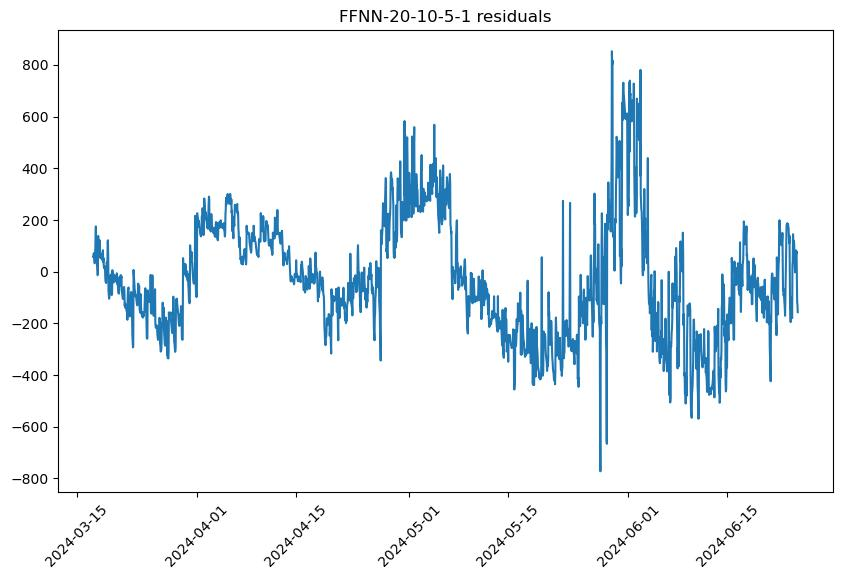

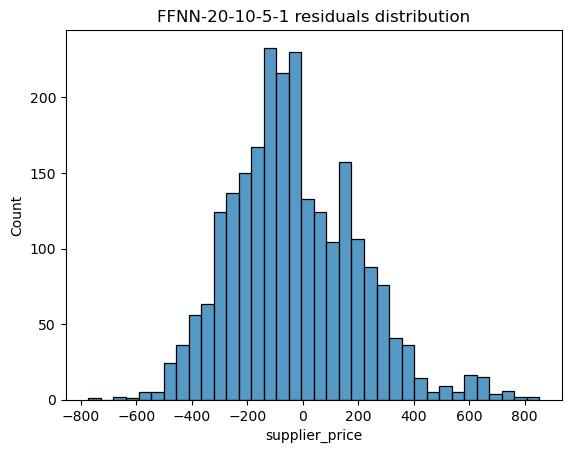

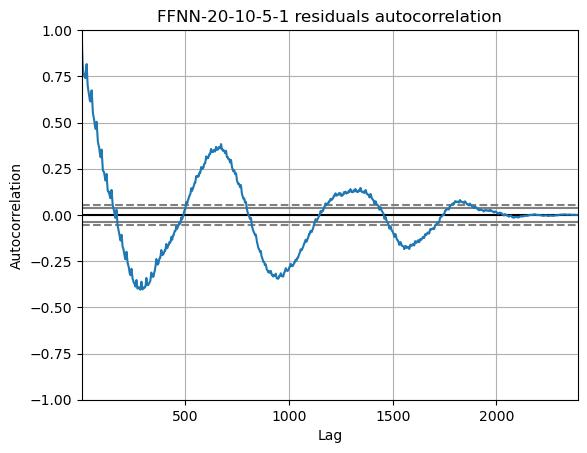

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
116.11676727945013

Jarque-Bera:           NOT Normal
137.9025353757441

Kolmogorov-Smirnov:    NOT Normal
0.06142397152624812

Lilliefors:            NOT Normal
0.06142397152624812

Shapiro-Wilk:          NOT Normal
0.9830705523490906

Anderson–Darling:      NOT Normal
8.641483841780428

Done!

----------------
FFNN-20-10-5-2-1 model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


<Figure size 700x600 with 0 Axes>

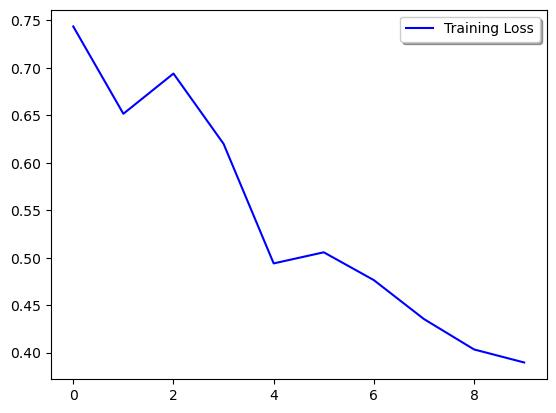

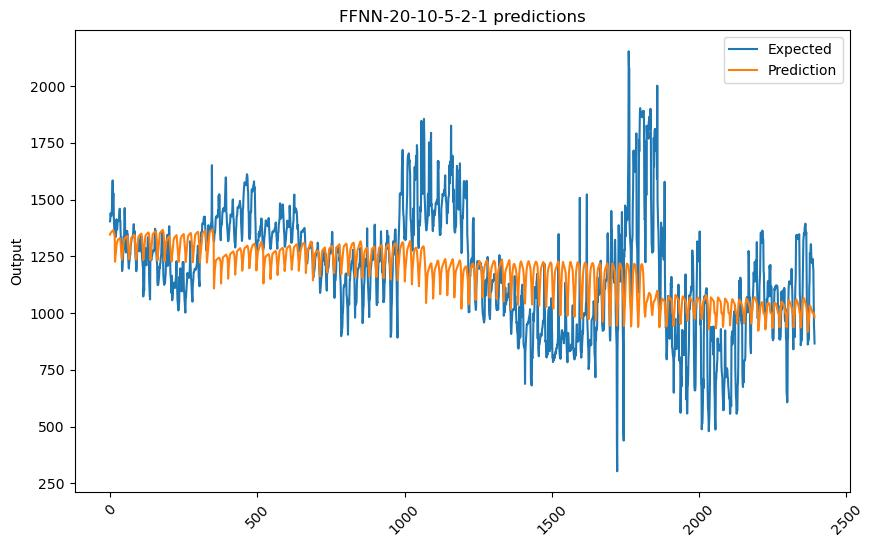

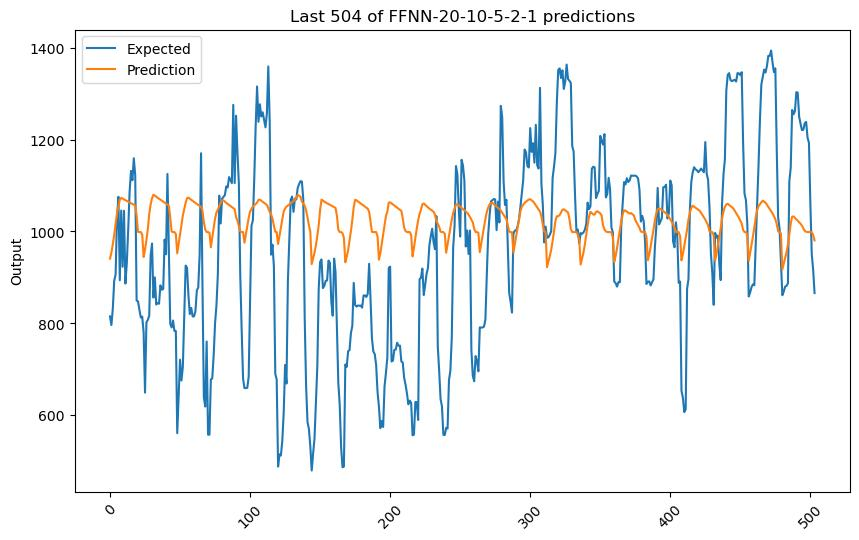

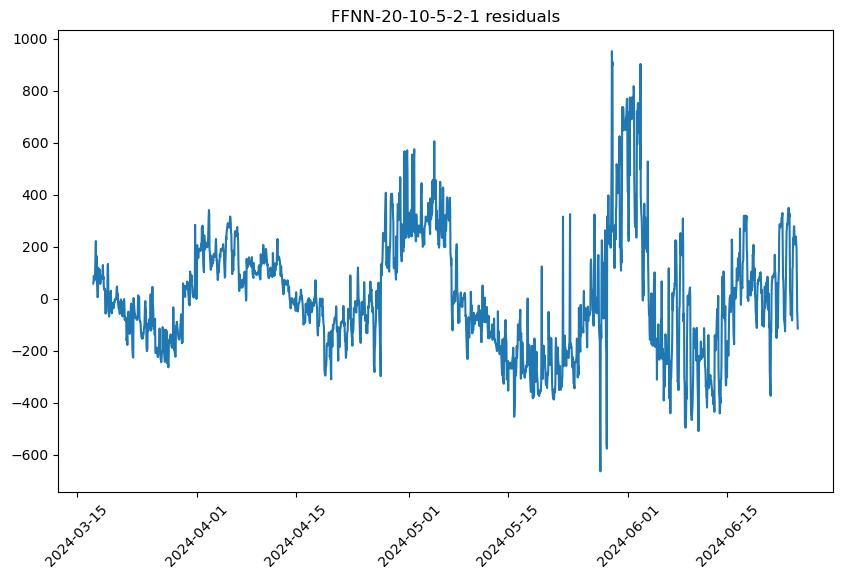

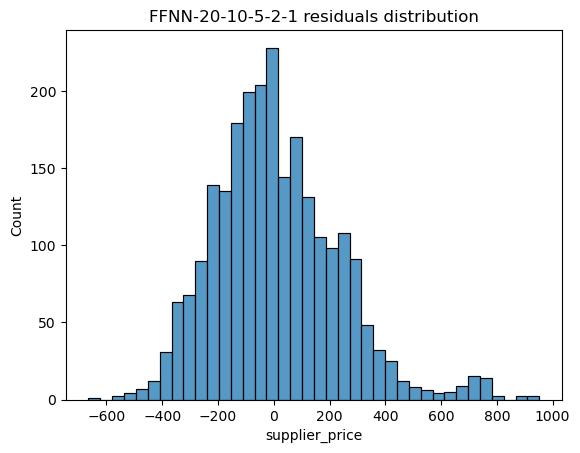

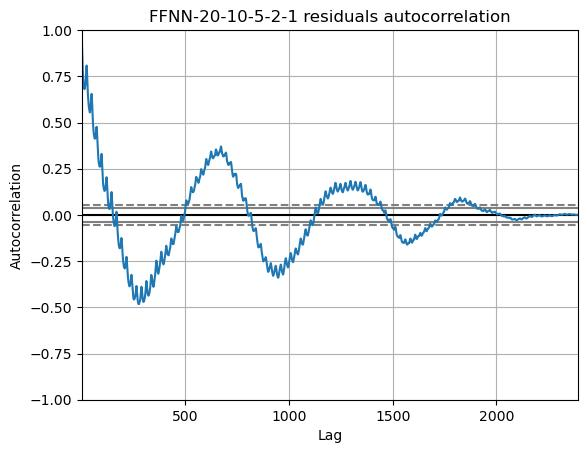

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
212.16544025458978

Jarque-Bera:           NOT Normal
307.70577050956547

Kolmogorov-Smirnov:    NOT Normal
0.05584889812044069

Lilliefors:            NOT Normal
0.05584889812044069

Shapiro-Wilk:          NOT Normal
0.9728494882583618

Anderson–Darling:      NOT Normal
10.641158673258815

Done!



In [17]:
for name, model_function in dl_models:
    print('----------------')
    print(f'{name} model...')
    model_results = {
        'r2' : [],
        'mse' : [],
        'rmse' : [],
        'mae' : [],
        'mape' : [],
        'smape': [],
        'mase' : [],
        'msse' : [],
        'rmsse' : []
    }
    fold_num = 1
    timeFold = TimeSeriesSplit(n_splits = NUM_OF_SPLITS)
    for train_range, test_range in timeFold.split(df_train):
        print(f'Fold #{fold_num}...')
        train = df_train.iloc[train_range]
        test = df_train.iloc[test_range]
        scaler = StandardScaler()
        train_scaled = scaler.fit_transform(train)
        train_scaled = pd.DataFrame(train_scaled, columns = train.columns, index = train.index)
        test_scaled = scaler.transform(test)
        test_scaled = pd.DataFrame(test_scaled, columns = test.columns, index = test.index)
        x_train, y_train = train_scaled.drop(columns = TARGET_COLUMN), train_scaled[[TARGET_COLUMN]]
        x_test, y_test = test_scaled.drop(columns = TARGET_COLUMN), test_scaled[[TARGET_COLUMN]]
        model = model_function(INPUT_SHAPE_FF)
        train_history = model.fit(
            x = x_train,
            y = y_train,
            batch_size = BATCH_SIZE,
            epochs = EPOCHS,
            shuffle = False,
            verbose = 0).history
        y_pred = model.predict(x_test, verbose = 0)
        pred = x_test.copy()
        pred[TARGET_COLUMN] = y_pred
        pred = scaler.inverse_transform(pred)
        pred = pd.DataFrame(pred, columns = test.columns, index = test.index)
        y_pred = pred[TARGET_COLUMN]
        y_test = test[TARGET_COLUMN]
        model_results['r2'].append(r2(y_test, y_pred))
        model_results['mse'].append(mse(y_test, y_pred))
        model_results['rmse'].append(rmse(y_test, y_pred))
        model_results['mae'].append(mae(y_test, y_pred))
        model_results['mape'].append(mape(y_test, y_pred))
        model_results['smape'].append(smape(y_test, y_pred))
        y_train = train[TARGET_COLUMN]
        model_results['mase'].append(mase(y_test, y_pred, y_train, sp = SEASONALITY))
        model_results['msse'].append(msse(y_test, y_pred, y_train, sp = SEASONALITY))
        model_results['rmsse'].append(rmsse(y_test, y_pred, y_train, sp = SEASONALITY))
        if fold_num == NUM_OF_SPLITS:
            show_training_history(train_history, ['loss'], ['Loss'])
            show_regression_chart(y_test, y_pred, f'{name} predictions', sort = False)
            show_regression_chart(
                y_test[-LATEST_PRED_AMOUNT:],
                y_pred[-LATEST_PRED_AMOUNT:],
                f'Last {LATEST_PRED_AMOUNT} of {name} predictions',
                sort = False
            )
            residuals = y_test - y_pred
            show_line_plot(residuals, f'{name} residuals')
            show_histogram(residuals, f'{name} residuals distribution')
            show_acf_plot(residuals, f'{name} residuals autocorrelation')
            print('-' * 10)
            print('Statistical test for normality of residuals:')
            print('-' * 10)
            print()
            run_tests_for_normality(residuals)
        fold_num += 1
    names.append(name)
    for model_result_key, model_result_value in model_results.items():
        results[model_result_key].append(model_result_value)
    print('Done!')
    print()

### RNNs

In [18]:
from keras.layers import GRU, LSTM

In [19]:
def get_gru_1(input_shape):
    model = Sequential(
        [
            Input(shape = input_shape),
            GRU(10, return_sequences = True),
            GRU(5, return_sequences = True),
            GRU(2),
            Dense(1)
        ])
    model.compile(loss = 'mean_squared_error', optimizer = 'adam')
    return model

def get_gru_2(input_shape):
    model = Sequential(
        [
            Input(shape = input_shape),
            GRU(20, return_sequences = True),
            GRU(10, return_sequences = True),
            GRU(5),
            Dense(1)
        ])
    model.compile(loss = 'mean_squared_error', optimizer = 'adam')
    return model

def get_gru_3(input_shape):
    model = Sequential(
        [
            Input(shape = input_shape),
            GRU(20, return_sequences = True),
            GRU(10, return_sequences = True),
            GRU(5, return_sequences = True),
            GRU(2),
            Dense(1)
        ])
    model.compile(loss = 'mean_squared_error', optimizer = 'adam')
    return model

def get_gru_4(input_shape):
    model = Sequential(
        [
            Input(shape = input_shape),
            GRU(10),
            Dense(1)
        ])
    model.compile(loss = 'mean_squared_error', optimizer = 'adam')
    return model

def get_gru_5(input_shape):
    model = Sequential(
        [
            Input(shape = input_shape),
            GRU(10, return_sequences = True),
            GRU(5),
            Dense(1)
        ])
    model.compile(loss = 'mean_squared_error', optimizer = 'adam')
    return model

In [20]:
def get_lstm_1(input_shape):
    model = Sequential(
        [
            Input(shape = input_shape),
            LSTM(10, return_sequences = True),
            LSTM(5, return_sequences = True),
            LSTM(2),
            Dense(1)
        ])
    model.compile(loss = 'mean_squared_error', optimizer = 'adam')
    return model

def get_lstm_2(input_shape):
    model = Sequential(
        [
            Input(shape = input_shape),
            LSTM(20, return_sequences = True),
            LSTM(10, return_sequences = True),
            LSTM(5),
            Dense(1)
        ])
    model.compile(loss = 'mean_squared_error', optimizer = 'adam')
    return model

def get_lstm_3(input_shape):
    model = Sequential(
        [
            Input(shape = input_shape),
            LSTM(20, return_sequences = True),
            LSTM(10, return_sequences = True),
            LSTM(5, return_sequences = True),
            LSTM(2),
            Dense(1)
        ])
    model.compile(loss = 'mean_squared_error', optimizer = 'adam')
    return model

def get_lstm_4(input_shape):
    model = Sequential(
        [
            Input(shape = input_shape),
            LSTM(10),
            Dense(1)
        ])
    model.compile(loss = 'mean_squared_error', optimizer = 'adam')
    return model

def get_lstm_5(input_shape):
    model = Sequential(
        [
            Input(shape = input_shape),
            LSTM(10, return_sequences = True),
            LSTM(5),
            Dense(1)
        ])
    model.compile(loss = 'mean_squared_error', optimizer = 'adam')
    return model

In [21]:
def create_dataset(df, target_column_name, look_back = 1):
    target_column_position = df.columns.get_loc(target_column_name)
    dataX, dataY = [], []
    for i in range(len(df) - look_back - 1):
        x_slice = df.iloc[i:(i + look_back)]
        x_slice = x_slice.drop(x_slice.columns[target_column_position], axis = 1)
        dataX.append(x_slice)
        dataY.append(df.iloc[i + look_back, target_column_position])
    dataX = np.array(dataX)
    dataY = np.array(dataY)
    return np.reshape(dataX, (dataX.shape[0], dataX.shape[1], df.shape[-1] - 1)), dataY

In [22]:
df_train = df_sup.copy()

# use 1 week of measurements for recurrent NNs to look back
LOOK_BACK = 24 * 7 

BATCH_SIZE = 32
EPOCHS = 10
NUM_OF_VARIABLES = df_train.shape[-1] - 1
INPUT_SHAPE_RECCURENT =  (LOOK_BACK, NUM_OF_VARIABLES,)

In [24]:
rnn_models = []
rnn_models.append(('GRU-10-1', get_gru_4))
rnn_models.append(('GRU-10-5-1', get_gru_5))
rnn_models.append(('GRU-10-5-2-1', get_gru_1))
rnn_models.append(('GRU-20-10-5-1', get_gru_2))
rnn_models.append(('GRU-20-10-5-2-1', get_gru_3))
rnn_models.append(('LSTM-10-1', get_lstm_4))
rnn_models.append(('LSTM-10-5-1', get_lstm_5))
rnn_models.append(('LSTM-10-5-2-1', get_lstm_1))
rnn_models.append(('LSTM-20-10-5-1', get_lstm_2))
rnn_models.append(('LSTM-20-10-5-2-1', get_lstm_3))

----------------
GRU-10-1 model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


<Figure size 700x600 with 0 Axes>

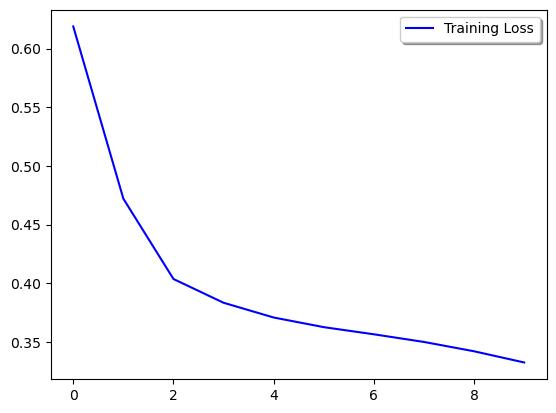

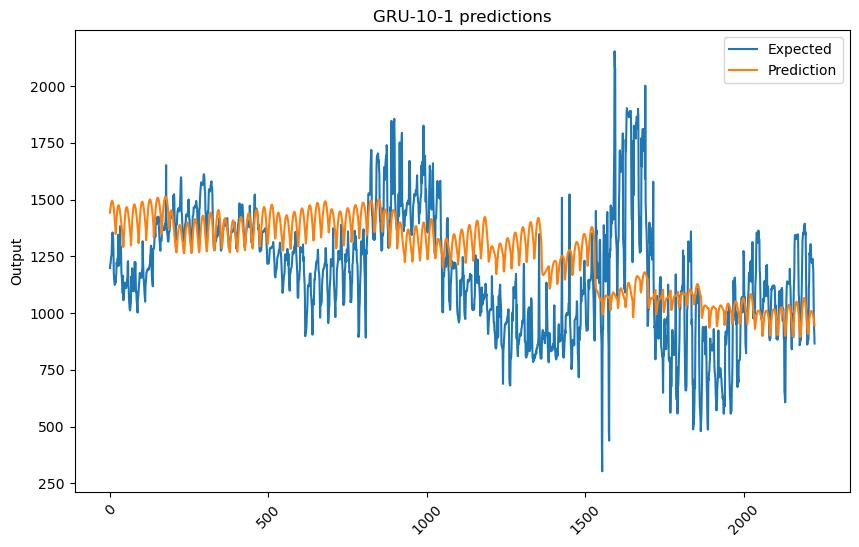

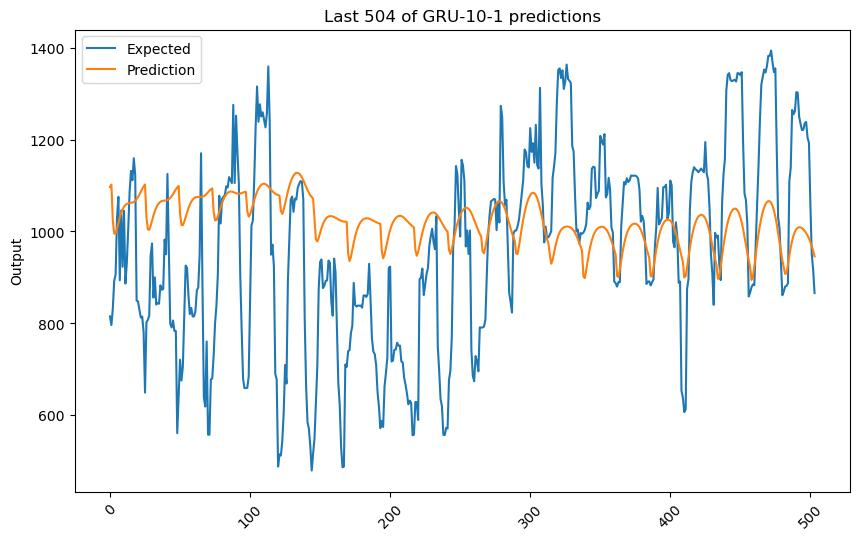

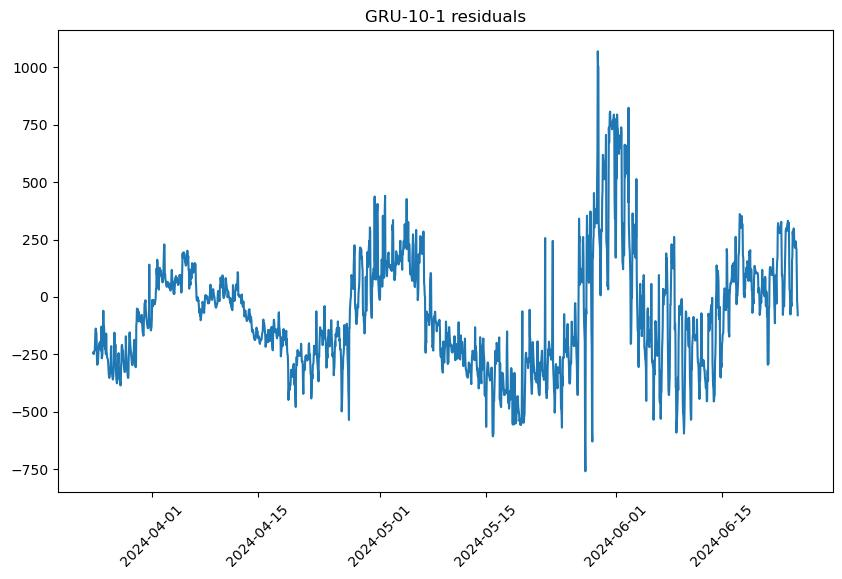

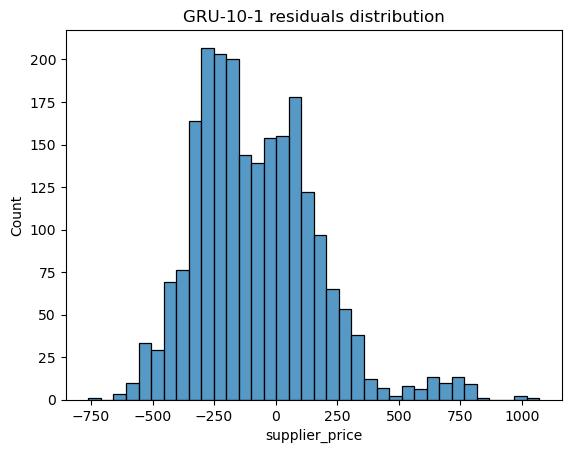

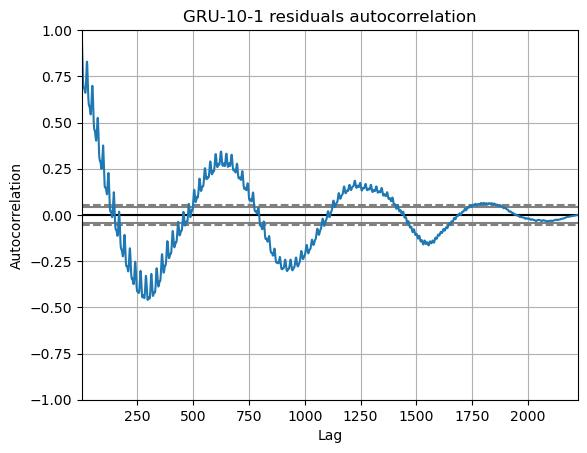

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
246.7709666922031

Jarque-Bera:           NOT Normal
384.384385334036

Kolmogorov-Smirnov:    NOT Normal
0.06235099008874312

Lilliefors:            NOT Normal
0.06235099008874312

Shapiro-Wilk:          NOT Normal
0.9635190963745117

Anderson–Darling:      NOT Normal
14.17129083498503

Done!

----------------
GRU-10-5-1 model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


<Figure size 700x600 with 0 Axes>

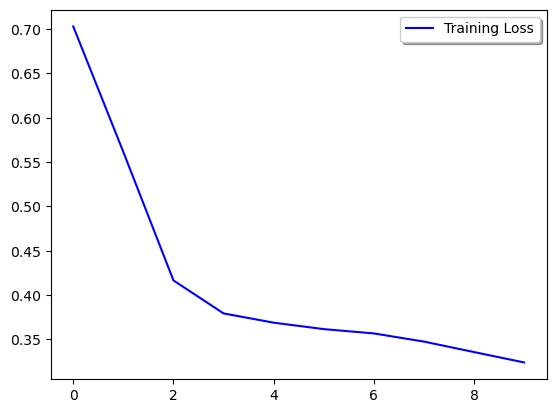

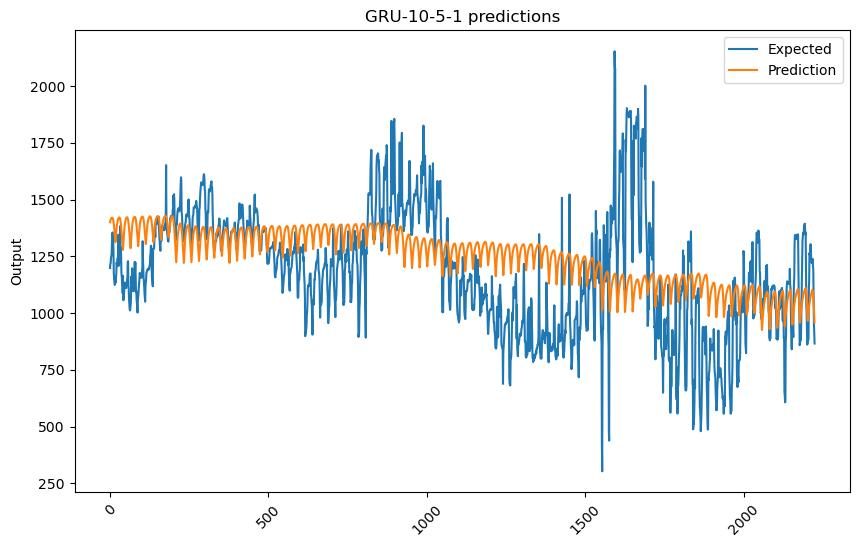

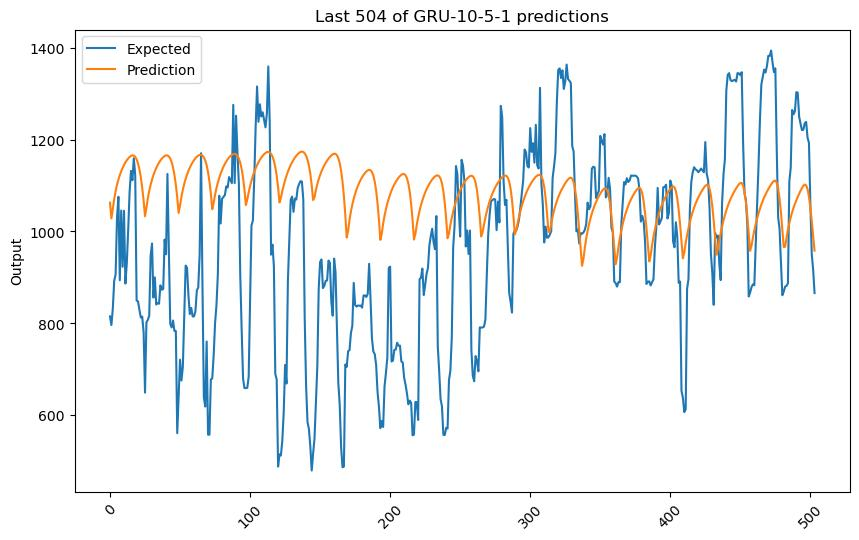

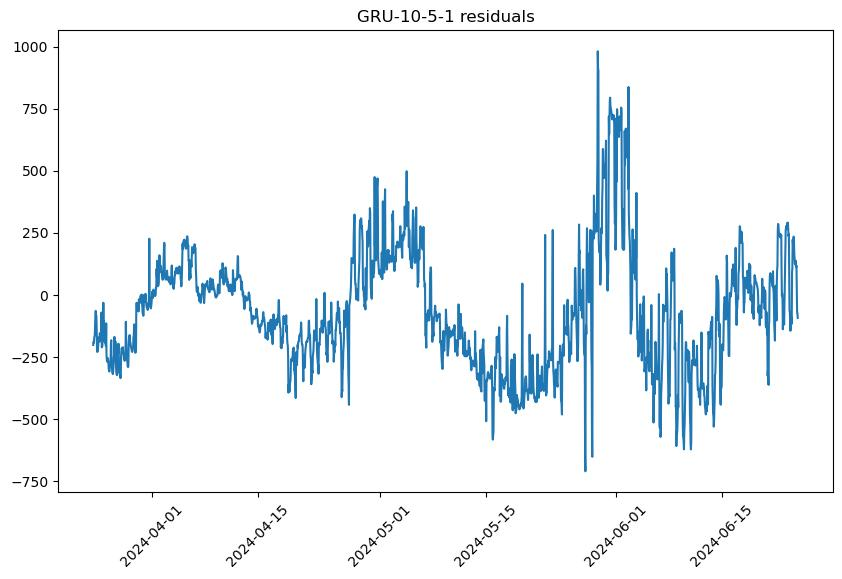

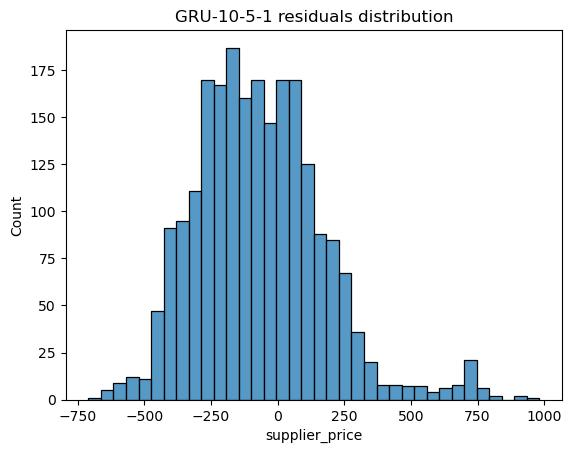

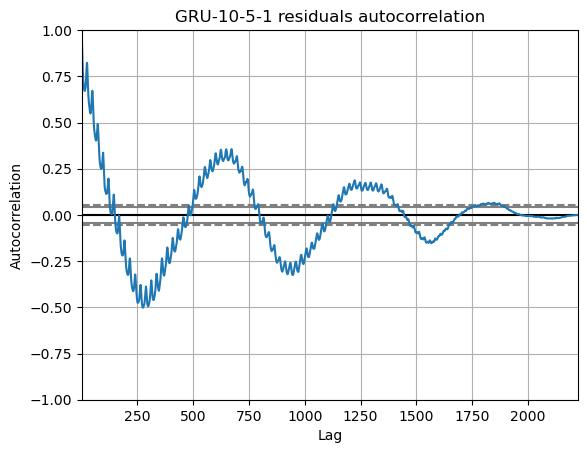

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
223.09053859190269

Jarque-Bera:           NOT Normal
348.36047968000685

Kolmogorov-Smirnov:    NOT Normal
0.03505847475678869

Lilliefors:            NOT Normal
0.03505847475678869

Shapiro-Wilk:          NOT Normal
0.9686306118965149

Anderson–Darling:      NOT Normal
9.456159211806607

Done!

----------------
GRU-10-5-2-1 model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


<Figure size 700x600 with 0 Axes>

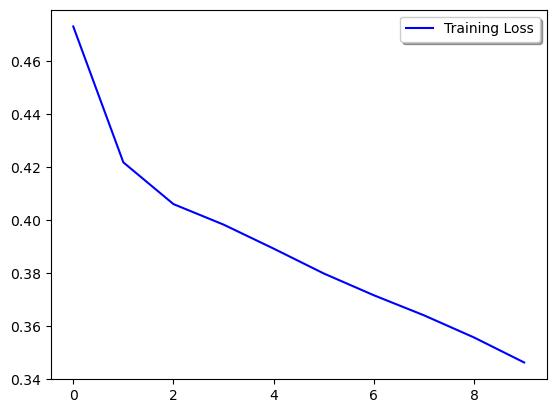

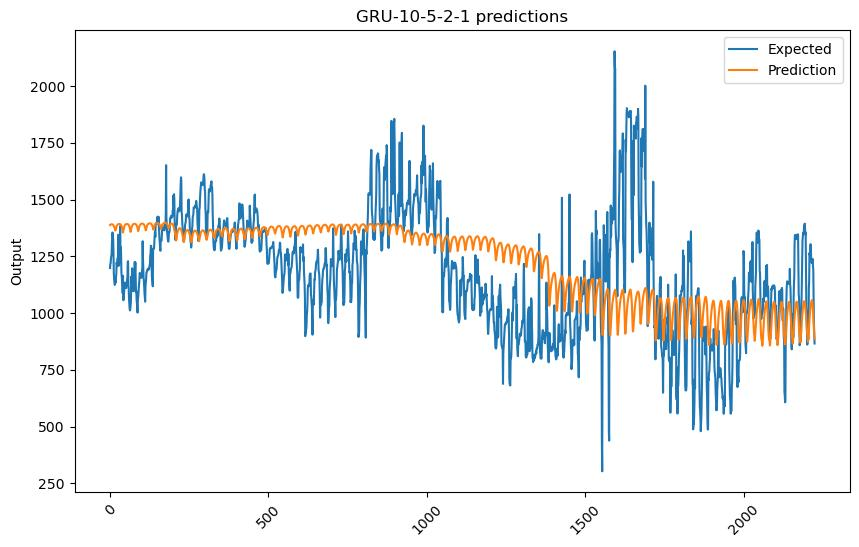

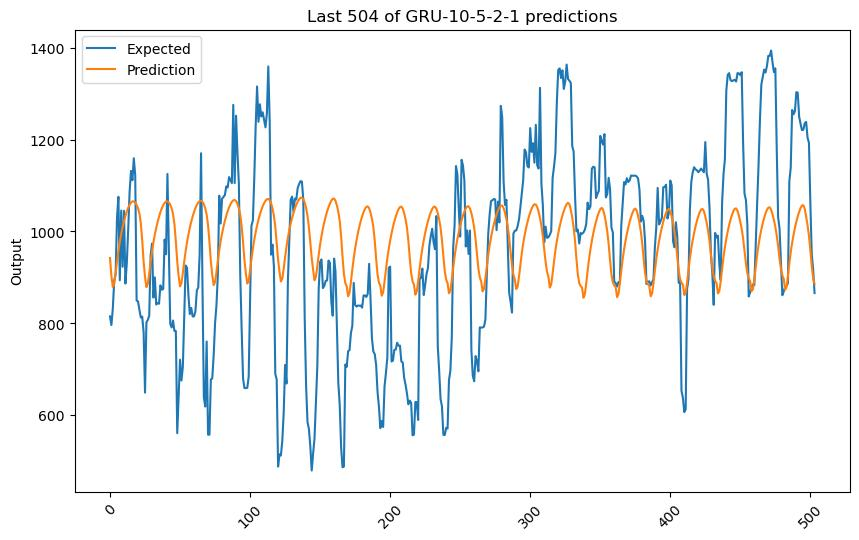

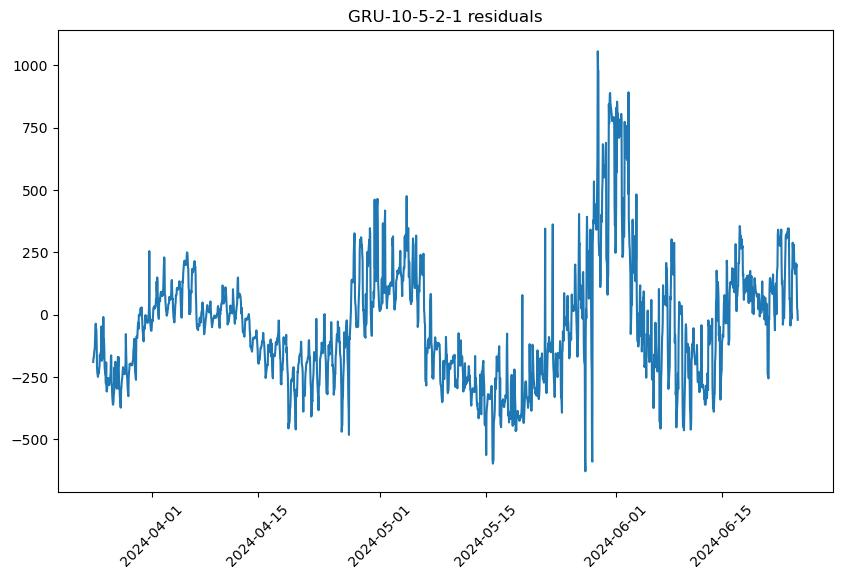

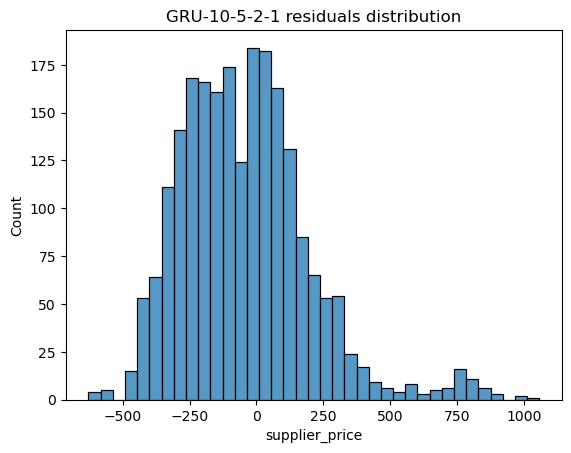

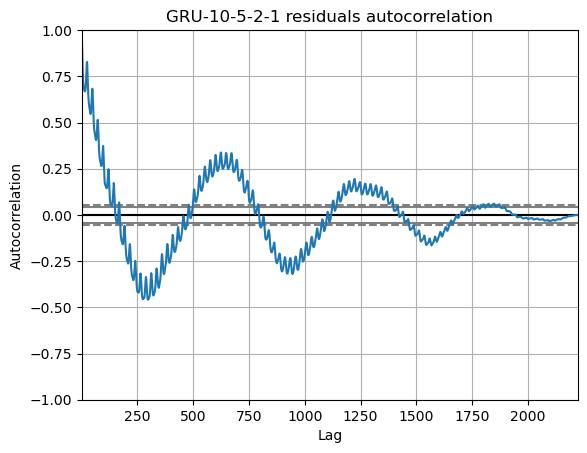

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
356.86089297096413

Jarque-Bera:           NOT Normal
688.4206582049081

Kolmogorov-Smirnov:    NOT Normal
0.04895760703630281

Lilliefors:            NOT Normal
0.04895760703630281

Shapiro-Wilk:          NOT Normal
0.9490619897842407

Anderson–Darling:      NOT Normal
16.904864195438677

Done!

----------------
GRU-20-10-5-1 model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


<Figure size 700x600 with 0 Axes>

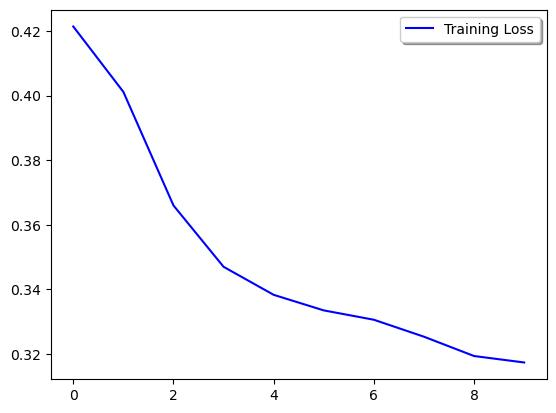

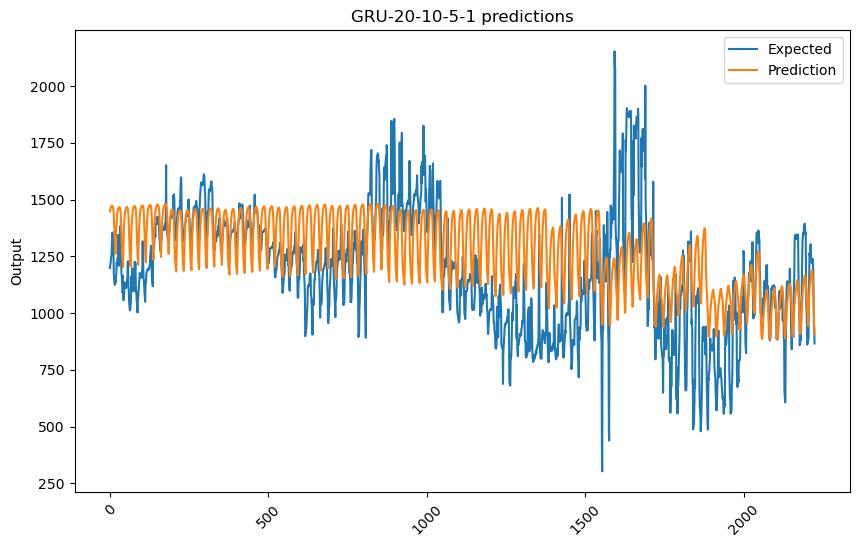

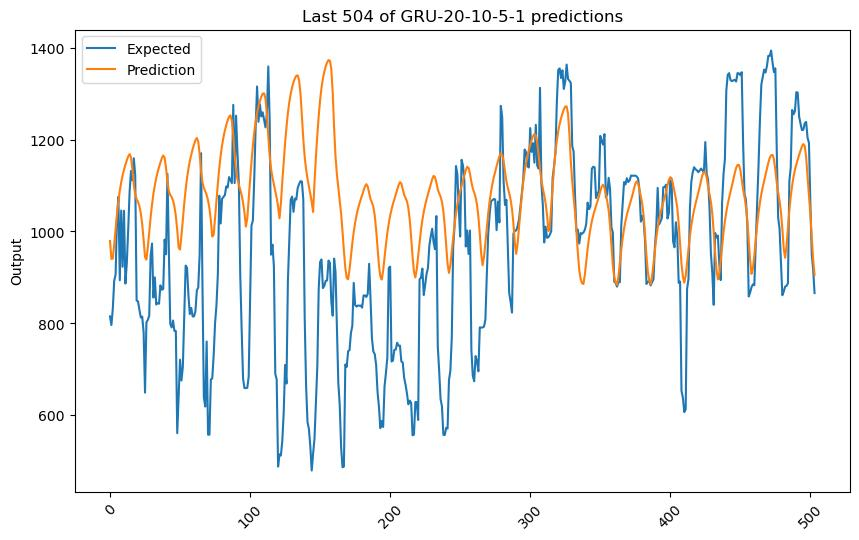

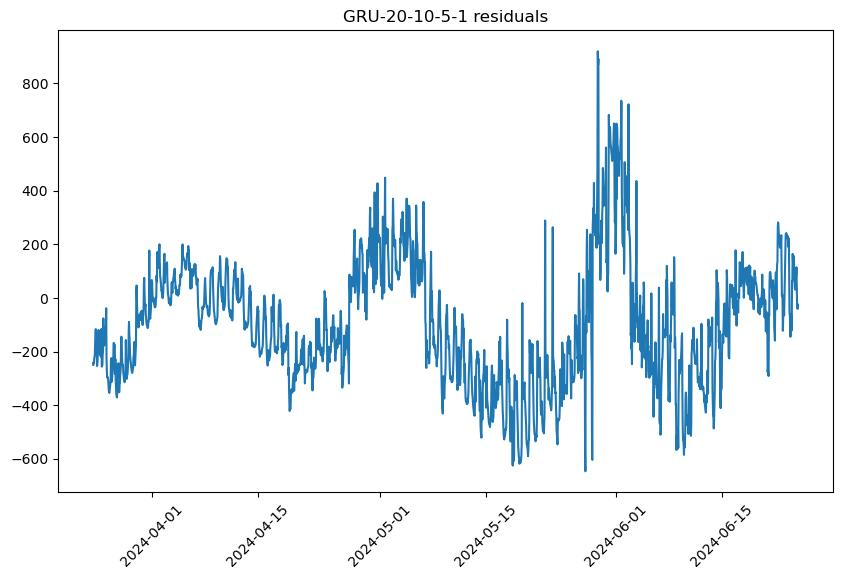

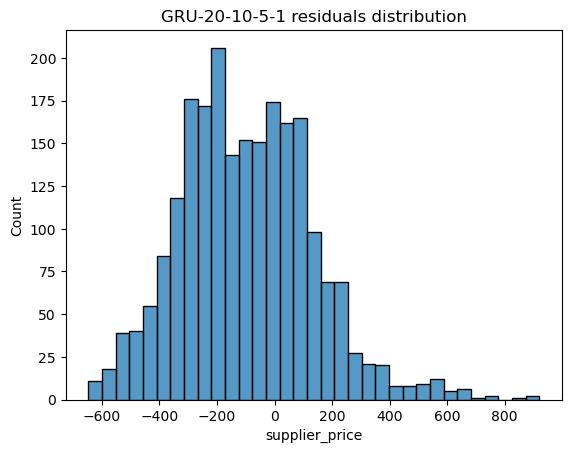

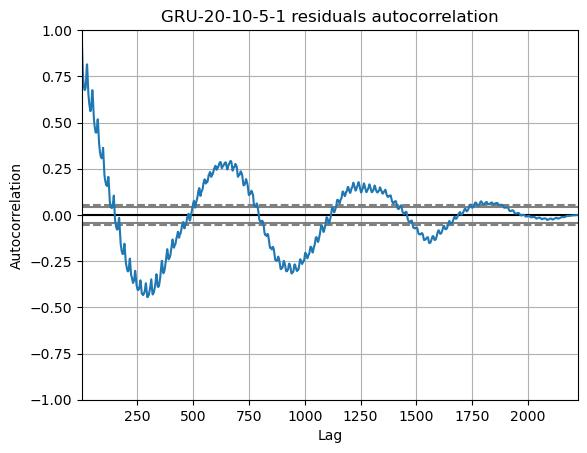

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
91.2581068032032

Jarque-Bera:           NOT Normal
108.98640815827977

Kolmogorov-Smirnov:    NOT Normal
0.042784018890314635

Lilliefors:            NOT Normal
0.042784018890314635

Shapiro-Wilk:          NOT Normal
0.9859175086021423

Anderson–Darling:      NOT Normal
4.472388385506292

Done!

----------------
GRU-20-10-5-2-1 model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


<Figure size 700x600 with 0 Axes>

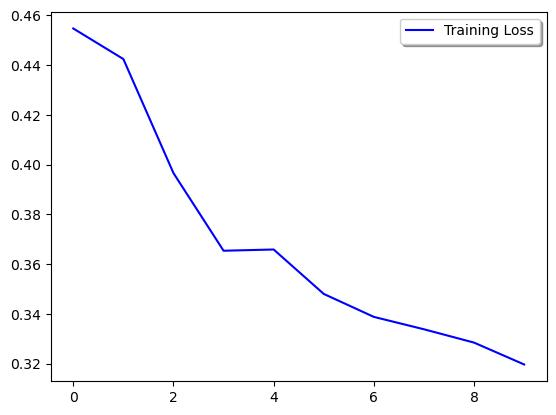

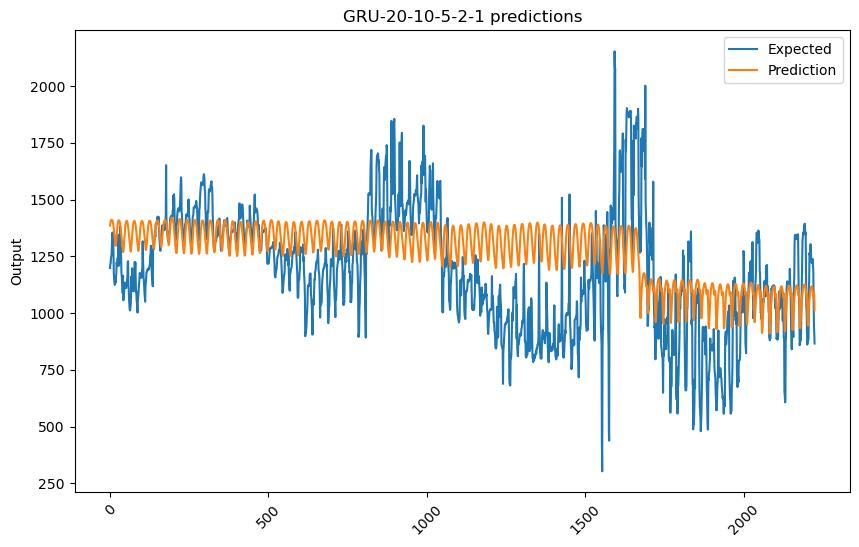

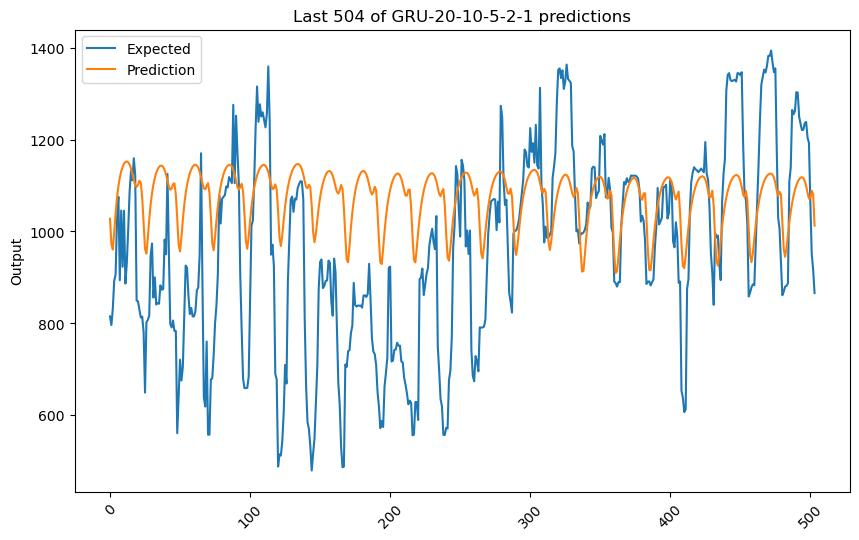

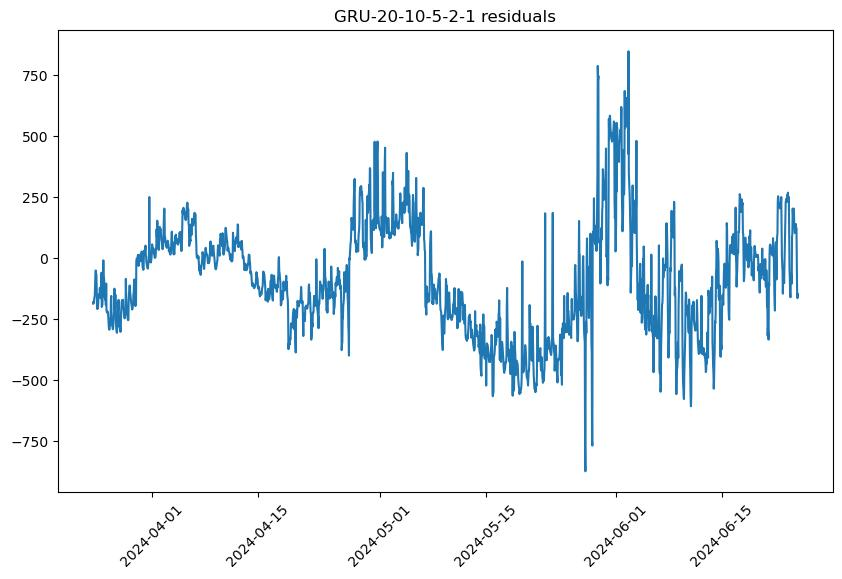

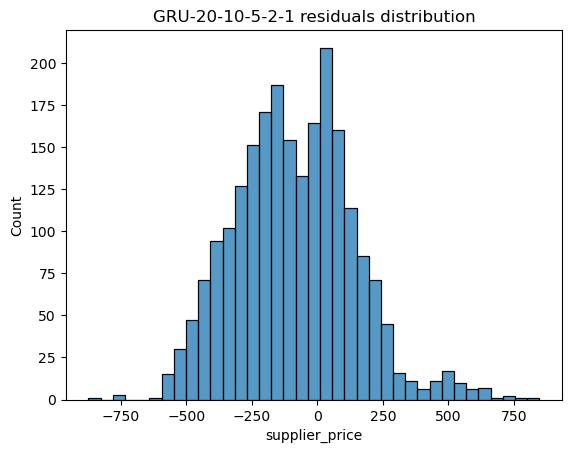

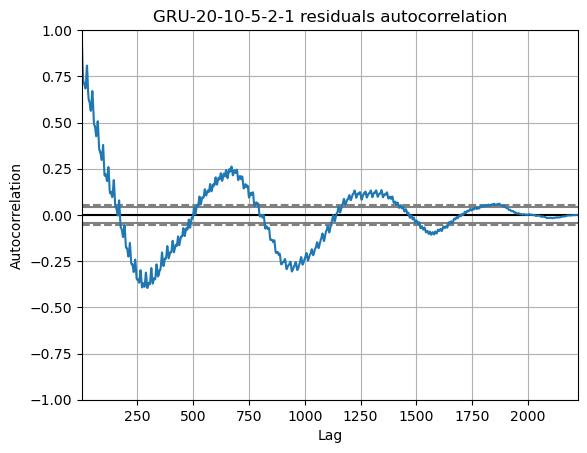

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
53.020216106032166

Jarque-Bera:           NOT Normal
59.58681829633874

Kolmogorov-Smirnov:    NOT Normal
0.02593107813588369

Lilliefors:            NOT Normal
0.02593107813588369

Shapiro-Wilk:          NOT Normal
0.9891401529312134

Anderson–Darling:      NOT Normal
3.4364195072007533

Done!

----------------
LSTM-10-1 model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


<Figure size 700x600 with 0 Axes>

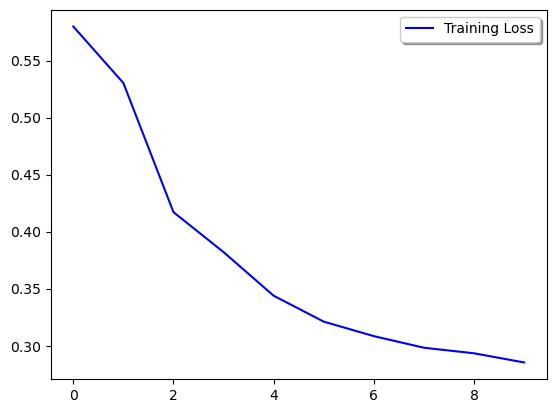

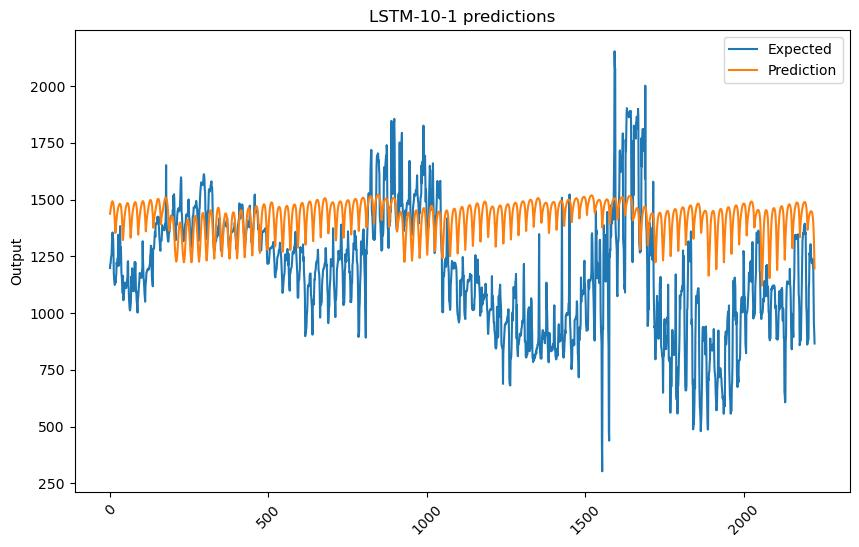

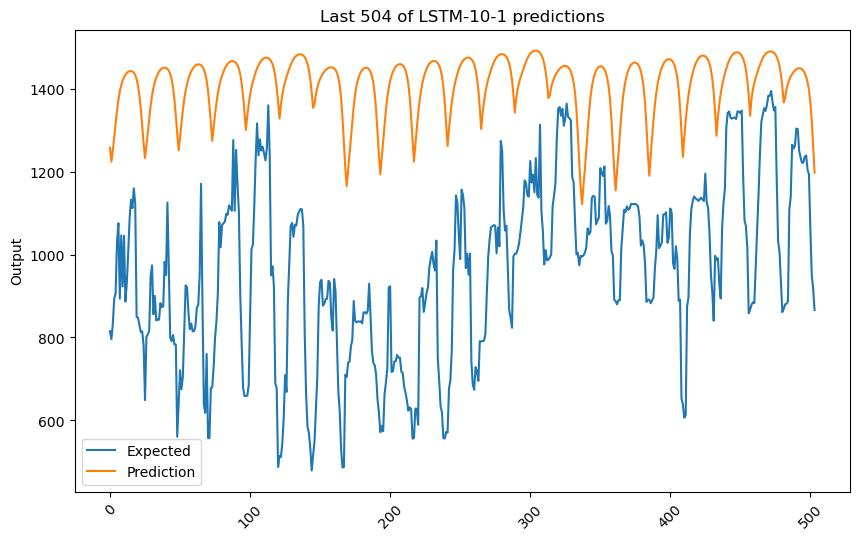

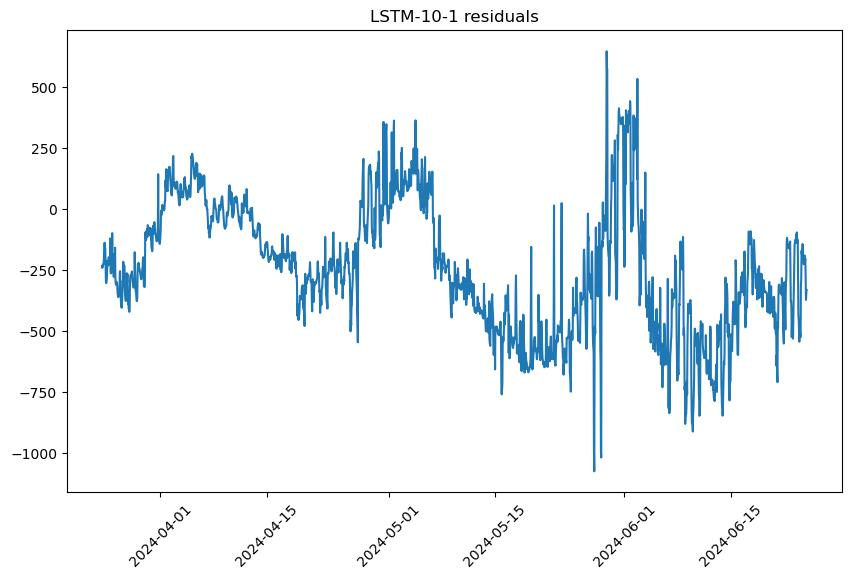

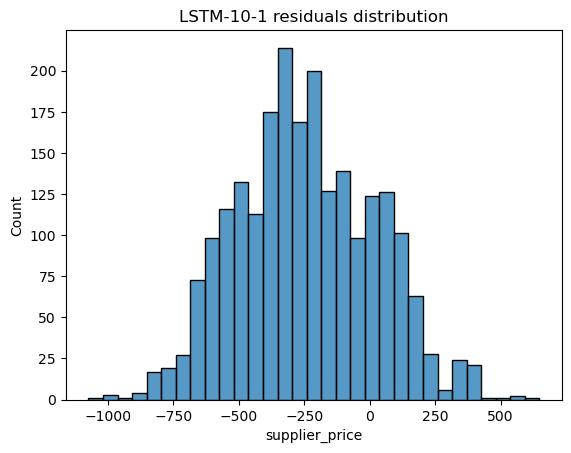

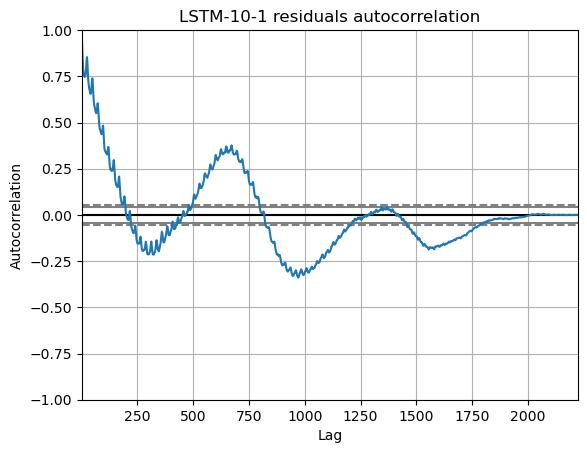

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
20.3940135360161

Jarque-Bera:           NOT Normal
16.267725641600276

Kolmogorov-Smirnov:    NOT Normal
0.030976419223081142

Lilliefors:            NOT Normal
0.030976419223081142

Shapiro-Wilk:          NOT Normal
0.9949193000793457

Anderson–Darling:      NOT Normal
3.651037376952445

Done!

----------------
LSTM-10-5-1 model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


<Figure size 700x600 with 0 Axes>

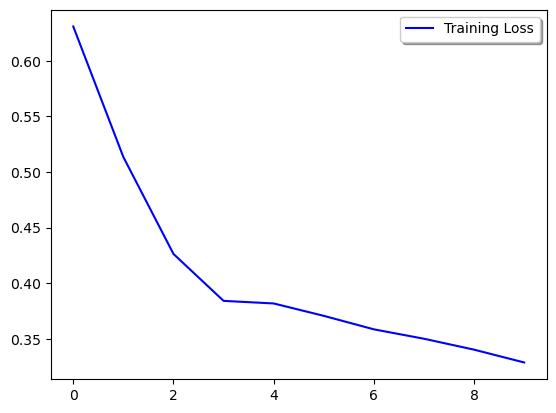

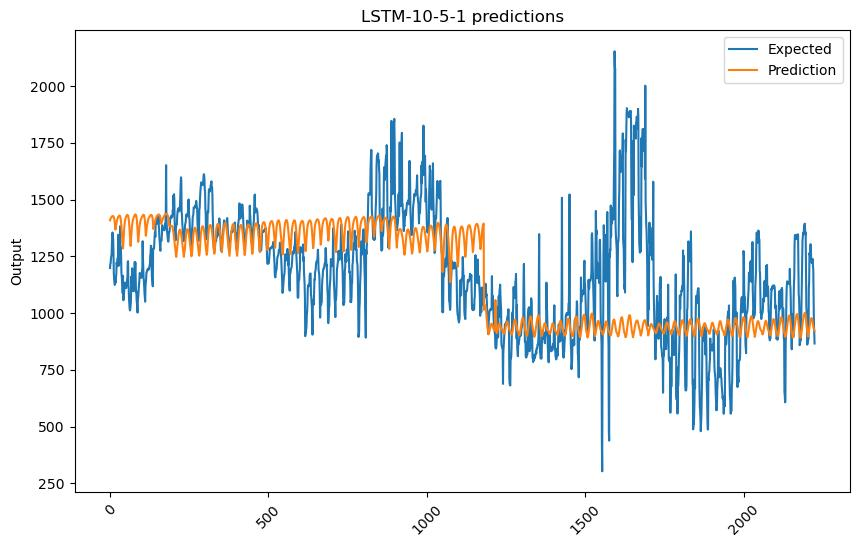

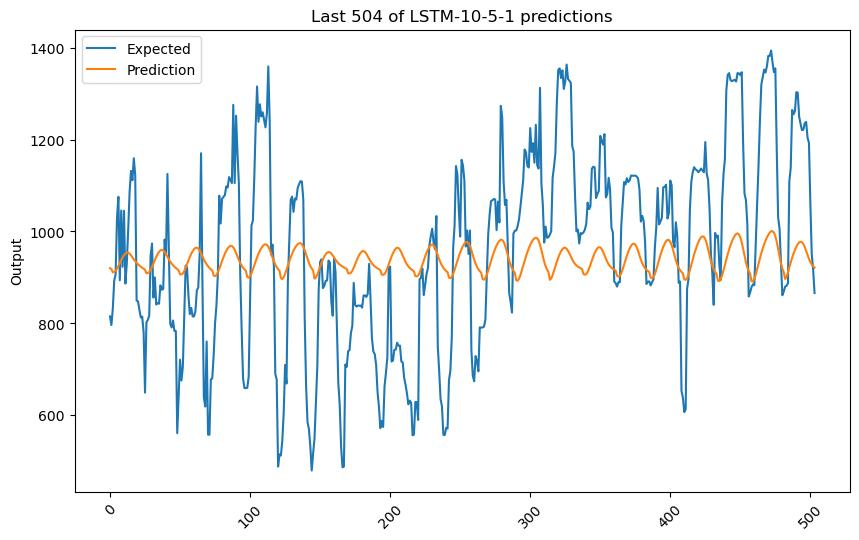

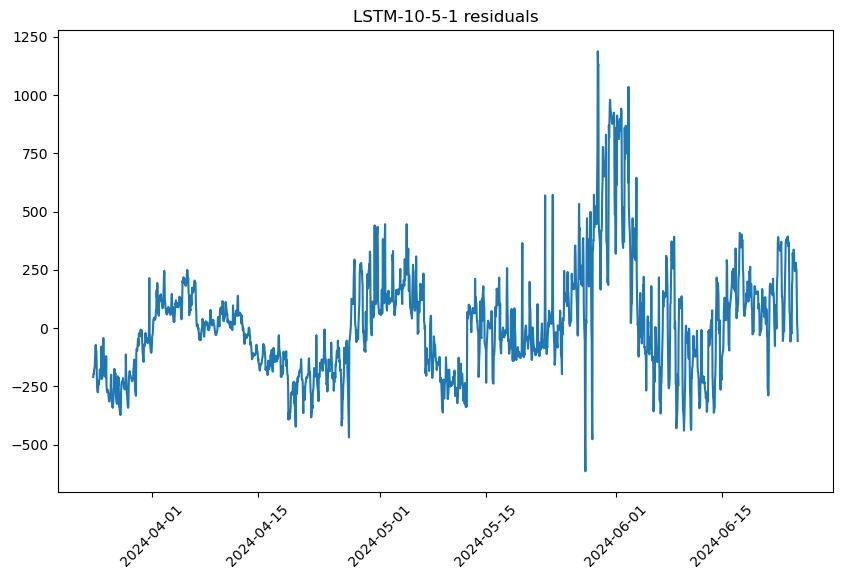

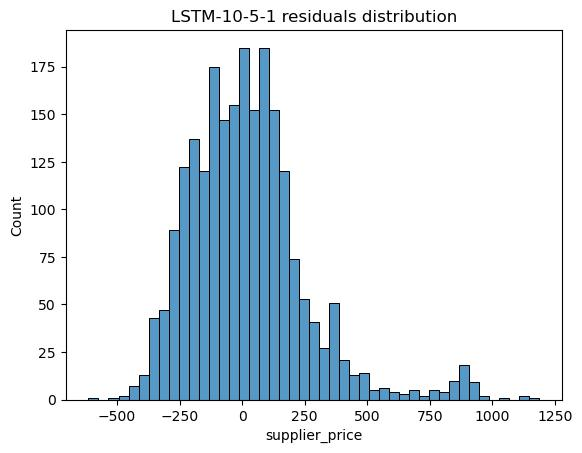

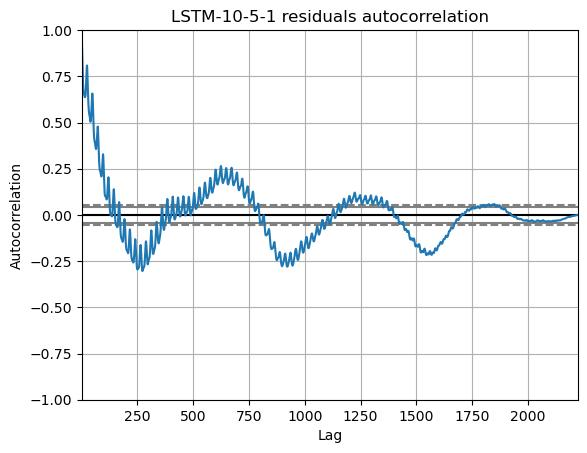

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
533.2565172672561

Jarque-Bera:           NOT Normal
1422.0994357730872

Kolmogorov-Smirnov:    NOT Normal
0.07710937238869386

Lilliefors:            NOT Normal
0.07710937238869386

Shapiro-Wilk:          NOT Normal
0.9236078858375549

Anderson–Darling:      NOT Normal
28.18349466916561

Done!

----------------
LSTM-10-5-2-1 model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


<Figure size 700x600 with 0 Axes>

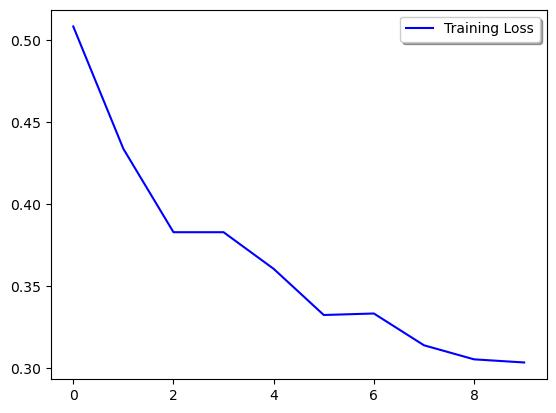

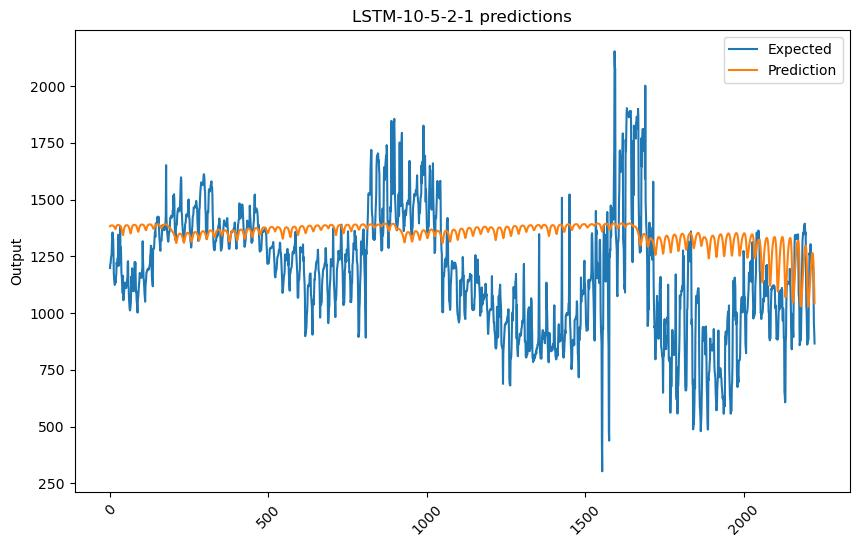

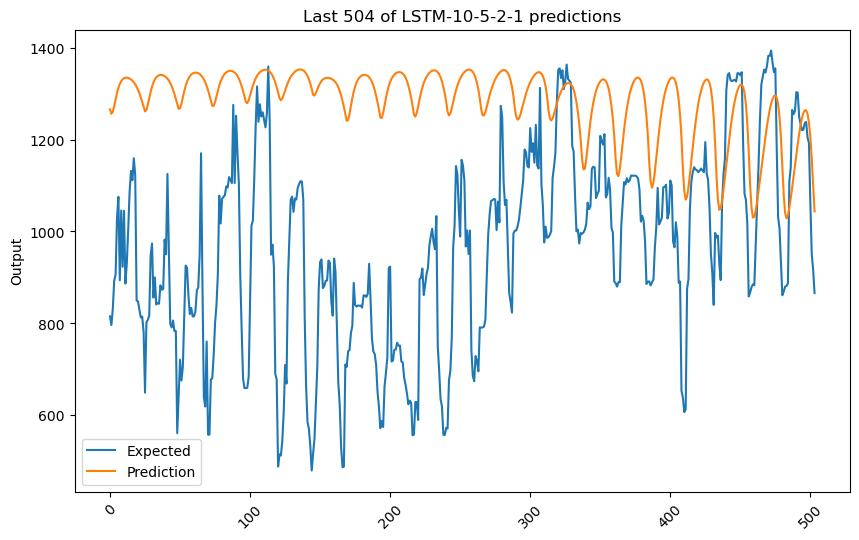

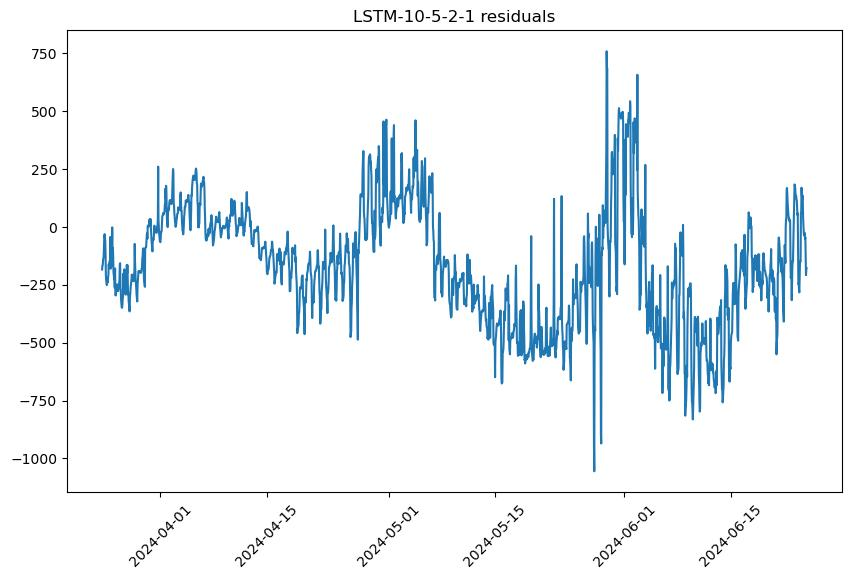

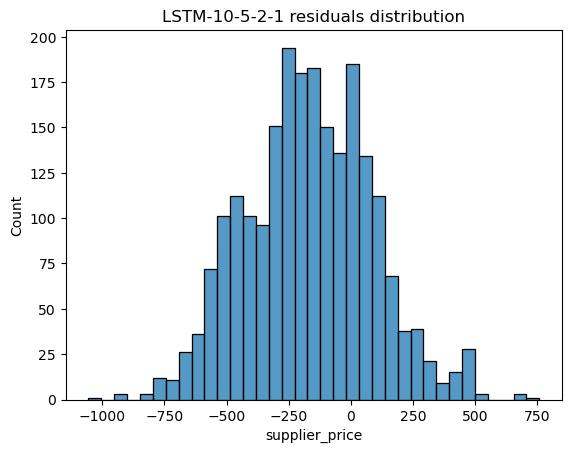

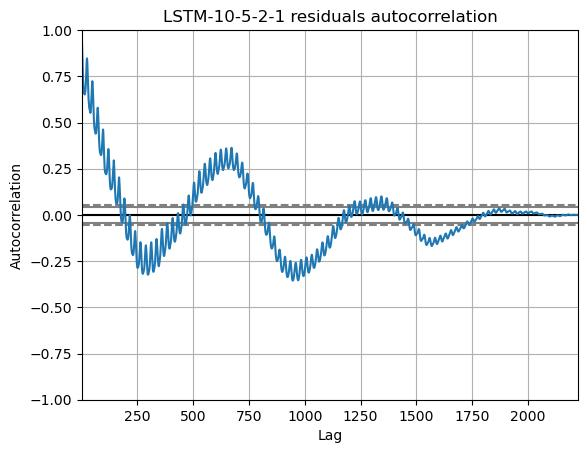

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:      Normal
4.3495211205102216

Jarque-Bera:               Normal
4.363190012092738

Kolmogorov-Smirnov:    NOT Normal
0.02532971677289292

Lilliefors:            NOT Normal
0.02532971677289292

Shapiro-Wilk:          NOT Normal
0.9966444373130798

Anderson–Darling:      NOT Normal
1.7254076071585587

Done!

----------------
LSTM-20-10-5-1 model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


<Figure size 700x600 with 0 Axes>

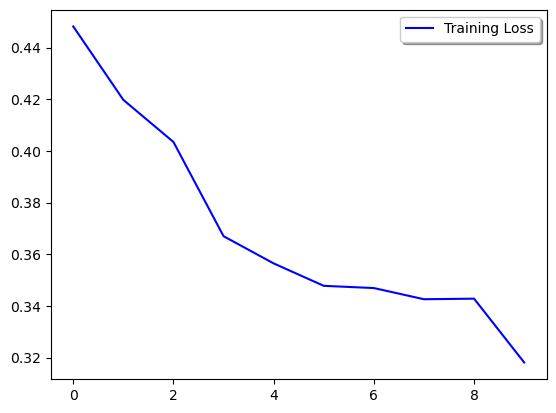

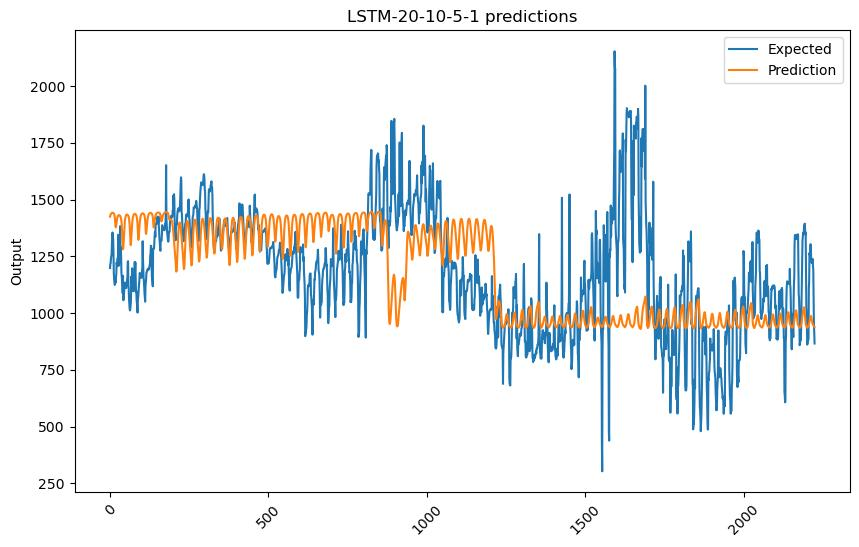

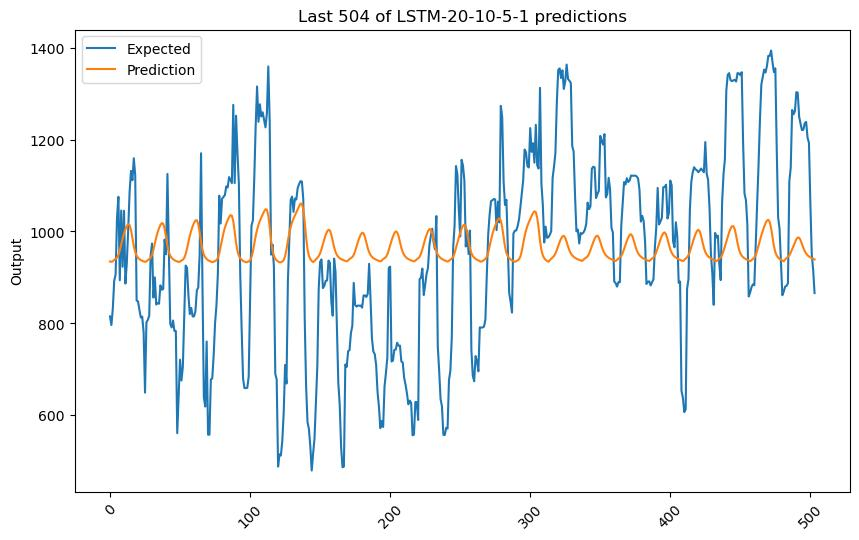

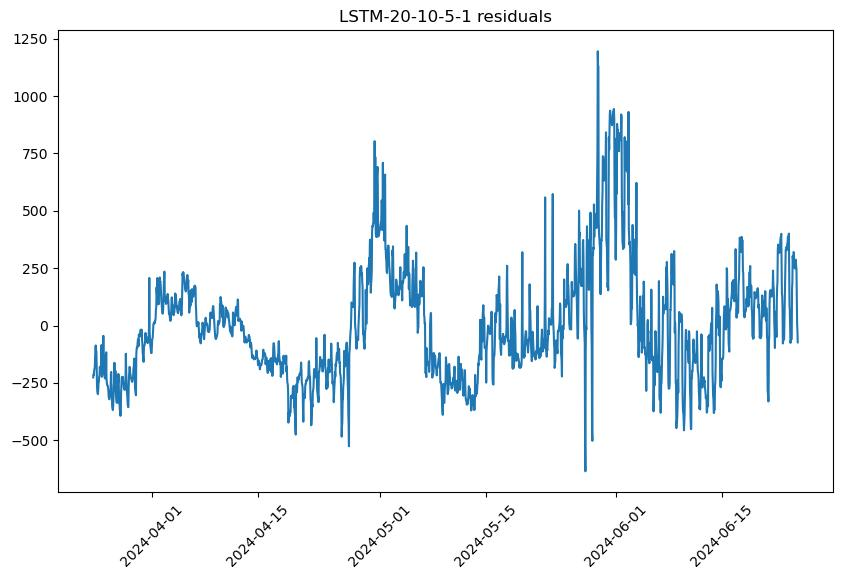

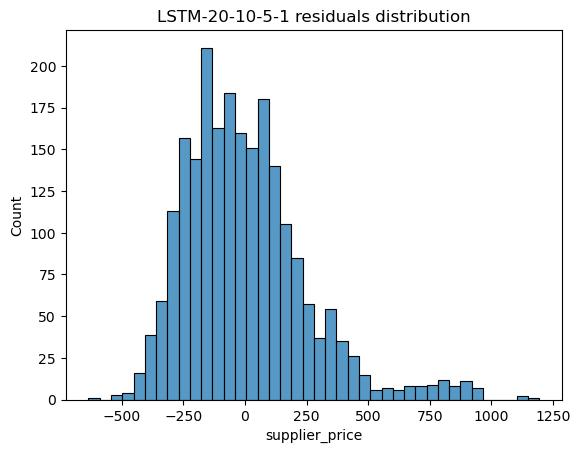

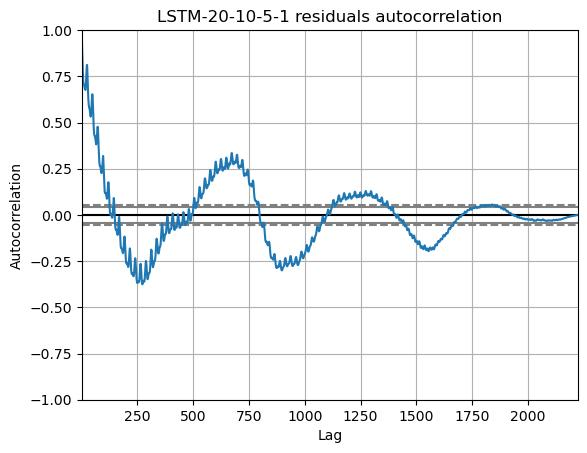

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
441.70674661443206

Jarque-Bera:           NOT Normal
913.737186582538

Kolmogorov-Smirnov:    NOT Normal
0.06377414666129244

Lilliefors:            NOT Normal
0.06377414666129244

Shapiro-Wilk:          NOT Normal
0.9332523345947266

Anderson–Darling:      NOT Normal
28.572199975231342

Done!

----------------
LSTM-20-10-5-2-1 model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


<Figure size 700x600 with 0 Axes>

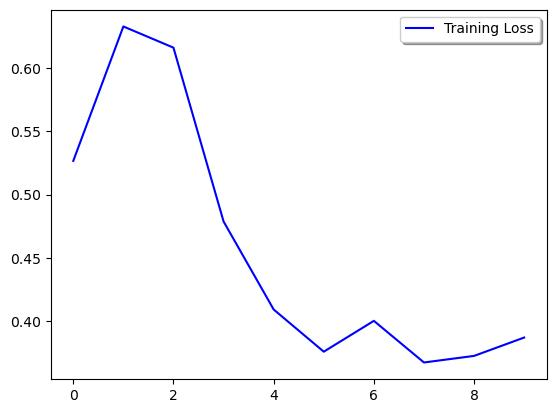

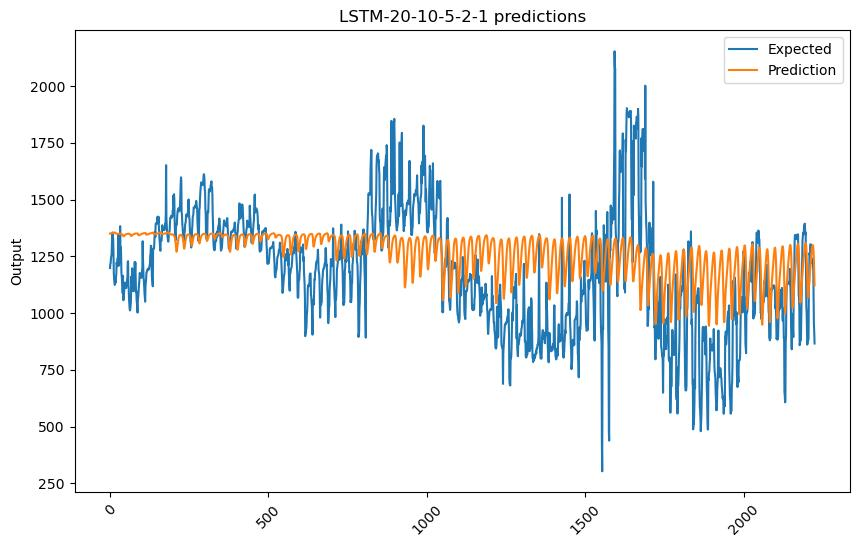

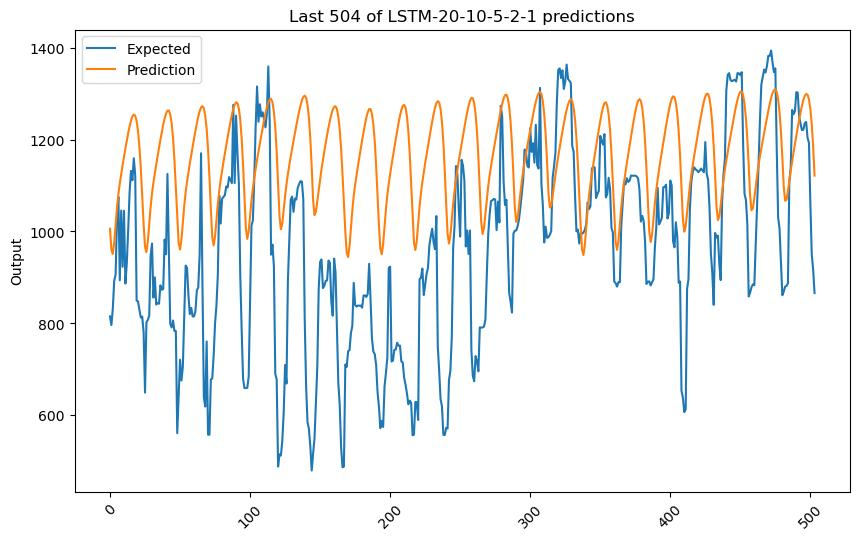

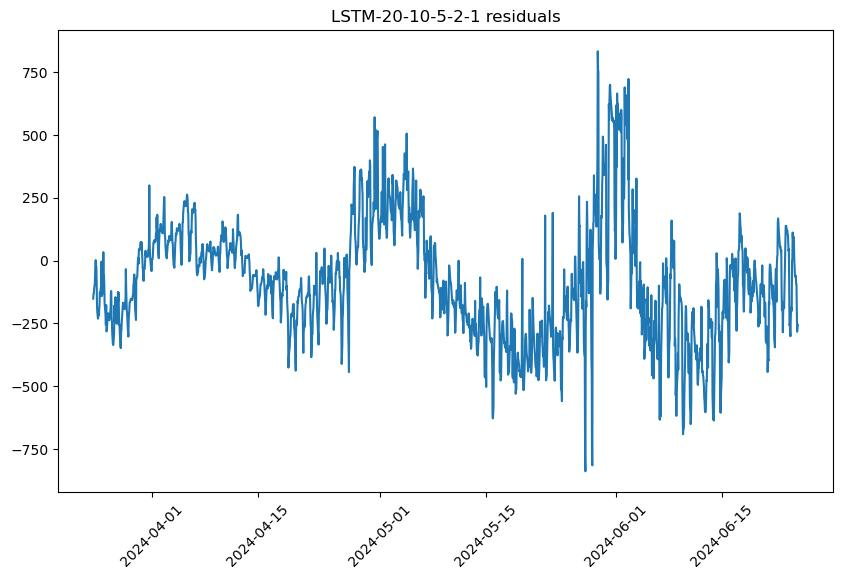

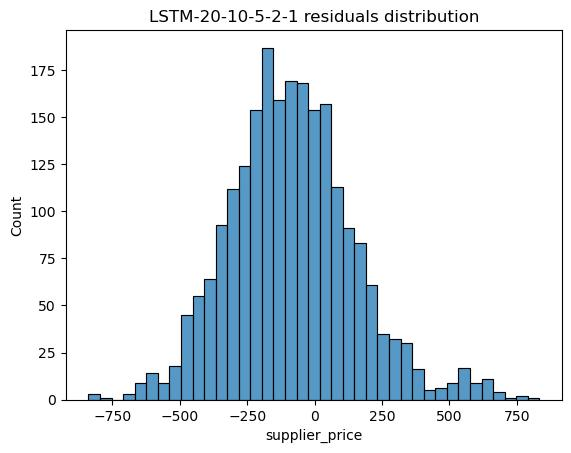

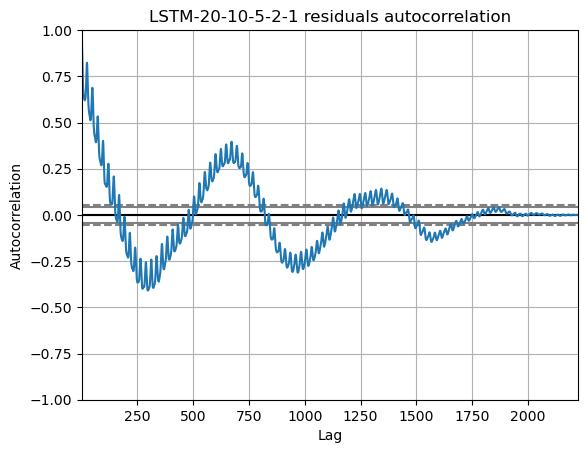

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
91.17475183255928

Jarque-Bera:           NOT Normal
118.16511533296577

Kolmogorov-Smirnov:    NOT Normal
0.036191257153135536

Lilliefors:            NOT Normal
0.036191257153135536

Shapiro-Wilk:          NOT Normal
0.9869084358215332

Anderson–Darling:      NOT Normal
5.1934288319394

Done!



In [25]:
for name, model_function in rnn_models:
    print('----------------')
    print(f'{name} model...')
    model_results = {
        'r2' : [],
        'mse' : [],
        'rmse' : [],
        'mae' : [],
        'mape' : [],
        'smape': [],
        'mase' : [],
        'msse' : [],
        'rmsse' : []
    }
    fold_num = 1
    timeFold = TimeSeriesSplit(n_splits = NUM_OF_SPLITS)
    for train_range, test_range in timeFold.split(df_train):
        print(f'Fold #{fold_num}...')
        train = df_train.iloc[train_range]
        test = df_train.iloc[test_range]
        scaler = StandardScaler()
        train_scaled = scaler.fit_transform(train)
        train_scaled = pd.DataFrame(train_scaled, columns = train.columns, index = train.index)
        test_scaled = scaler.transform(test)
        test_scaled = pd.DataFrame(test_scaled, columns = test.columns, index = test.index)
        x_train, y_train = create_dataset(train_scaled, target_column_name = TARGET_COLUMN, look_back = LOOK_BACK)
        x_test, y_test = create_dataset(test_scaled, target_column_name = TARGET_COLUMN, look_back = LOOK_BACK)
        model = model_function(INPUT_SHAPE_RECCURENT)
        train_history = model.fit(
            x = x_train,
            y = y_train,
            batch_size = BATCH_SIZE,
            epochs = EPOCHS,
            shuffle = False,
            verbose = 0).history
        y_pred = model.predict(x_test, verbose = 0)
        # We take last 'len(test) - LOOK_BACK - 1' (or 'x_test.shape[0]') rows from 'test'
        # because in the end we make predictions only for 'len(test) - LOOK_BACK - 1' rows
        last_rows_num = x_test.shape[0]
        x_test_df = test_scaled.drop(columns = TARGET_COLUMN)
        pred = x_test_df[-last_rows_num:].copy()
        pred[TARGET_COLUMN] = y_pred.flatten()
        pred = scaler.inverse_transform(pred)
        pred = pd.DataFrame(pred, columns = test.columns, index = test.index[-last_rows_num:])
        y_pred = pred[TARGET_COLUMN]
        y_test = test[TARGET_COLUMN][-last_rows_num:]
        model_results['r2'].append(r2(y_test, y_pred))
        model_results['mse'].append(mse(y_test, y_pred))
        model_results['rmse'].append(rmse(y_test, y_pred))
        model_results['mae'].append(mae(y_test, y_pred))
        model_results['mape'].append(mape(y_test, y_pred))
        model_results['smape'].append(smape(y_test, y_pred))
        y_train = train[TARGET_COLUMN][-last_rows_num:]
        model_results['mase'].append(mase(y_test, y_pred, y_train, sp = SEASONALITY))
        model_results['msse'].append(msse(y_test, y_pred, y_train, sp = SEASONALITY))
        model_results['rmsse'].append(rmsse(y_test, y_pred, y_train, sp = SEASONALITY))
        if fold_num == NUM_OF_SPLITS:
            show_training_history(train_history, ['loss'], ['Loss'])
            show_regression_chart(y_test, y_pred, f'{name} predictions', sort = False)
            show_regression_chart(
                y_test[-LATEST_PRED_AMOUNT:],
                y_pred[-LATEST_PRED_AMOUNT:],
                f'Last {LATEST_PRED_AMOUNT} of {name} predictions',
                sort = False
            )
            residuals = y_test - y_pred
            show_line_plot(residuals, f'{name} residuals')
            show_histogram(residuals, f'{name} residuals distribution')
            show_acf_plot(residuals, f'{name} residuals autocorrelation')
            print('-' * 10)
            print('Statistical test for normality of residuals:')
            print('-' * 10)
            print()
            run_tests_for_normality(residuals)
        fold_num += 1
    names.append(name)
    for model_result_key, model_result_value in model_results.items():
        results[model_result_key].append(model_result_value)
    print('Done!')
    print()

### Bidirectional LSTMs

In [26]:
from keras.layers import Bidirectional, LSTM

In [40]:
def get_bilstm_1(input_shape):
    model = Sequential(
        [
            Input(shape = input_shape),
            Bidirectional(
                layer = LSTM(10, return_sequences = True),
                backward_layer = LSTM(10, return_sequences = True, go_backwards = True)
            ),
            LSTM(5),
            Dense(1)
        ])
    model.compile(loss = 'mean_squared_error', optimizer = 'adam')
    return model

def get_bilstm_2(input_shape):
    model = Sequential(
        [
            Input(shape = input_shape),
            Bidirectional(
                layer = LSTM(5, return_sequences = True),
                backward_layer = LSTM(5, return_sequences = True, go_backwards = True)
            ),
            LSTM(2),
            Dense(1)
        ])
    model.compile(loss = 'mean_squared_error', optimizer = 'adam')
    return model

In [41]:
df_train = df_sup.copy()

LOOK_BACK = 24 * 7 
BATCH_SIZE = 32
EPOCHS = 10
NUM_OF_VARIABLES = df_train.shape[-1] - 1
INPUT_SHAPE_RECCURENT =  (LOOK_BACK, NUM_OF_VARIABLES,)

In [42]:
bilstm_models = []
bilstm_models.append(('BiLSTM-(10-10)-5-1', get_bilstm_1))
bilstm_models.append(('BiLSTM-(5-5)-2-1', get_bilstm_2))

----------------
BiLSTM-(10-10)-5-1 model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


<Figure size 700x600 with 0 Axes>

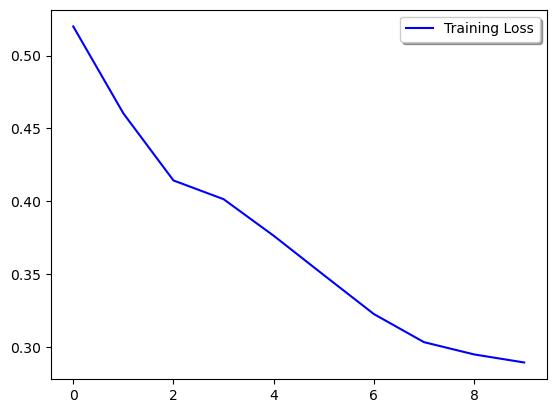

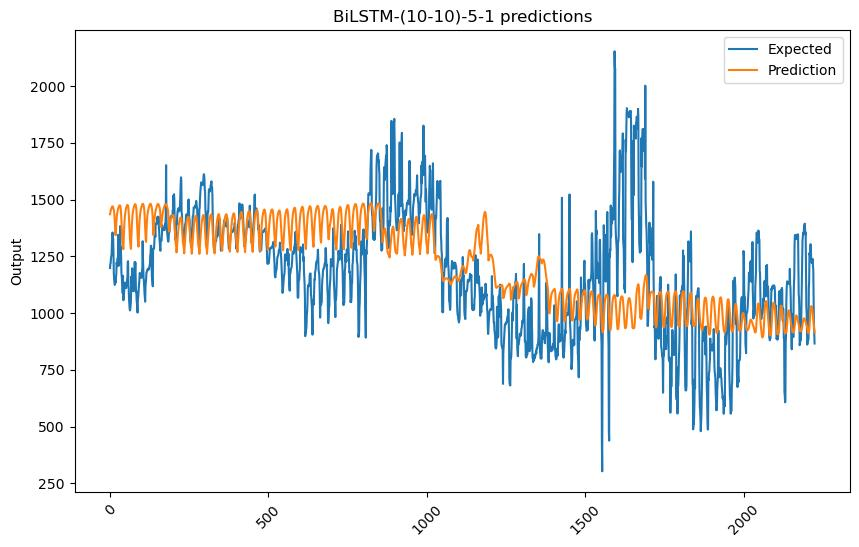

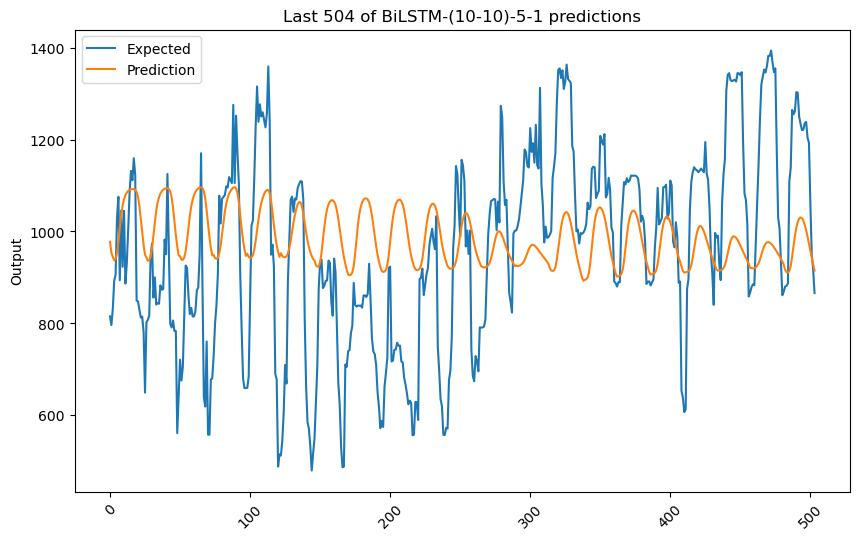

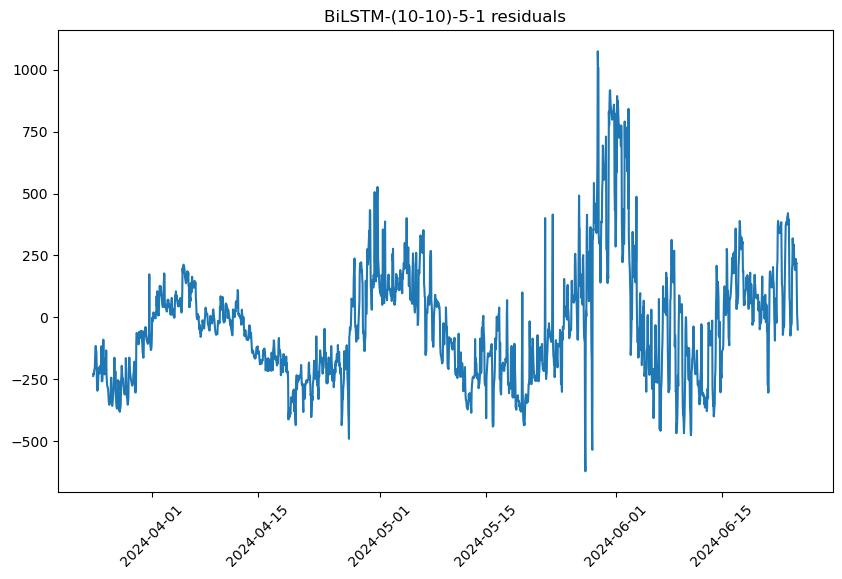

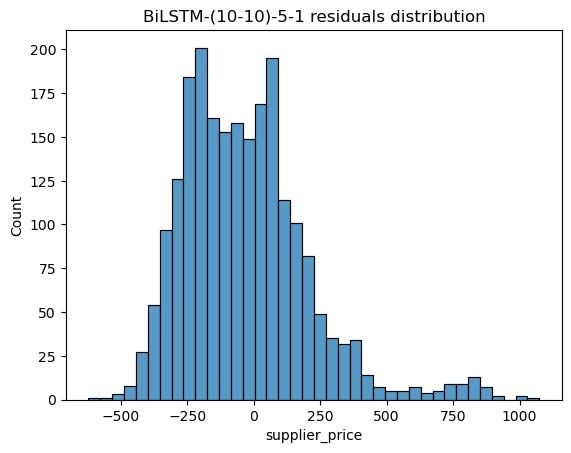

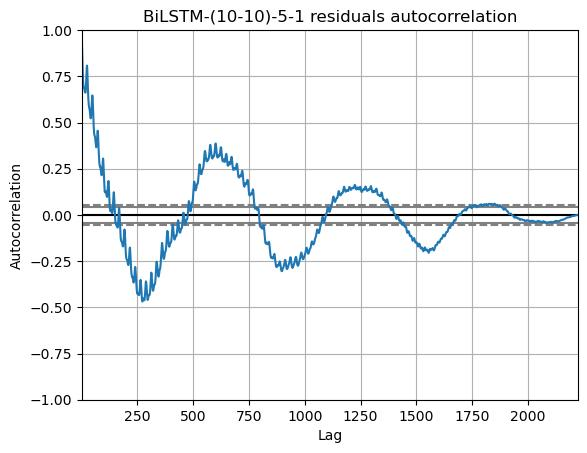

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
427.4257351811041

Jarque-Bera:           NOT Normal
896.7597121433525

Kolmogorov-Smirnov:    NOT Normal
0.057534658824894835

Lilliefors:            NOT Normal
0.057534658824894835

Shapiro-Wilk:          NOT Normal
0.9370774030685425

Anderson–Darling:      NOT Normal
23.290111823398547

Done!

----------------
BiLSTM-(5-5)-2-1 model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


<Figure size 700x600 with 0 Axes>

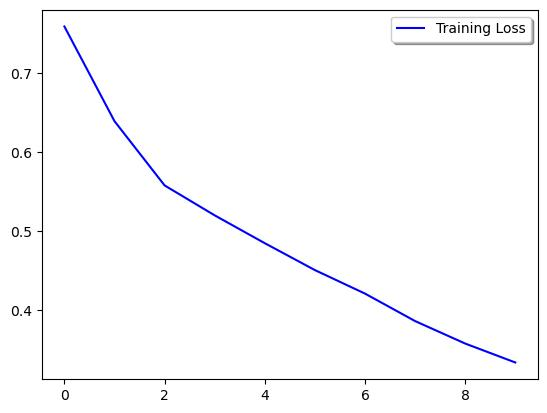

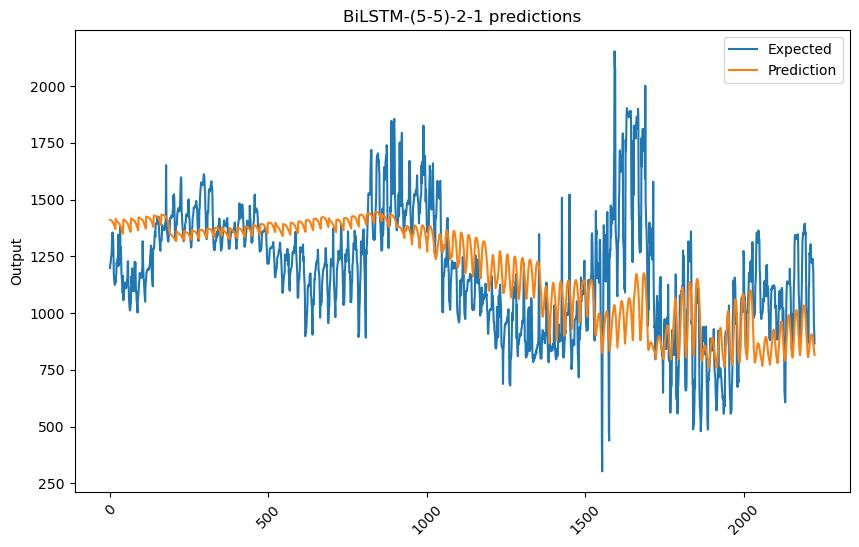

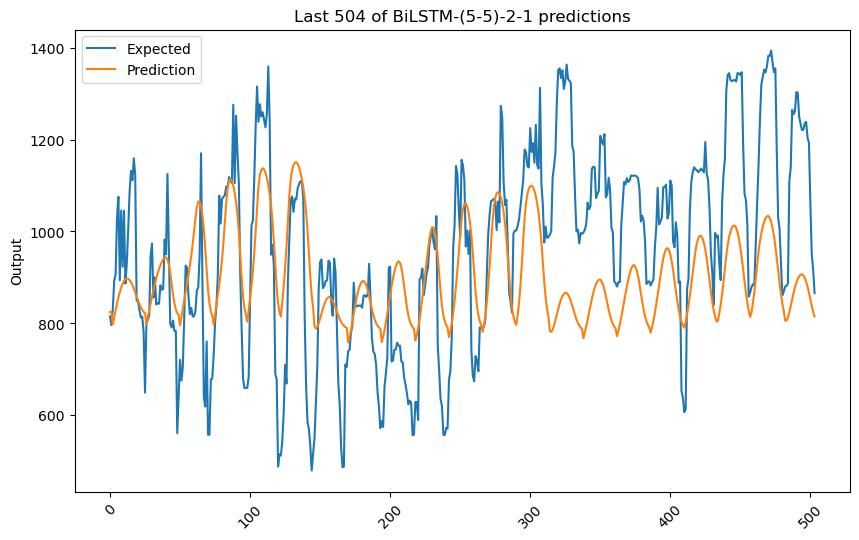

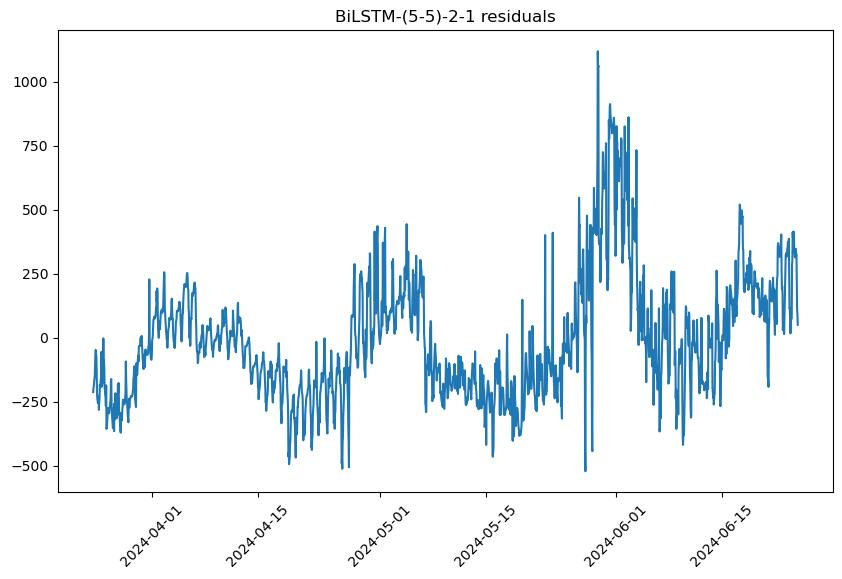

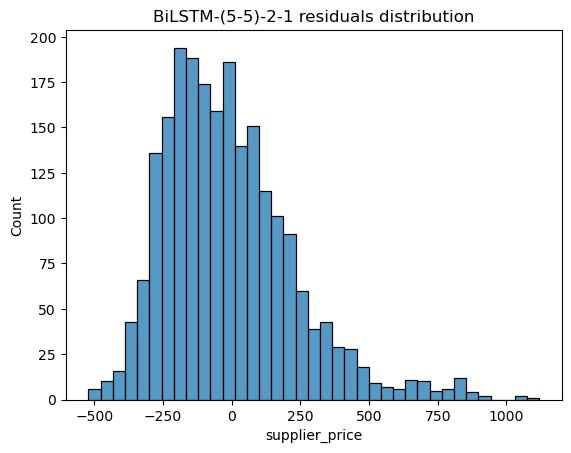

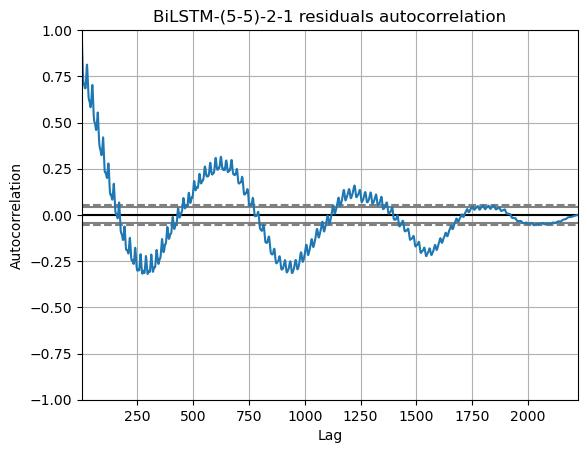

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
376.58261686102315

Jarque-Bera:           NOT Normal
686.4637804855483

Kolmogorov-Smirnov:    NOT Normal
0.06889482230991817

Lilliefors:            NOT Normal
0.06889482230991817

Shapiro-Wilk:          NOT Normal
0.9433507919311523

Anderson–Darling:      NOT Normal
25.874560510969786

Done!



In [43]:
for name, model_function in bilstm_models:
    print('----------------')
    print(f'{name} model...')
    model_results = {
        'r2' : [],
        'mse' : [],
        'rmse' : [],
        'mae' : [],
        'mape' : [],
        'smape': [],
        'mase' : [],
        'msse' : [],
        'rmsse' : []
    }
    fold_num = 1
    timeFold = TimeSeriesSplit(n_splits = NUM_OF_SPLITS)
    for train_range, test_range in timeFold.split(df_train):
        print(f'Fold #{fold_num}...')
        train = df_train.iloc[train_range]
        test = df_train.iloc[test_range]
        scaler = StandardScaler()
        train_scaled = scaler.fit_transform(train)
        train_scaled = pd.DataFrame(train_scaled, columns = train.columns, index = train.index)
        test_scaled = scaler.transform(test)
        test_scaled = pd.DataFrame(test_scaled, columns = test.columns, index = test.index)
        x_train, y_train = create_dataset(train_scaled, target_column_name = TARGET_COLUMN, look_back = LOOK_BACK)
        x_test, y_test = create_dataset(test_scaled, target_column_name = TARGET_COLUMN, look_back = LOOK_BACK)
        model = model_function(INPUT_SHAPE_RECCURENT)
        train_history = model.fit(
            x = x_train,
            y = y_train,
            batch_size = BATCH_SIZE,
            epochs = EPOCHS,
            shuffle = False,
            verbose = 0).history
        y_pred = model.predict(x_test, verbose = 0)
        # We take last 'len(test) - LOOK_BACK - 1' (or 'x_test.shape[0]') rows from 'test'
        # because in the end we make predictions only for 'len(test) - LOOK_BACK - 1' rows
        last_rows_num = x_test.shape[0]
        x_test_df = test_scaled.drop(columns = TARGET_COLUMN)
        pred = x_test_df[-last_rows_num:].copy()
        pred[TARGET_COLUMN] = y_pred.flatten()
        pred = scaler.inverse_transform(pred)
        pred = pd.DataFrame(pred, columns = test.columns, index = test.index[-last_rows_num:])
        y_pred = pred[TARGET_COLUMN]
        y_test = test[TARGET_COLUMN][-last_rows_num:]
        model_results['r2'].append(r2(y_test, y_pred))
        model_results['mse'].append(mse(y_test, y_pred))
        model_results['rmse'].append(rmse(y_test, y_pred))
        model_results['mae'].append(mae(y_test, y_pred))
        model_results['mape'].append(mape(y_test, y_pred))
        model_results['smape'].append(smape(y_test, y_pred))
        y_train = train[TARGET_COLUMN][-last_rows_num:]
        model_results['mase'].append(mase(y_test, y_pred, y_train, sp = SEASONALITY))
        model_results['msse'].append(msse(y_test, y_pred, y_train, sp = SEASONALITY))
        model_results['rmsse'].append(rmsse(y_test, y_pred, y_train, sp = SEASONALITY))
        if fold_num == NUM_OF_SPLITS:
            show_training_history(train_history, ['loss'], ['Loss'])
            show_regression_chart(y_test, y_pred, f'{name} predictions', sort = False)
            show_regression_chart(
                y_test[-LATEST_PRED_AMOUNT:],
                y_pred[-LATEST_PRED_AMOUNT:],
                f'Last {LATEST_PRED_AMOUNT} of {name} predictions',
                sort = False
            )
            residuals = y_test - y_pred
            show_line_plot(residuals, f'{name} residuals')
            show_histogram(residuals, f'{name} residuals distribution')
            show_acf_plot(residuals, f'{name} residuals autocorrelation')
            print('-' * 10)
            print('Statistical test for normality of residuals:')
            print('-' * 10)
            print()
            run_tests_for_normality(residuals)
        fold_num += 1
    names.append(name)
    for model_result_key, model_result_value in model_results.items():
        results[model_result_key].append(model_result_value)
    print('Done!')
    print()

### Results

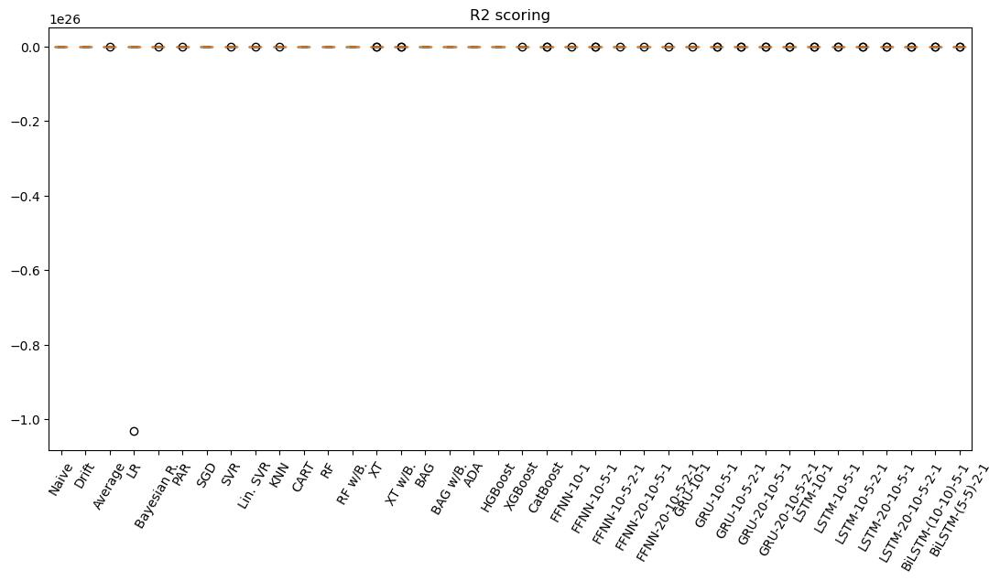

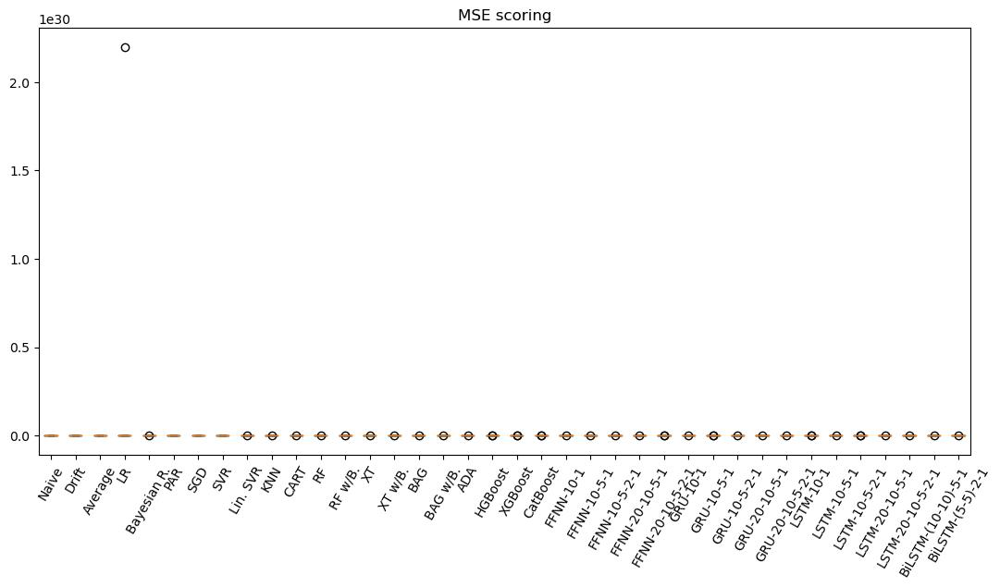

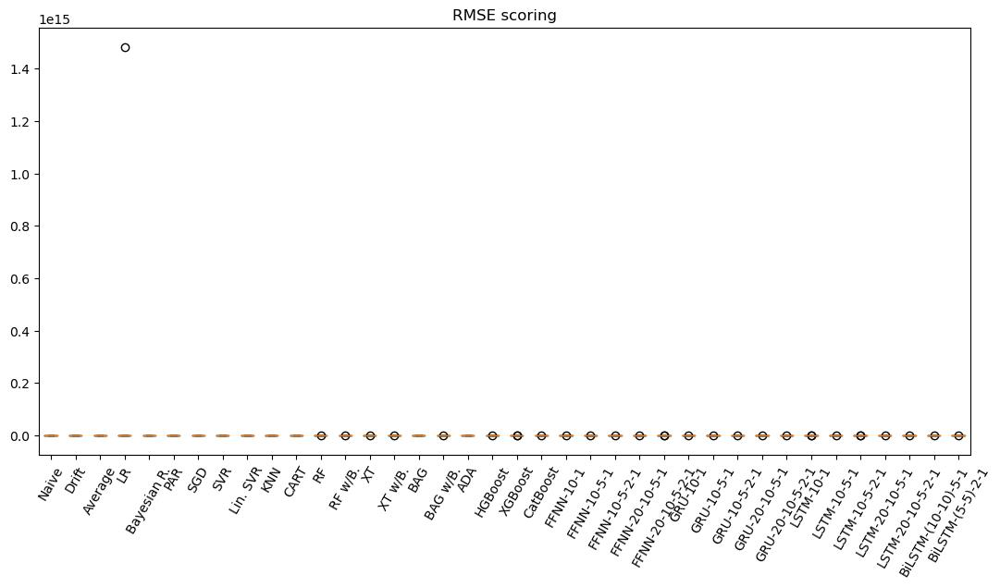

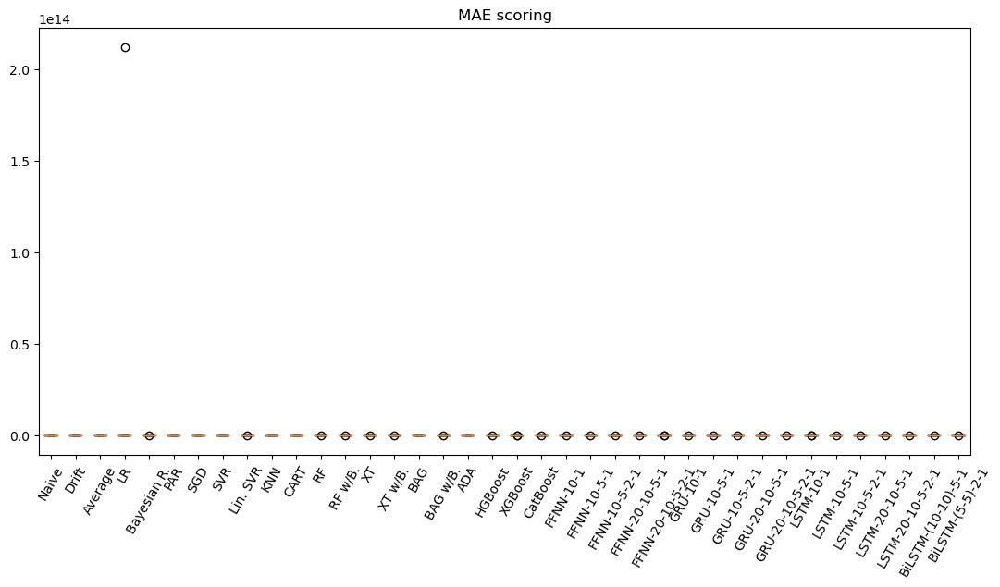

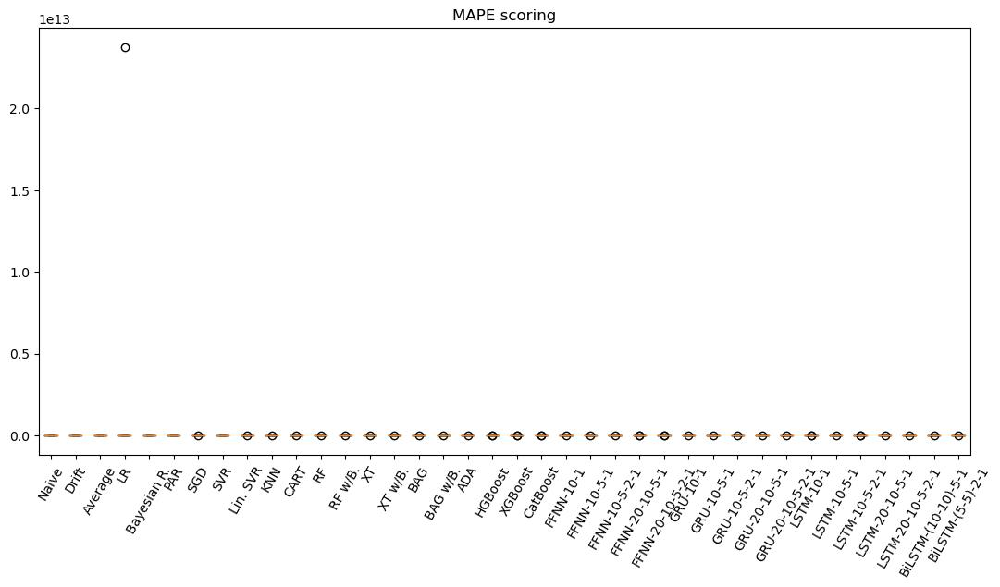

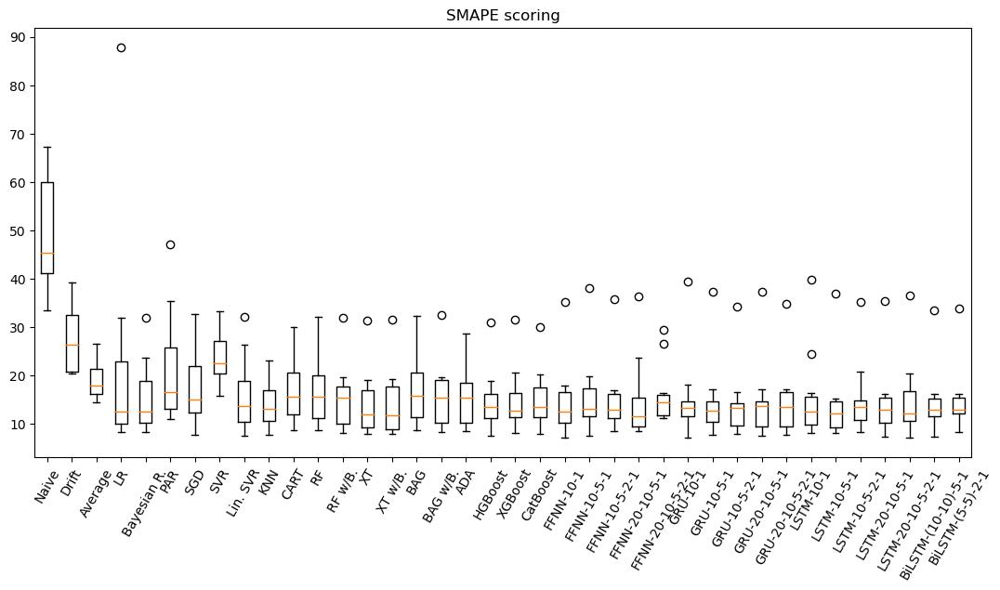

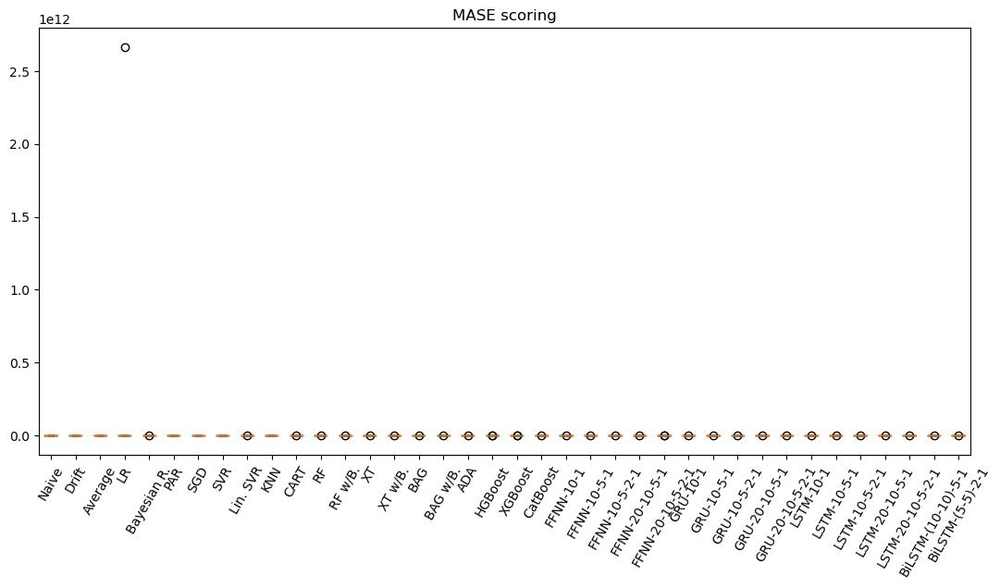

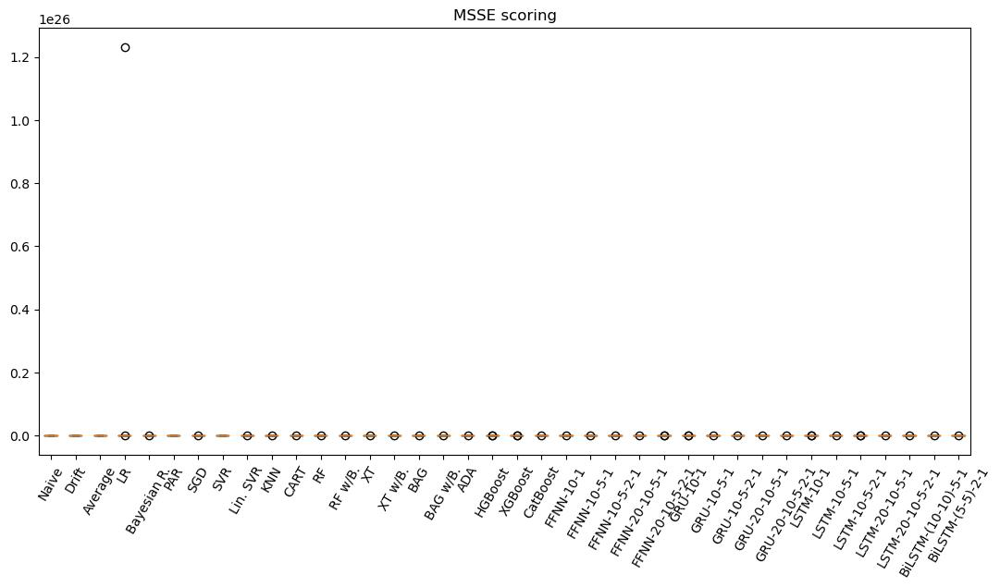

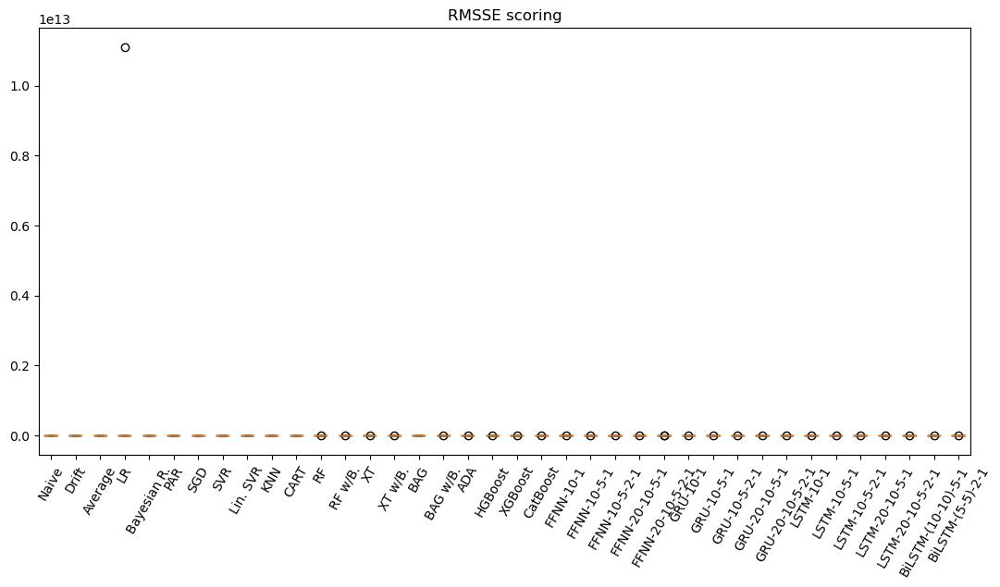

In [44]:
for result_key, result_value in results.items():
    plt.figure(figsize = (13, 6))
    plt.title(f'{result_key.upper()} scoring')
    plt.boxplot(result_value, labels = names)
    plt.xticks(rotation = 60)
    plt.show()

In [29]:
results_table = pd.DataFrame(results, index = names)
results_table.index.name = 'Name'
results_table = results_table.applymap(lambda x: np.median(x))
results_table = results_table.applymap(lambda x: round(x, ndigits = 3))
results_table

,r2,mse,rmse,mae,mape,smape,mase,msse,rmsse
Name,,,,,,,,,
"ARIMA(1,0,0)(2,1,0)[24]",-0.363,31722.196,177.128,144.783,13.178,12.893,1.889,2.389,1.532
Naive,-7.336,193192.865,439.363,402.706,36.548,45.318,5.406,16.024,4.002
Drift,-2.206,117754.578,343.128,281.342,22.169,26.301,3.828,9.945,3.152
Average,-0.802,44593.109,211.061,180.187,17.768,17.810,2.399,3.722,1.922
LR,-0.551,32299.915,178.737,139.601,13.948,12.610,1.829,2.392,1.543
Bayesian R.,-0.333,26877.650,163.911,130.751,12.998,12.613,1.694,1.949,1.395
PAR,-1.371,51584.149,224.756,181.704,15.133,16.592,2.451,4.144,2.014
SGD,-0.601,36941.101,192.130,154.005,16.679,15.073,2.019,2.789,1.667
SVR,-1.454,78852.167,280.761,242.999,20.419,22.483,3.309,6.829,2.612


In [31]:
def get_min_errors(results_table, metric_columns):
    methods = []
    errors = []
    for column in results_table[metric_columns]:
        if column.lower() == 'r2':
            index_of_max = results_table[column].idxmax()
            methods.append(index_of_max)
            errors.append(results_table[column][index_of_max])
        else:
            index_of_min = results_table[column].idxmin()
            methods.append(index_of_min)
            errors.append(results_table[column][index_of_min])
    return pd.DataFrame(data = {'Method': methods, 'Error': errors}, index = metric_columns)

metric_columns = [
    'r2',
    'mse',
    'rmse',
    'mae',
    'mape',
    'smape',
    'mase',
    'msse',
    'rmsse'
]

print('Minimal errors:')
get_min_errors(results_table, metric_columns)

Minimal errors:


,Method,Error
r2,LSTM-20-10-5-2-1,0.003
mse,XT w/B.,21261.735
rmse,XT w/B.,145.639
mae,LSTM-10-5-1,116.246
mape,FFNN-20-10-5-1,10.851
smape,FFNN-20-10-5-1,11.491
mase,XT w/B.,1.477
msse,XT,1.505
rmsse,XT,1.227


#### Saving results

In [47]:
from datetime import datetime

today = datetime.now()
today_formatted = today.strftime("%Y_%m_%d__%H_%M_%S")
print(f'Today is: {today_formatted}')

Today is: 2024_06_26__23_20_48


In [48]:
#results_table.to_csv(f'{drive_path}/price_forecasting_results__{today_formatted}.csv', index = True)
results_table.to_csv(f'price_forecasting_results__{today_formatted}.csv', index = True)

# Conclusions

Popular ML and DL models can't predict prices of Russian day-ahead wholesale electricity market accurately enough.

Recurrent neural networks despite being effective with sequenced data hardly compete with perceptrons and ensembles in terms of forecast accuracy.

Only time features (year, month, day, etc.) were used for the forecasts but the consumer demand feature might be useful for more accurate forecasts.

Further investigation of the topic is needed.